Import images edited with Clahe

In [ ]:
import os
import tensorflow as tf
from sklearn.model_selection import train_test_split

#  Directories
BASE_PROCESSED_DIR = r"C:\Users\majas\Desktop\besonders schlechte masken\bearbeitete_xrays"

#  Function: Collect processed images & masks
def collect_processed_images_and_masks(base_dir):
    image_paths, mask_paths = []

    for cls in ["COVID", "Normal", "Lung_Opacity", "Viral Pneumonia"]:
        images_dir = os.path.join(base_dir, cls, "images")
        masks_dir = os.path.join(base_dir, cls, "masks")

        if not os.path.exists(images_dir) or not os.path.exists(masks_dir):
            print(f"⚠ WARNING: Missing folders for class '{cls}', skipping...")
            continue

        img_files = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith((".png", ".jpg", ".jpeg"))])
        mask_files = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith((".png", ".jpg", ".jpeg"))])

        if len(img_files) != len(mask_files):
            print(f"⚠ WARNING: Class '{cls}' has {len(img_files)} images but {len(mask_files)} masks!")

        image_paths.extend(img_files)
        mask_paths.extend(mask_files)

    return image_paths, mask_paths

#  Collect images & masks
image_paths, mask_paths = collect_processed_images_and_masks(BASE_PROCESSED_DIR)

if len(image_paths) == 0 or len(mask_paths) == 0:
    raise ValueError(" ERROR: No processed images or masks found! Check the dataset folder.")

print(f" Total images: {len(image_paths)}, Total masks: {len(mask_paths)}")

#  Split into Train (70%), Validation (20%), Test (10%)
train_images, temp_images, train_masks, temp_masks = train_test_split(image_paths, mask_paths, test_size=0.3, random_state=42)
valid_images, test_images, valid_masks, test_masks = train_test_split(temp_images, temp_masks, test_size=0.33, random_state=42)

print(f" Training: {len(train_images)} images")
print(f" Validation: {len(valid_images)} images")
print(f" Test: {len(test_images)} images")


def load_image_and_mask_with_path(image_path, mask_path):
    # Load image
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=1)
    image = tf.image.resize(image, [256, 256]) / 255.0

    # Load mask
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.image.resize(mask, [256, 256]) / 255.0

    return image, mask, image_path  

#  Dataset creation with file paths
def create_tf_dataset(image_paths, mask_paths, batch_size=8, shuffle=True):
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    dataset = dataset.map(load_image_and_mask_with_path, num_parallel_calls=tf.data.AUTOTUNE)

    if shuffle:
        dataset = dataset.shuffle(buffer_size=1000)

    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

#  Create Train, Validation & Test datasets
train_dataset = create_tf_dataset(train_images, train_masks, batch_size=4, shuffle=True)
valid_dataset = create_tf_dataset(valid_images, valid_masks, batch_size=4, shuffle=False)
test_dataset  = create_tf_dataset(test_images,  test_masks,  batch_size=4, shuffle=False)

print(" Datasets with file paths created successfully!")


📊 Gesamtbilder: 21165, Gesamtmasken: 21165
✅ Training: 14815 Bilder
✅ Validation: 4254 Bilder
✅ Test: 2096 Bilder
✅ Datensätze mit Pfaden erfolgreich erstellt!


Show the 20 worst masks

💻 TensorFlow verwendet folgende Geräte:
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

🔍 Evaluierung läuft...


Processing Batches: 100%|██████████| 1064/1064 [10:27<00:00,  1.70it/s]



📸 Zeige die 20 schlechtesten Masken mit Dateipfaden:



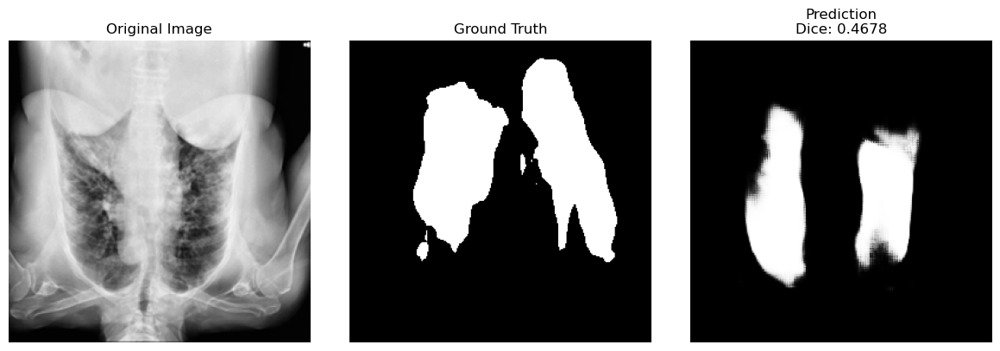

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\COVID\images\COVID-3342.png
--------------------------------------------------------------------------------


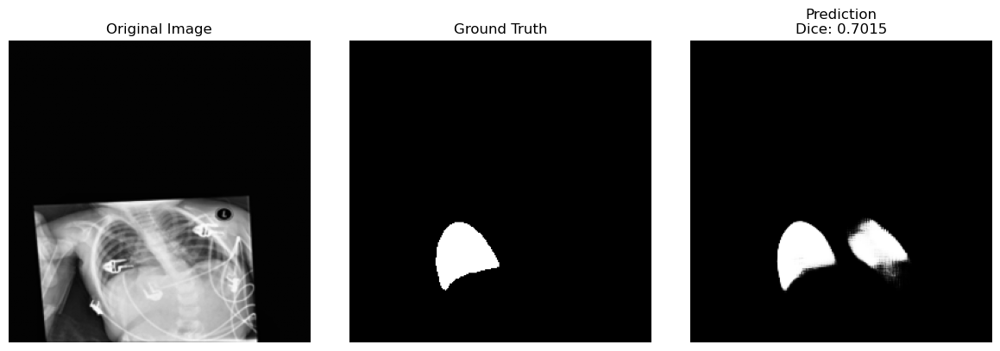

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-4291.png
--------------------------------------------------------------------------------


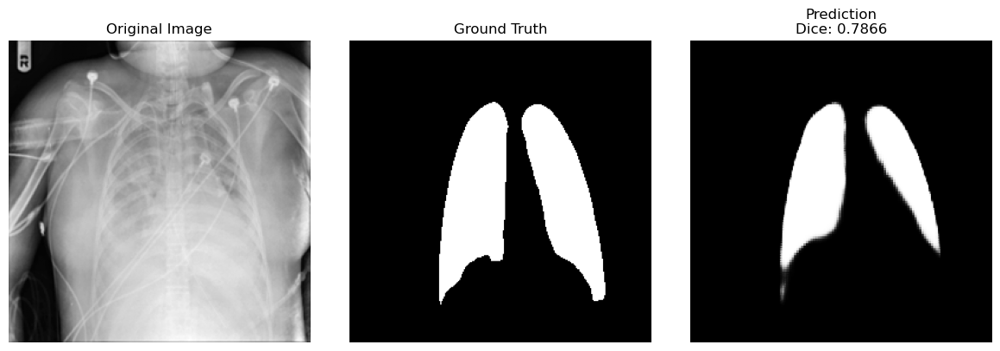

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-5950.png
--------------------------------------------------------------------------------


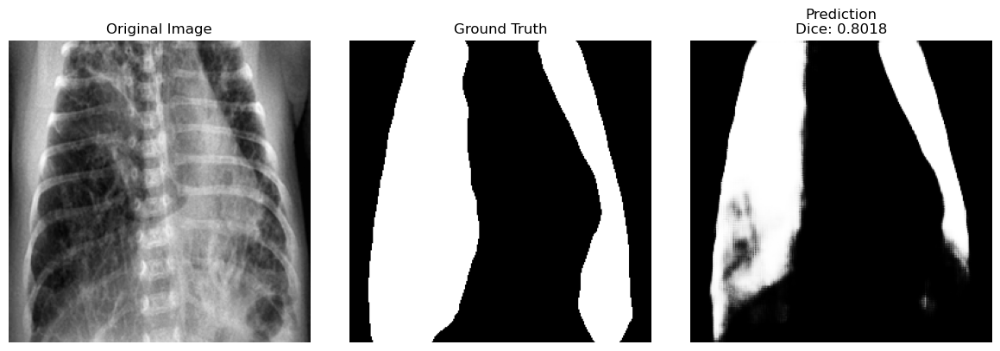

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Viral Pneumonia\images\Viral Pneumonia-768.png
--------------------------------------------------------------------------------


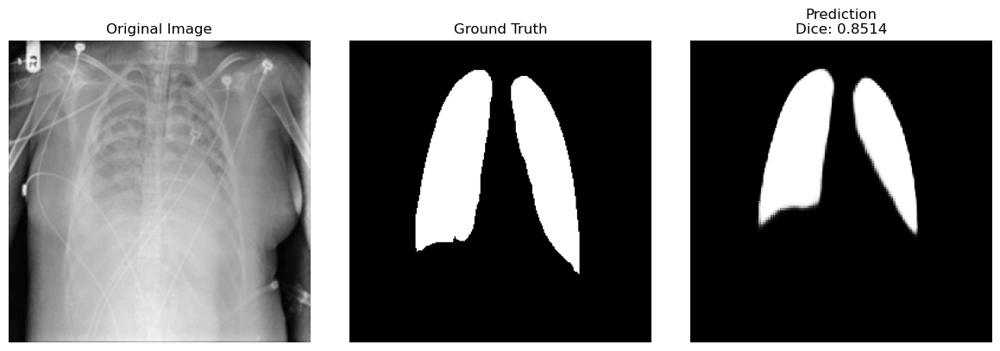

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-726.png
--------------------------------------------------------------------------------


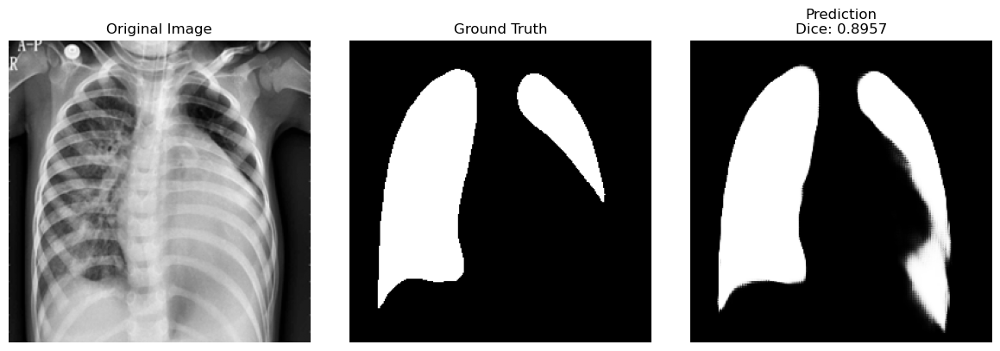

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Viral Pneumonia\images\Viral Pneumonia-221.png
--------------------------------------------------------------------------------


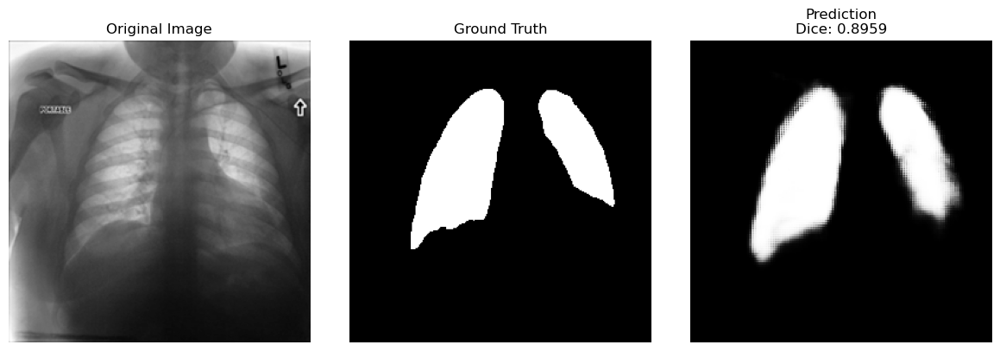

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Normal\images\Normal-7771.png
--------------------------------------------------------------------------------


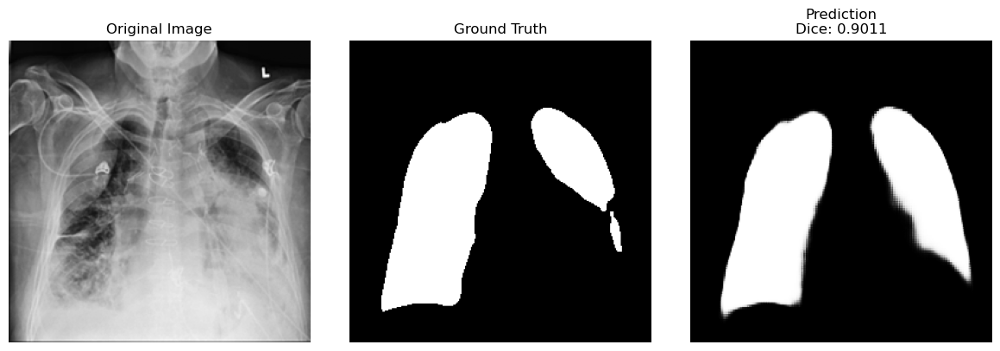

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-3123.png
--------------------------------------------------------------------------------


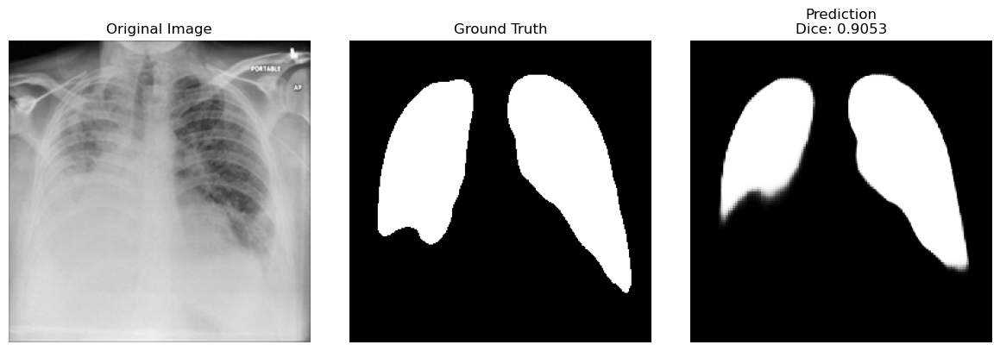

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-2434.png
--------------------------------------------------------------------------------


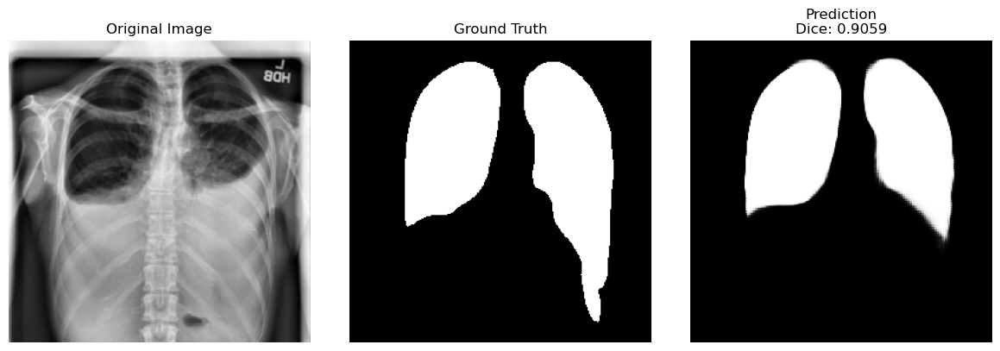

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-485.png
--------------------------------------------------------------------------------


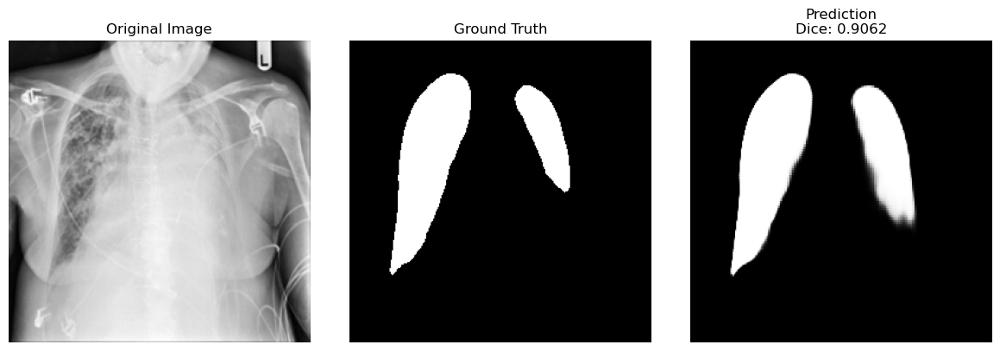

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-4212.png
--------------------------------------------------------------------------------


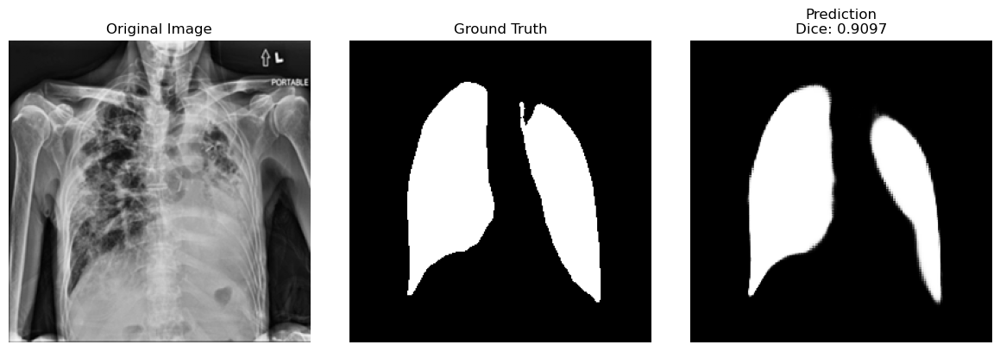

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-533.png
--------------------------------------------------------------------------------


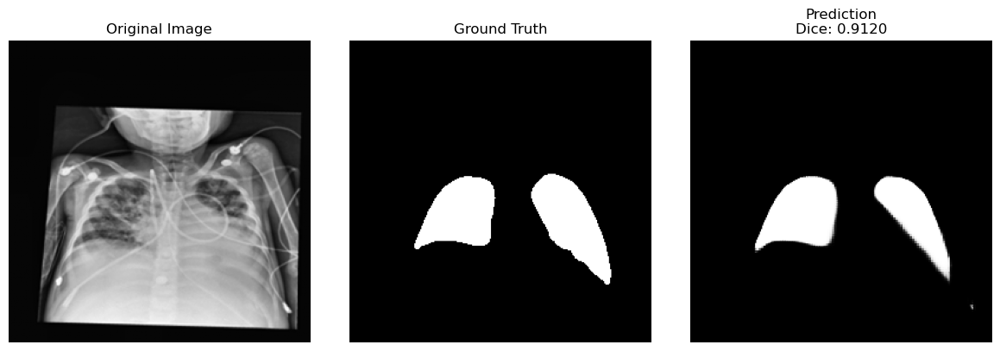

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-3788.png
--------------------------------------------------------------------------------


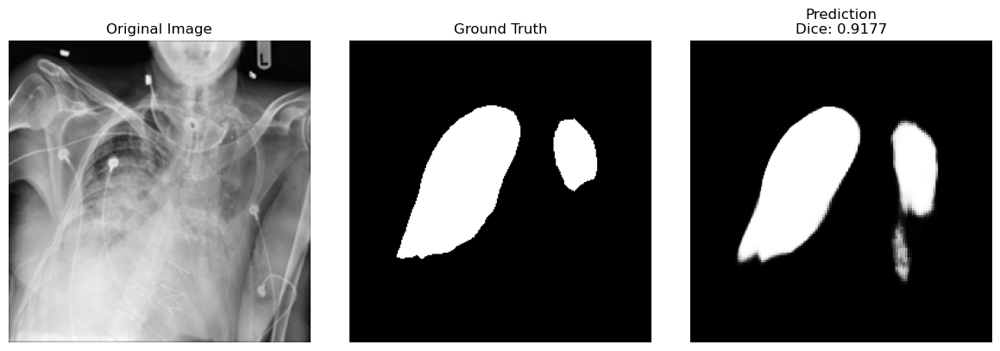

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-5766.png
--------------------------------------------------------------------------------


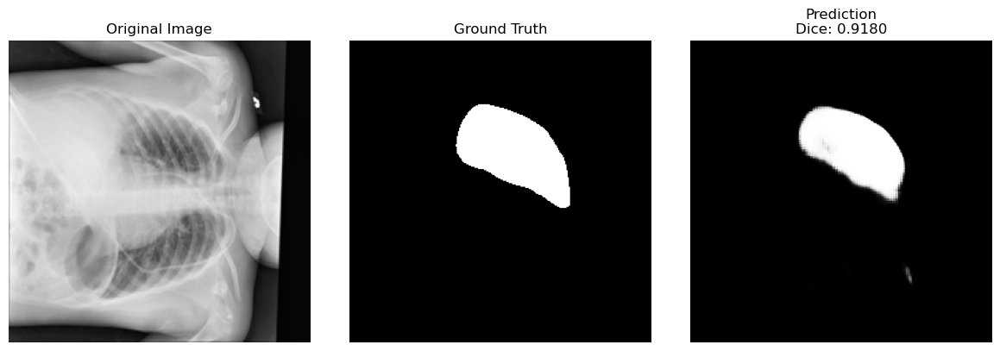

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-1893.png
--------------------------------------------------------------------------------


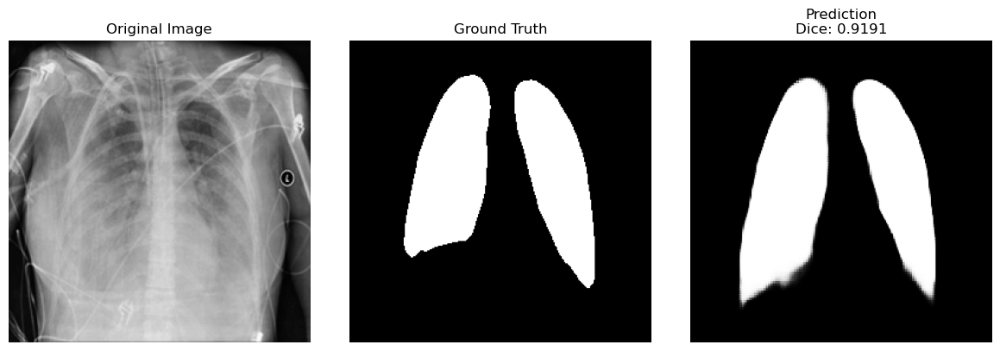

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-1497.png
--------------------------------------------------------------------------------


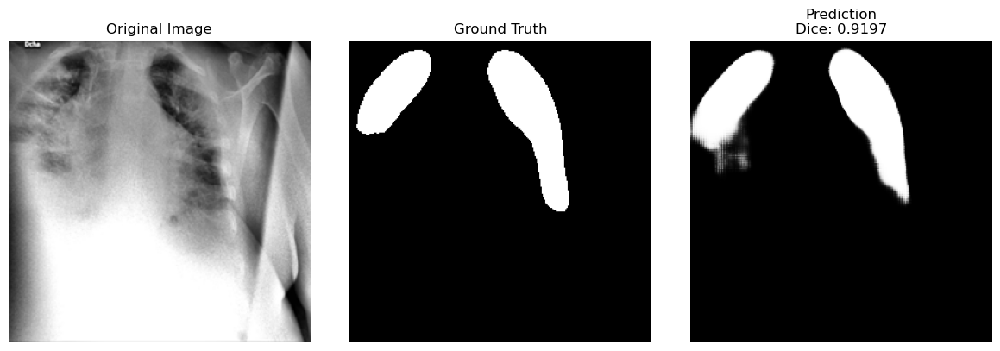

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\COVID\images\COVID-1675.png
--------------------------------------------------------------------------------


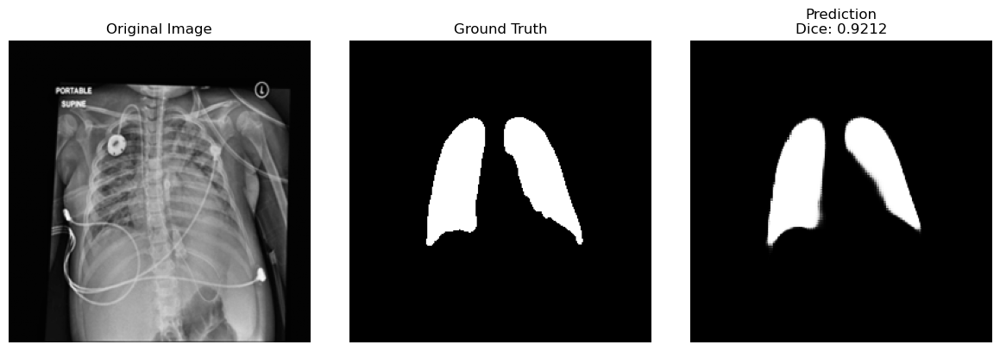

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-3821.png
--------------------------------------------------------------------------------


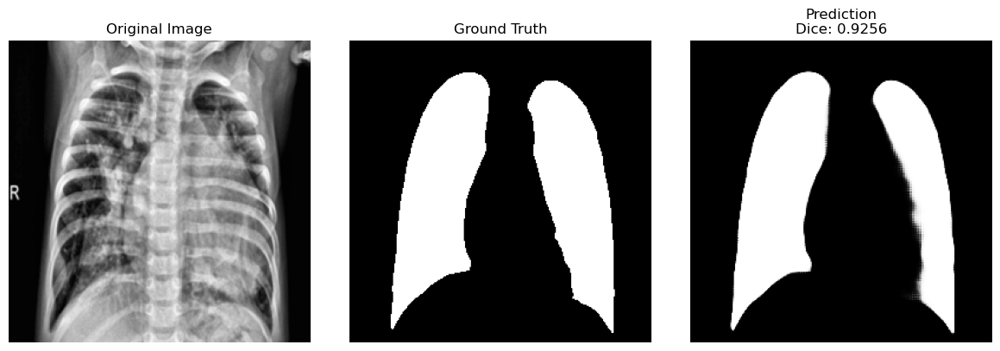

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Viral Pneumonia\images\Viral Pneumonia-600.png
--------------------------------------------------------------------------------


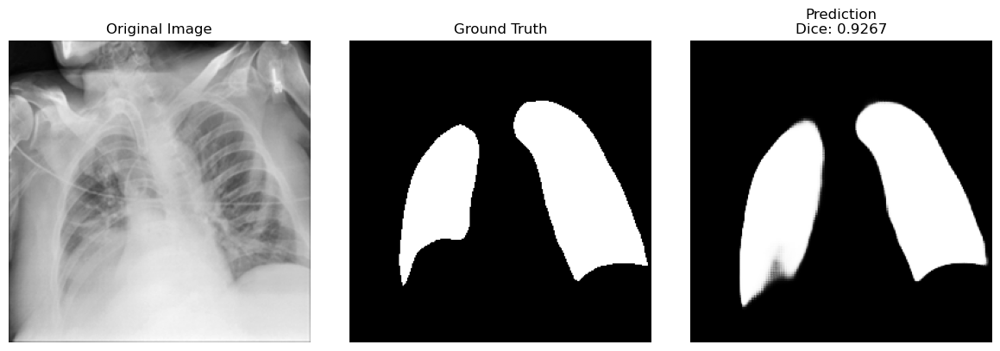

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-1318.png
--------------------------------------------------------------------------------


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
import tensorflow as tf
from tqdm import tqdm
import os

#  GPU check
print(" TensorFlow is using the following devices:")
print(tf.config.list_physical_devices('GPU'))

#  Model path
MODEL_PATH = r"C:\Users\majas\Desktop\masken 2\entwickeltes_masken_model.h5"
model = tf.keras.models.load_model(MODEL_PATH, compile=False)

#  Dice function
def dice_coefficient(y_true, y_pred, smooth=1e-6):
    y_true = y_true.astype(np.float32)
    y_pred = y_pred.astype(np.float32)
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection + smooth) / (np.sum(y_true) + np.sum(y_pred) + smooth)

#  Collectors
dice_scores = []
images = []
masks = []
predictions = []
image_paths = []

#  Iterate through validation set (with paths)
print("\n Evaluation in progress...")
for batch in tqdm(valid_dataset, desc="Processing Batches"):
    x_batch, y_true_batch, path_batch = batch  # ← Paths are included
    y_pred_batch = model.predict(x_batch, verbose=0)
    
    for i in range(len(x_batch)):
        y_true = y_true_batch[i].numpy()
        y_pred = y_pred_batch[i]
        score = dice_coefficient(y_true, y_pred > 0.5)

        dice_scores.append(score)
        images.append(x_batch[i].numpy())
        masks.append(y_true)
        predictions.append(y_pred)

        #  Decode path
        image_paths.append(path_batch[i].numpy().decode("utf-8"))

#  Find worst results
worst_indices = np.argsort(dice_scores)[:20]

#  Visualize + show paths
print("\n Displaying the 20 worst masks with file paths:\n")
for idx in worst_indices:
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    
    axes[0].imshow(images[idx].squeeze(), cmap='gray')
    axes[0].set_title("Original Image")
    
    axes[1].imshow(masks[idx].squeeze(), cmap='gray')
    axes[1].set_title("Ground Truth")
    
    axes[2].imshow(predictions[idx].squeeze(), cmap='gray')
    axes[2].set_title(f"Prediction\nDice: {dice_scores[idx]:.4f}")

    for ax in axes:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

    #  Print file path
    print(f" Image path: {image_paths[idx]}")
    print("-" * 80)


Convert masks generated with labelme to PNG (there were more, I always used the same code)

In [ ]:
import os
import json
import numpy as np
import cv2
from labelme import utils
import base64

# Paths
input_dir = r"C:\Users\majas\Desktop\besonders schlechte masken\neue masken"
output_dir = r"C:\Users\majas\Desktop\besonders schlechte masken\neuer datensatz\neue masken"

# Create output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Iterate through all JSON files
for filename in os.listdir(input_dir):
    if not filename.endswith(".json"):
        continue

    json_path = os.path.join(input_dir, filename)
    print(f"Processing {filename}...")

    # Load JSON
    with open(json_path) as f:
        data = json.load(f)

    # Get image size
    imageData = data.get("imageData")
    if imageData is None:
        imagePath = os.path.join(input_dir, data["imagePath"])
        with open(imagePath, "rb") as f:
            imageData = utils.img_b64encode(f.read()).decode("utf-8")

    # Convert base64 to image array
    img_bytes = base64.b64decode(imageData)
    img = utils.img_data_to_arr(img_bytes)
    height, width = img.shape[:2]

    # Initialize mask
    mask = np.zeros((height, width), dtype=np.uint8)

    # Draw each shape onto the mask
    for shape in data["shapes"]:
        points = np.array(shape["points"], dtype=np.int32)
        label = shape["label"]

        # Here: 255 = white = object mask
        cv2.fillPoly(mask, [points], 255)

    # Save the mask
    mask_filename = os.path.splitext(filename)[0] + "_mask.png"
    mask_path = os.path.join(output_dir, mask_filename)
    cv2.imwrite(mask_path, mask)

print("✅ Done! Masks have been saved to:", output_dir)


Verarbeite COVID-1524.json...
Verarbeite COVID-2558.json...
Verarbeite Lung_Opacity-2950.json...
Verarbeite Lung_Opacity-4735.json...
Verarbeite Lung_Opacity-5552.json...
Verarbeite Lung_Opacity-5581.json...
Verarbeite Lung_Opacity-5626.json...
Verarbeite Lung_Opacity-585.json...
✅ Fertig! Masken wurden gespeichert in: C:\Users\majas\Desktop\besonders schlechte masken\neuer datensatz\neue masken


the 21-40 worst masks

💻 TensorFlow verwendet folgende Geräte:
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

🔍 Evaluierung läuft...


Processing Batches: 100%|██████████| 1064/1064 [11:56<00:00,  1.49it/s]



📸 Zeige die 21. bis 40. schlechtesten Masken mit Dateipfaden:



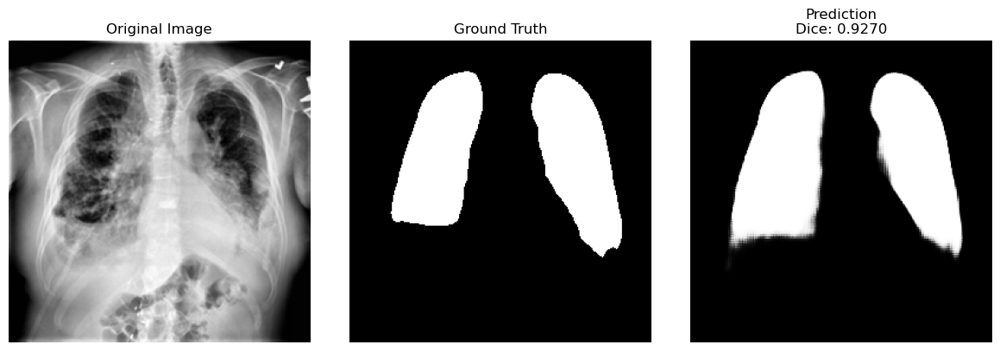

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-5259.png
--------------------------------------------------------------------------------


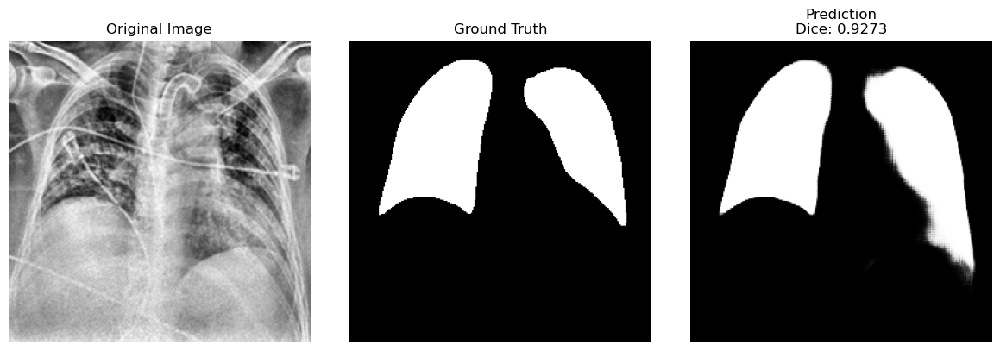

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\COVID\images\COVID-1524.png
--------------------------------------------------------------------------------


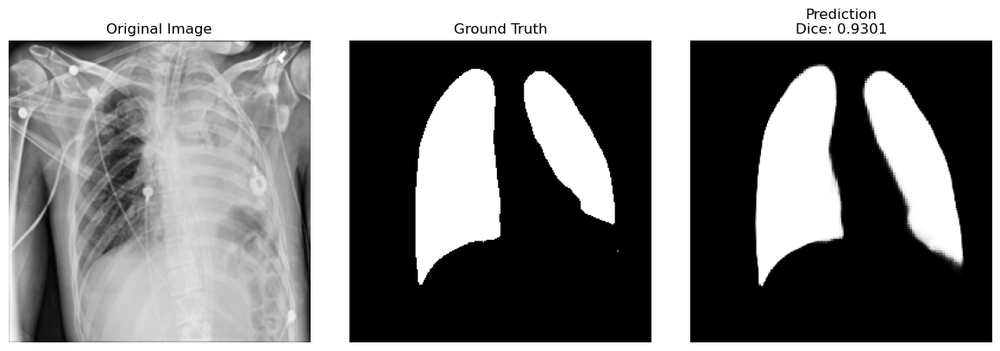

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-4735.png
--------------------------------------------------------------------------------


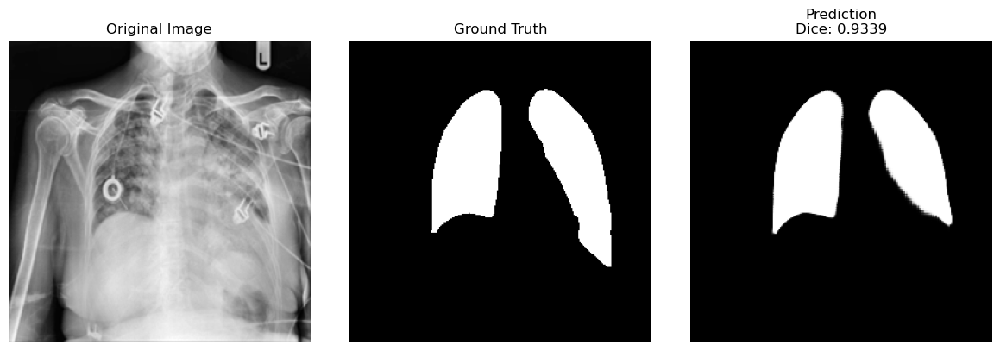

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-5512.png
--------------------------------------------------------------------------------


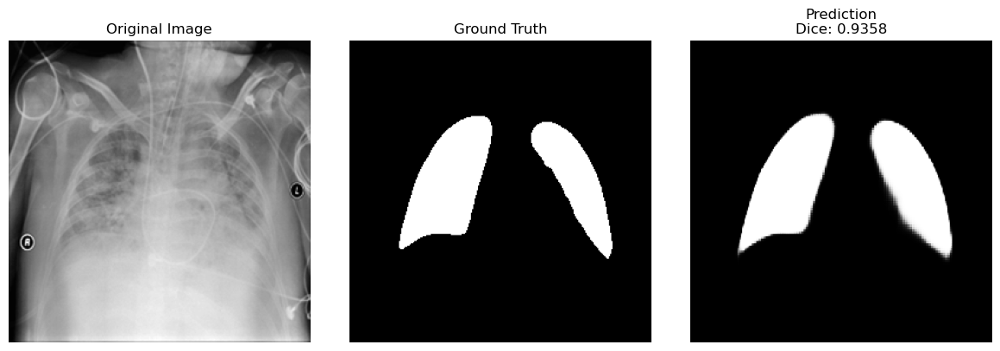

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-2950.png
--------------------------------------------------------------------------------


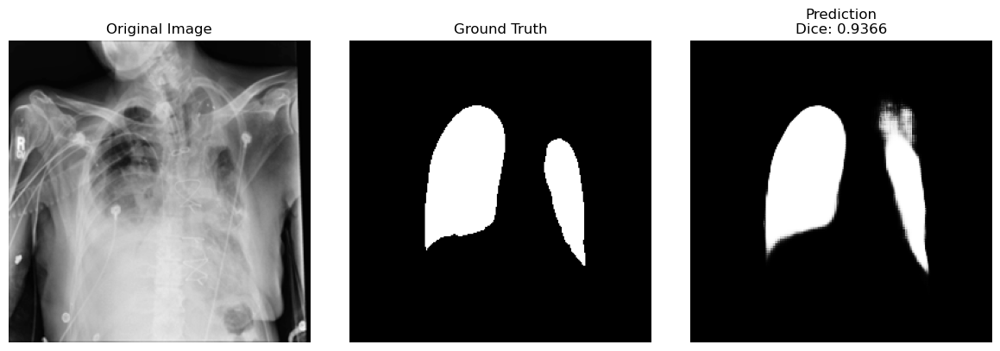

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-5881.png
--------------------------------------------------------------------------------


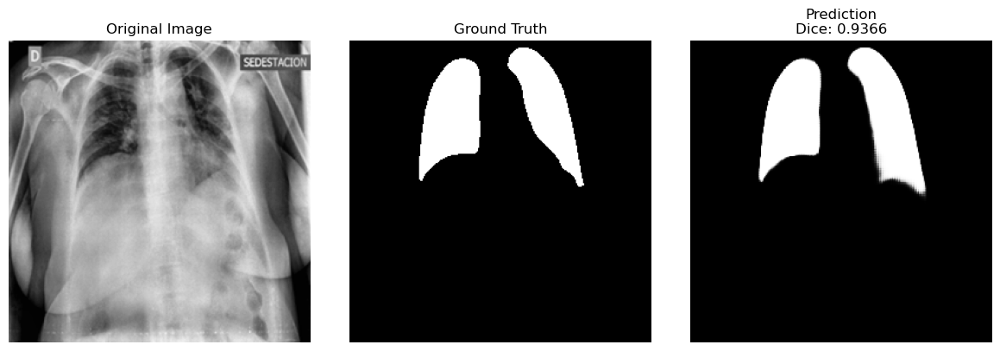

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\COVID\images\COVID-2558.png
--------------------------------------------------------------------------------


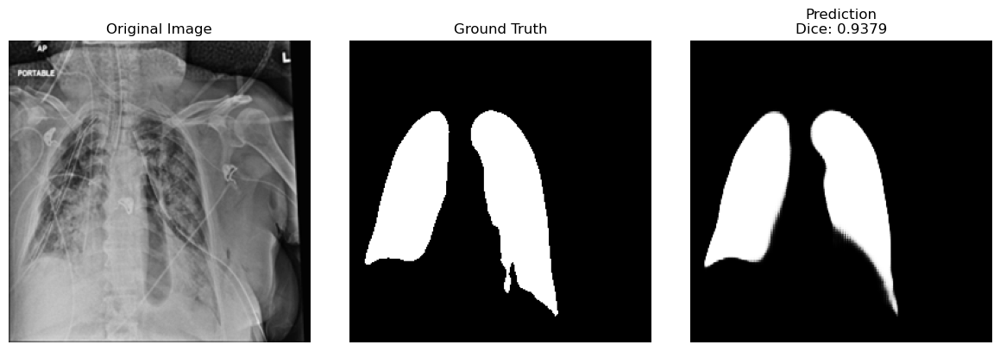

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-5626.png
--------------------------------------------------------------------------------


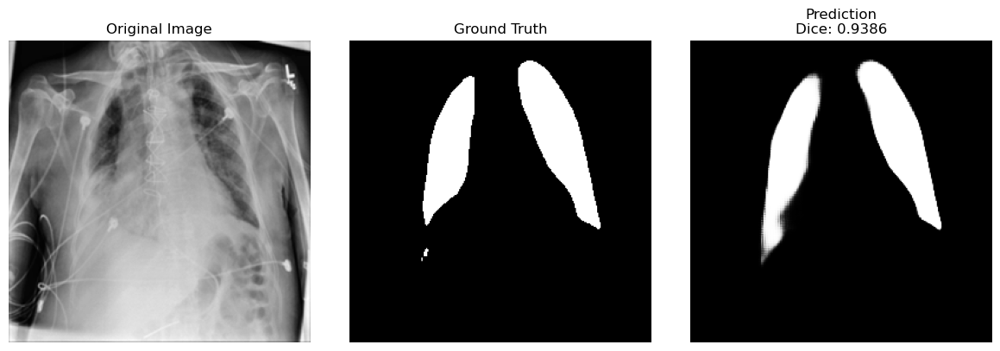

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-585.png
--------------------------------------------------------------------------------


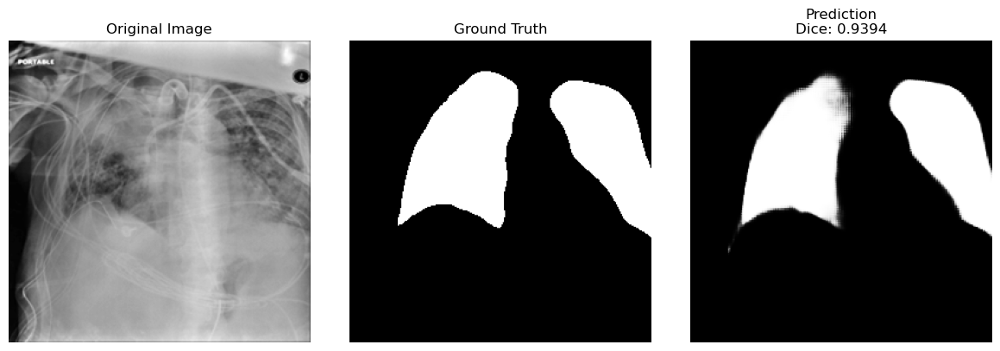

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-902.png
--------------------------------------------------------------------------------


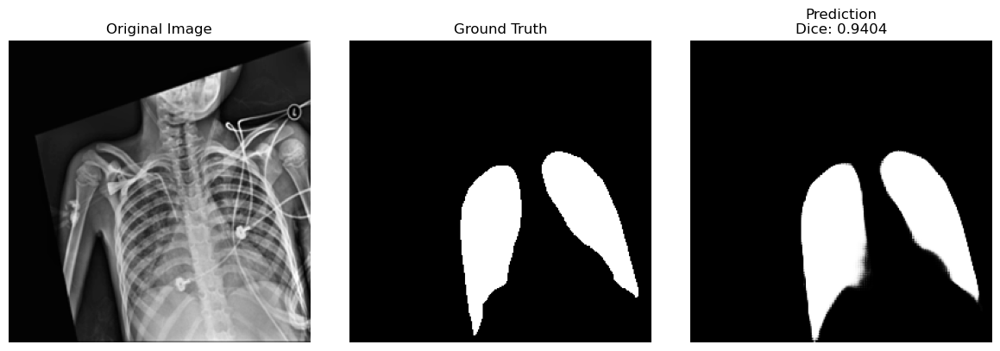

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-2200.png
--------------------------------------------------------------------------------


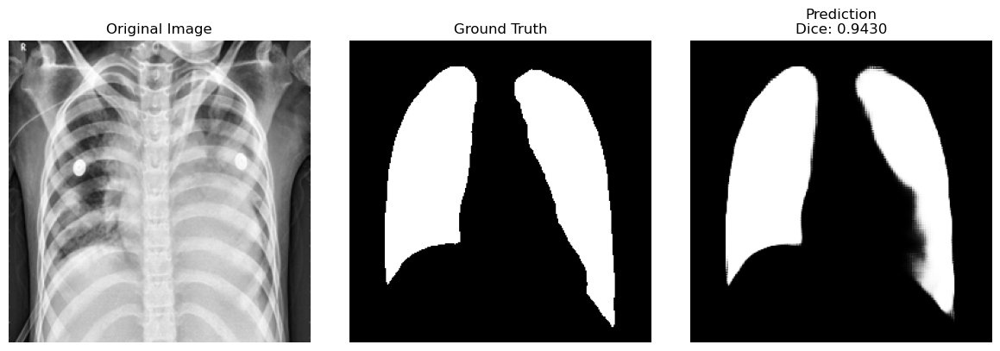

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Viral Pneumonia\images\Viral Pneumonia-1267.png
--------------------------------------------------------------------------------


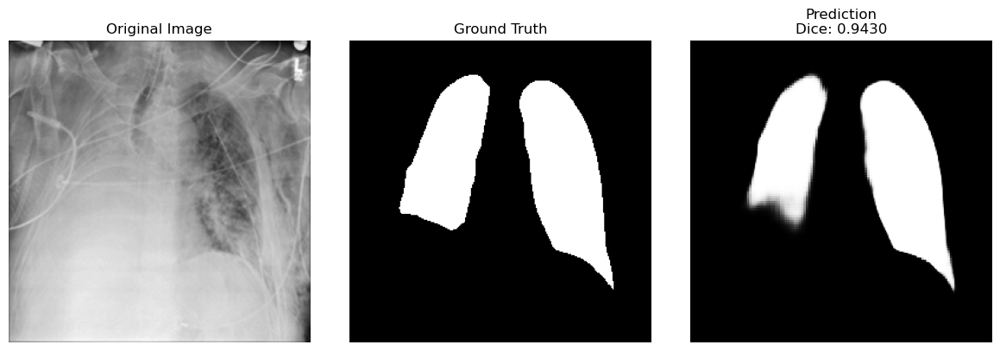

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-1307.png
--------------------------------------------------------------------------------


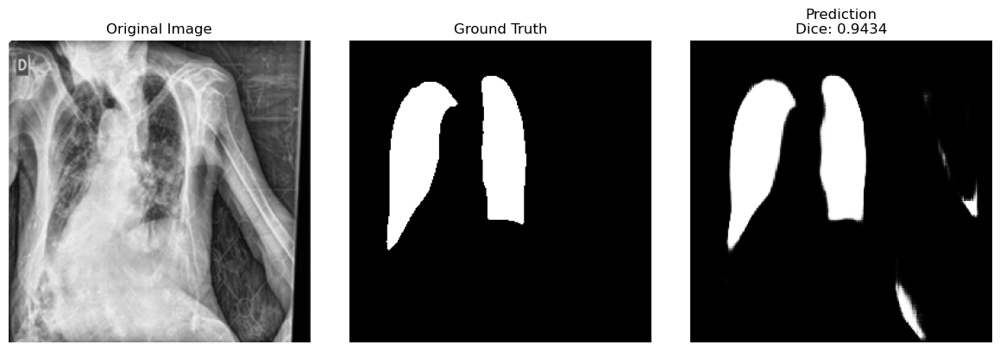

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\COVID\images\COVID-2217.png
--------------------------------------------------------------------------------


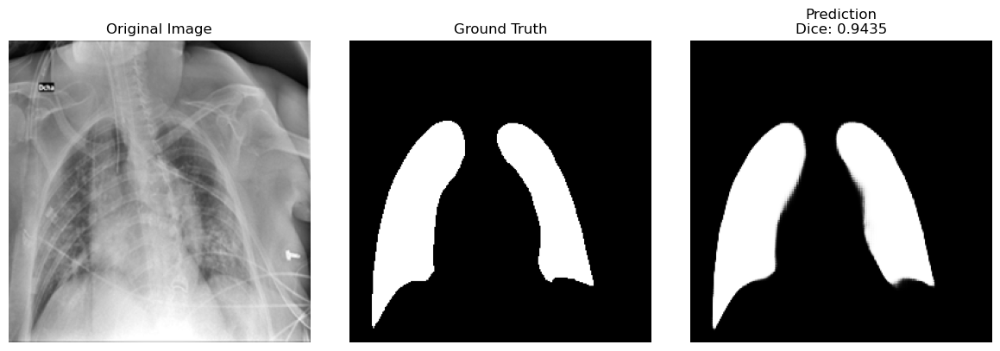

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\COVID\images\COVID-1558.png
--------------------------------------------------------------------------------


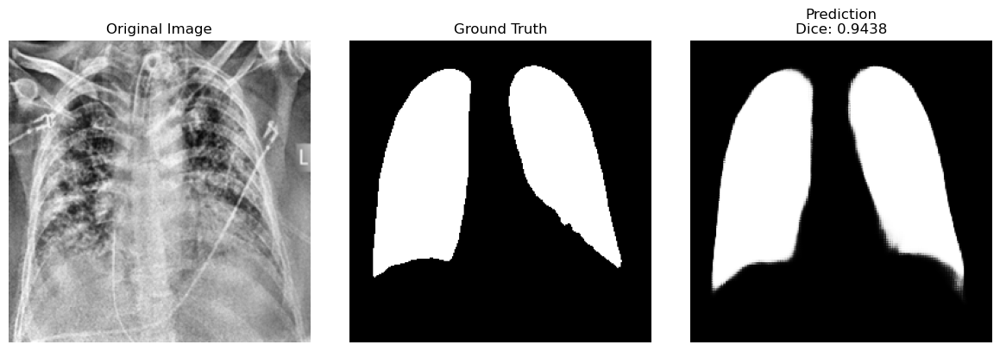

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\COVID\images\COVID-1377.png
--------------------------------------------------------------------------------


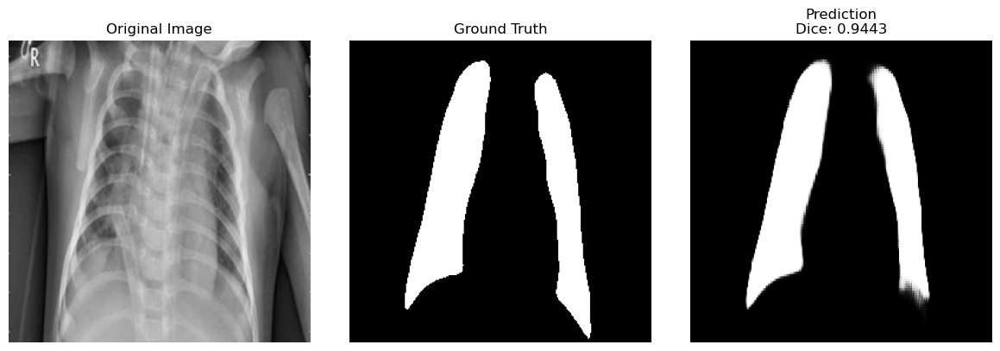

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Viral Pneumonia\images\Viral Pneumonia-658.png
--------------------------------------------------------------------------------


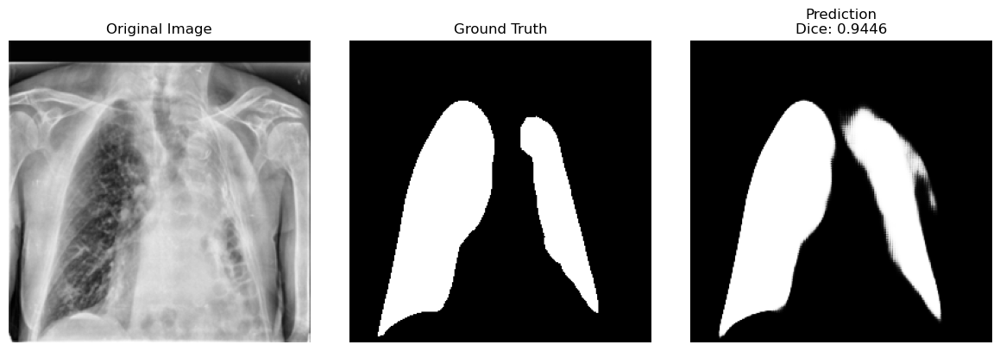

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\COVID\images\COVID-3091.png
--------------------------------------------------------------------------------


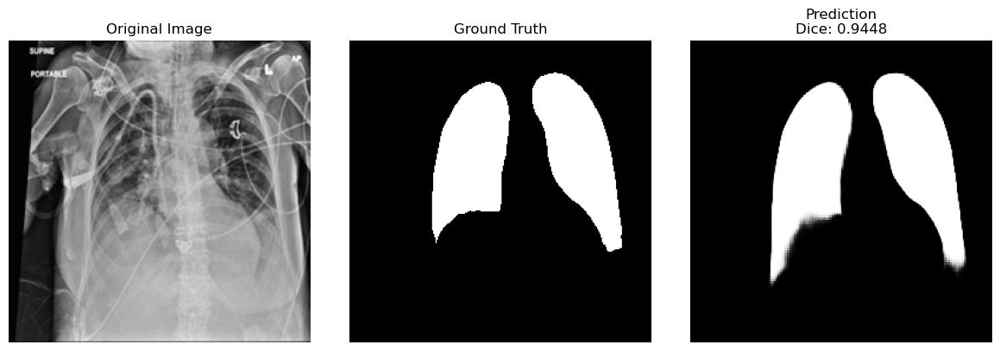

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-2347.png
--------------------------------------------------------------------------------


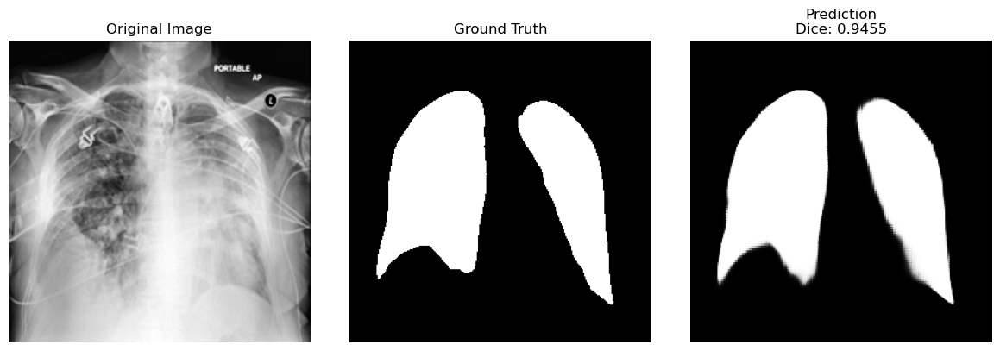

🧾 Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-5964.png
--------------------------------------------------------------------------------


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
import tensorflow as tf
from tqdm import tqdm
import os

#  GPU Check
print(" TensorFlow is using the following devices:")
print(tf.config.list_physical_devices('GPU'))

#  Model path
MODEL_PATH = r"C:\Users\majas\Desktop\masken 2\entwickeltes_masken_model.h5"
model = tf.keras.models.load_model(MODEL_PATH, compile=False)

#  Dice function
def dice_coefficient(y_true, y_pred, smooth=1e-6):
    y_true = y_true.astype(np.float32)
    y_pred = y_pred.astype(np.float32)
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection + smooth) / (np.sum(y_true) + np.sum(y_pred) + smooth)

#  Collectors
dice_scores = []
images = []
masks = []
predictions = []
image_paths = []

#  Iterate through validation set with paths
print("\n Evaluation in progress...")
for batch in tqdm(valid_dataset, desc="Processing Batches"):
    x_batch, y_true_batch, path_batch = batch  # ← paths are included
    y_pred_batch = model.predict(x_batch, verbose=0)
    
    for i in range(len(x_batch)):
        y_true = y_true_batch[i].numpy()
        y_pred = y_pred_batch[i]
        score = dice_coefficient(y_true, y_pred > 0.5)

        dice_scores.append(score)
        images.append(x_batch[i].numpy())
        masks.append(y_true)
        predictions.append(y_pred)

        #  Decode path
        image_paths.append(path_batch[i].numpy().decode("utf-8"))

#  Worst results (Rank 21 to 40)
worst_indices = np.argsort(dice_scores)[20:40]  # ⬅ Taking the 21st to 40th worst masks

#  Visualization + print paths
print("\n Displaying the 21st to 40th worst masks with file paths:\n")
for idx in worst_indices:
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    
    axes[0].imshow(images[idx].squeeze(), cmap='gray')
    axes[0].set_title("Original Image")
    
    axes[1].imshow(masks[idx].squeeze(), cmap='gray')
    axes[1].set_title("Ground Truth")
    
    axes[2].imshow(predictions[idx].squeeze(), cmap='gray')
    axes[2].set_title(f"Prediction\nDice: {dice_scores[idx]:.4f}")

    for ax in axes:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

    #  Print path
    print(f" Image path: {image_paths[idx]}")
    print("-" * 80)


Try  Gan model

import images

In [ ]:
import os
import tensorflow as tf
from sklearn.model_selection import train_test_split

#  Directories
BASE_PROCESSED_DIR = r"C:\Users\majas\Desktop\besonders schlechte masken\bearbeitete_xrays"

#  Function: Collect images and masks
def collect_processed_images_and_masks(base_dir):
    image_paths, mask_paths = [], []

    for cls in ["COVID", "Normal", "Lung_Opacity", "Viral Pneumonia"]:
        images_dir = os.path.join(base_dir, cls, "images")
        masks_dir = os.path.join(base_dir, cls, "masks")

        if not os.path.exists(images_dir) or not os.path.exists(masks_dir):
            print(f"⚠ WARNING: Missing folders for class '{cls}', skipping...")
            continue

        img_files = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith((".png", ".jpg", ".jpeg"))])
        mask_files = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith((".png", ".jpg", ".jpeg"))])

        if len(img_files) != len(mask_files):
            print(f"⚠ WARNING: Class '{cls}' has {len(img_files)} images but {len(mask_files)} masks!")

        image_paths.extend(img_files)
        mask_paths.extend(mask_files)

    return image_paths, mask_paths

# Collect images & masks
image_paths, mask_paths = collect_processed_images_and_masks(BASE_PROCESSED_DIR)

if len(image_paths) == 0 or len(mask_paths) == 0:
    raise ValueError(" ERROR: No processed images or masks found! Check the dataset folder.")

print(f" Total images: {len(image_paths)}, Total masks: {len(mask_paths)}")

#  Split into Train (70%), Validation (20%), Test (10%)
train_images, temp_images, train_masks, temp_masks = train_test_split(image_paths, mask_paths, test_size=0.3, random_state=42)
valid_images, test_images, valid_masks, test_masks = train_test_split(temp_images, temp_masks, test_size=0.33, random_state=42)

print(f"✅ Training: {len(train_images)} images")
print(f"✅ Validation: {len(valid_images)} images")
print(f"✅ Test: {len(test_images)} images")

#  Loader function with proper scaling to 384x384
def load_image_and_mask(image_path, mask_path):
    # Load image
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=1)  
    image = tf.image.resize(image, [384, 384]) / 255.0  

    # Load mask
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)  
    mask = tf.image.resize(mask, [384, 384])  
    mask = tf.where(mask > 0.5, 1.0, 0.0)  

    return image, mask  

#  Dataset creation without paths
def create_tf_dataset(image_paths, mask_paths, batch_size=4, shuffle=True):
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    dataset = dataset.map(load_image_and_mask, num_parallel_calls=tf.data.AUTOTUNE)

    if shuffle:
        dataset = dataset.shuffle(buffer_size=1000)

    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

#  Train, Validation & Test Datasets with 384x384 images
train_dataset = create_tf_dataset(train_images, train_masks, batch_size=1, shuffle=True)
valid_dataset = create_tf_dataset(valid_images, valid_masks, batch_size=1, shuffle=False)
test_dataset  = create_tf_dataset(test_images,  test_masks,  batch_size=1, shuffle=False)

#  New function: Resize to 256x256
def resize_to_256(image, mask):
    image = tf.image.resize(image, [256, 256])
    mask = tf.image.resize(mask, [256, 256])
    return image, mask

#  Resize to model input size
train_dataset = train_dataset.map(resize_to_256)
valid_dataset = valid_dataset.map(resize_to_256)
test_dataset  = test_dataset.map(resize_to_256)

print("✅ Datasets successfully resized to 256x256!")


📊 Gesamtbilder: 21165, Gesamtmasken: 21165
✅ Training: 14815 Bilder
✅ Validation: 4254 Bilder
✅ Test: 2096 Bilder
✅ Datensätze erfolgreich auf 256x256 resized!


Loss Functions

In [33]:
def dice_coefficient(y_true, y_pred):
    numerator = 2 * K.sum(y_true * y_pred) + 1e-6
    denominator = K.sum(y_true + y_pred) + 1e-6
    return numerator / denominator

def iou_metric(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    return (intersection + 1e-6) / (union + 1e-6)

def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

def combined_loss(y_true, y_pred):
    return 0.5 * dice_loss(y_true, y_pred) + 0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred)


custom_objects = {
    "dice_coefficient": dice_coefficient,
    "iou_metric": iou_metric,
    "dice_loss": dice_loss,
    "combined_loss": combined_loss
}

TRAINED U-NET CHARGING & FREEZING

In [ ]:
# Path to your already trained model:
MODEL_PATH = r"C:\Users\majas\Desktop\masken 2\entwickeltes_masken_model.h5"

# Load the model with custom loss and metrics (without compiling for now)
generator = tf.keras.models.load_model(
    MODEL_PATH,
    custom_objects=custom_objects,
    compile=False  # We will compile manually later
)

# Freeze layers up to (but not including) index 97
FREEZE_UP_TO = 97
for layer in generator.layers[:FREEZE_UP_TO]:
    layer.trainable = False

# Unfreeze the remaining layers
for layer in generator.layers[FREEZE_UP_TO:]:
    layer.trainable = True


diskriminator

In [ ]:
def build_discriminator(input_shape=(256, 256, 1)):
    inp_img = Input(shape=input_shape, name="img_in")
    inp_mask = Input(shape=input_shape, name="mask_in")
    merged = Concatenate(axis=-1)([inp_img, inp_mask])

    x = Conv2D(64, (4,4), strides=2, padding="same")(merged)
    x = LeakyReLU(0.2)(x)
    x = Conv2D(128, (4,4), strides=2, padding="same")(x)
    x = LeakyReLU(0.2)(x)

    # Output: Patch prediction
    x = Conv2D(1, (4,4), padding="same")(x)
    return Model([inp_img, inp_mask], x)

discriminator = build_discriminator(input_shape=(384,384,1))

discriminator = build_discriminator(input_shape=(256, 256, 1))

GAN-LOOP (SegGAN-class)

In [ ]:
bce_logits = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def gan_loss(logits, is_real=True):
    # Simple version: targets are 1.0 for real, 0.0 for fake
    targets = tf.ones_like(logits) if is_real else tf.zeros_like(logits)
    return bce_logits(targets, logits)

class SegGAN(tf.keras.Model):
    def __init__(self, generator, discriminator, adv_weight=0.01):
        super().__init__()
        self.gen = generator
        self.disc = discriminator
        self.adv_weight = adv_weight

    def call(self, inputs, training=False):
        return self.gen(inputs, training=training)

    def compile(self, gen_opt, disc_opt):
        super().compile()
        self.gen_opt = gen_opt
        self.disc_opt = disc_opt

    def train_step(self, data):
        real_imgs, real_masks = data

        with tf.GradientTape(persistent=True) as tape:
            # 1) Generator prediction
            fake_masks = self.gen(real_imgs, training=True)
            
            # 2) Discriminator predictions
            real_logits = self.disc([real_imgs, real_masks], training=True)
            fake_logits = self.disc([real_imgs, fake_masks], training=True)
            
            # 3) Generator loss: segmentation loss + adversarial component
            seg_loss = combined_loss(real_masks, fake_masks)
            adv_loss = gan_loss(fake_logits, is_real=True)  # Generator tries to fool discriminator
            gen_loss = seg_loss + self.adv_weight * adv_loss
            
            # 4) Discriminator loss: classify real masks as real, generated masks as fake
            disc_loss_real = gan_loss(real_logits, is_real=True)
            disc_loss_fake = gan_loss(fake_logits, is_real=False)
            disc_loss = disc_loss_real + disc_loss_fake

        # Compute gradients
        gen_grads = tape.gradient(gen_loss, self.gen.trainable_variables)
        disc_grads = tape.gradient(disc_loss, self.disc.trainable_variables)

        # Apply gradients
        self.gen_opt.apply_gradients(zip(gen_grads, self.gen.trainable_variables))
        self.disc_opt.apply_gradients(zip(disc_grads, self.disc.trainable_variables))

        return {"gen_loss": gen_loss, "disc_loss": disc_loss}

    def test_step(self, data):
        real_imgs, real_masks = data
        fake_masks = self.gen(real_imgs, training=False)
        fake_logits = self.disc([real_imgs, fake_masks], training=False)
        
        seg_loss = combined_loss(real_masks, fake_masks)
        adv_loss = gan_loss(fake_logits, is_real=True)
        gen_loss = seg_loss + self.adv_weight * adv_loss
        
        return {"gen_loss": gen_loss}


CREATE & TRAIN GAN INSTANCE

In [ ]:
from tensorflow.keras.optimizers import Adam

gen_opt = Adam(1e-4)
disc_opt = Adam(1e-5)

gan_model = SegGAN(generator=generator, discriminator=discriminator, adv_weight=0.001)
gan_model.compile(gen_opt=gen_opt, disc_opt=disc_opt)

# Example callback: ModelCheckpoint
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    "best_seg_gan_weights.ckpt", 
    monitor="val_iou_metric",  # Monitor the IoU metric on the validation set
    mode="max",                # We want to maximize the IoU
    save_best_only=True,       # Only save the best model
    save_weights_only=True,    # Save only weights, not full model
    verbose=1
)

# Start training
gan_model.fit(
    train_dataset,
    validation_data=valid_dataset,
    epochs=2,
    callbacks=[checkpoint_cb],
    verbose=1
)

# Save the fine-tuned generator
gan_model.gen.save("my_finetuned_generator.h5")

print("✅ Fine-tuning completed!")


Epoch 1/2
14815/14815 [==============================] - 11692s 788ms/step - gen_loss: 0.0188 - disc_loss: 1.2820 - val_gen_loss: 0.0216
Epoch 2/2
14815/14815 [==============================] - 11541s 779ms/step - gen_loss: 0.0185 - disc_loss: 1.2509 - val_gen_loss: 0.0217
✅ Fine-Tuning beendet!


import images with path

In [ ]:
import os
import tensorflow as tf
from sklearn.model_selection import train_test_split

#  Directories
BASE_PROCESSED_DIR = r"C:\Users\majas\Desktop\masken 2\bearbeitete_xrays"

#  Function: Collect images & masks
def collect_processed_images_and_masks(base_dir):
    image_paths, mask_paths = [], []

    for cls in ["COVID", "Normal", "Lung_Opacity", "Viral Pneumonia"]:
        images_dir = os.path.join(base_dir, cls, "images")
        masks_dir = os.path.join(base_dir, cls, "masks")

        if not os.path.exists(images_dir) or not os.path.exists(masks_dir):
            print(f" WARNING: Missing folders for class '{cls}', skipping...")
            continue

        img_files = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith((".png", ".jpg", ".jpeg"))])
        mask_files = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith((".png", ".jpg", ".jpeg"))])

        if len(img_files) != len(mask_files):
            print(f" WARNING: Class '{cls}' has {len(img_files)} images but {len(mask_files)} masks!")

        image_paths.extend(img_files)
        mask_paths.extend(mask_files)

    return image_paths, mask_paths

#  Collect images & masks
image_paths, mask_paths = collect_processed_images_and_masks(BASE_PROCESSED_DIR)

if len(image_paths) == 0 or len(mask_paths) == 0:
    raise ValueError(" ERROR: No processed images or masks found! Please check the dataset folder.")

print(f" Total images: {len(image_paths)}, Total masks: {len(mask_paths)}")

# 📌 Split into Train (70%), Validation (20%), Test (10%)
train_images, temp_images, train_masks, temp_masks = train_test_split(image_paths, mask_paths, test_size=0.3, random_state=42)
valid_images, test_images, valid_masks, test_masks = train_test_split(temp_images, temp_masks, test_size=0.33, random_state=42)

print(f"✅ Training: {len(train_images)} images")
print(f"✅ Validation: {len(valid_images)} images")
print(f"✅ Test: {len(test_images)} images")

#  Load function with path
def load_image_and_mask_with_path(image_path, mask_path):
    # Load image
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=1)
    image = tf.image.resize(image, [256, 256]) / 255.0

    # Load mask
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.image.resize(mask, [256, 256]) / 255.0

    return image, mask, image_path  

#  Create dataset with path
def create_tf_dataset(image_paths, mask_paths, batch_size=8, shuffle=True):
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    dataset = dataset.map(load_image_and_mask_with_path, num_parallel_calls=tf.data.AUTOTUNE)

    if shuffle:
        dataset = dataset.shuffle(buffer_size=1000)

    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

# 📌 Create Train, Validation & Test datasets
train_dataset = create_tf_dataset(train_images, train_masks, batch_size=4, shuffle=True)
valid_dataset = create_tf_dataset(valid_images, valid_masks, batch_size=4, shuffle=False)
test_dataset  = create_tf_dataset(test_images,  test_masks,  batch_size=4, shuffle=False)

print("✅ Datasets with paths successfully created!")


📊 Gesamtbilder: 21165, Gesamtmasken: 21165
✅ Training: 14815 Bilder
✅ Validation: 4254 Bilder
✅ Test: 2096 Bilder
✅ Datensätze mit Pfaden erfolgreich erstellt!


Load model, test and output 5 worst masks


🔍 Evaluierung auf Testdaten...


🔄 Testdaten werden verarbeitet: 100%|██████████| 524/524 [05:30<00:00,  1.59it/s]


📈 Evaluation Summary:
🔹 Durchschnittlicher Dice-Score: 0.9793
🔹 Bester Dice-Score: 0.9916
🔹 Schlechtester Dice-Score: 0.4185

📉 Zeige die 5 schlechtesten Vorhersagen:



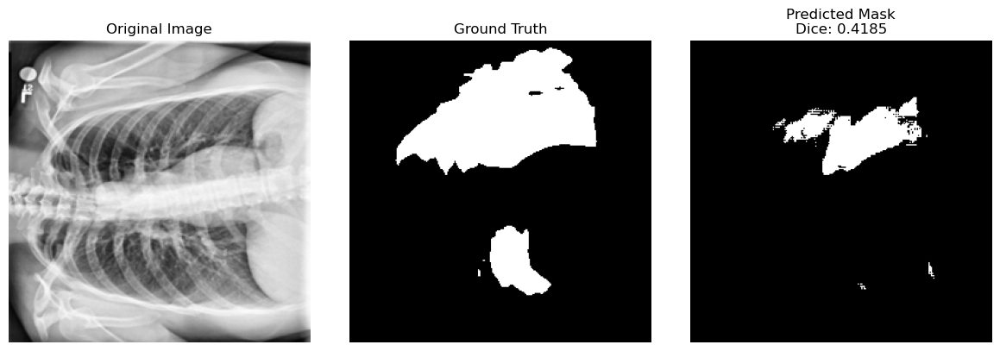

🖼️ Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Normal\images\Normal-2777.png


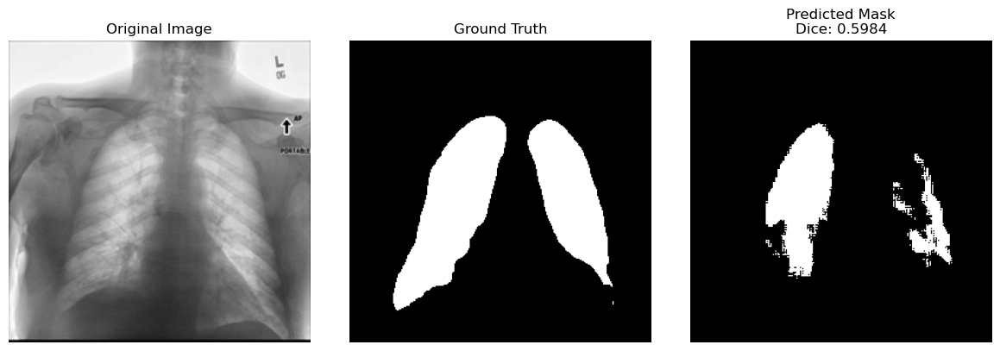

🖼️ Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Normal\images\Normal-9232.png


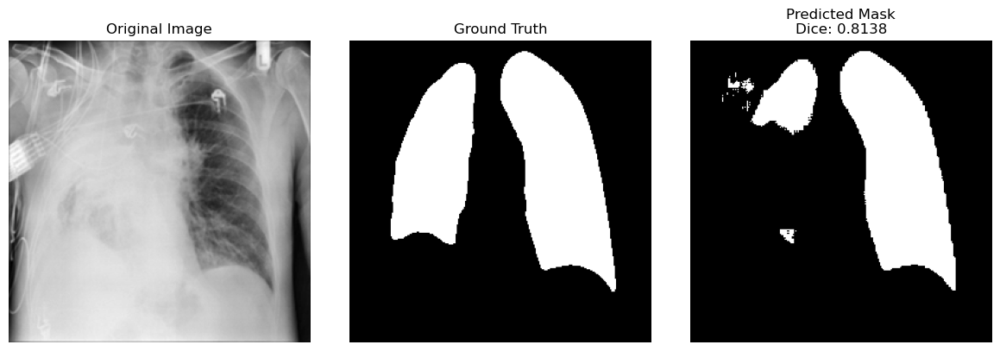

🖼️ Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\Lung_Opacity\images\Lung_Opacity-5958.png


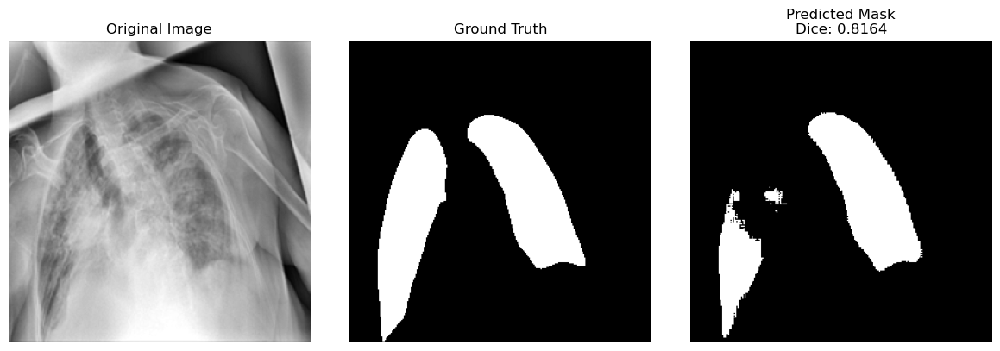

🖼️ Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\COVID\images\COVID-1963.png


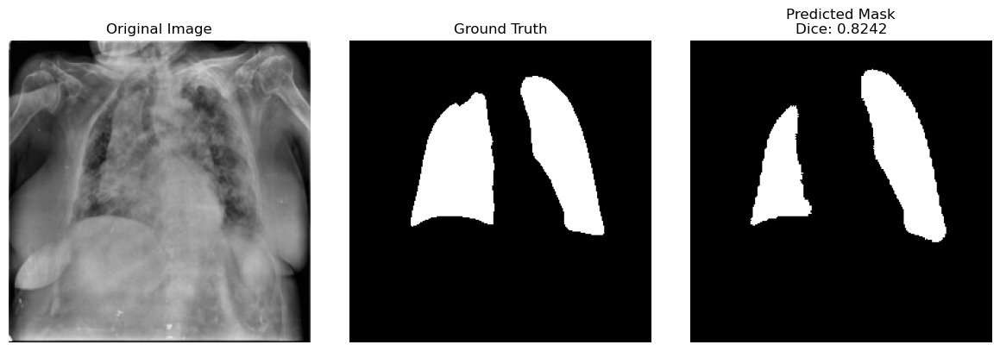

🖼️ Bildpfad: C:\Users\majas\Desktop\masken 2\bearbeitete_xrays\COVID\images\COVID-2762.png


In [ ]:
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

# Load the generator model
generator = tf.keras.models.load_model(
    "my_finetuned_generator.h5",
    custom_objects=custom_objects  
)

# Dice score calculation
def dice_coefficient(y_true, y_pred, smooth=1e-6):
    y_true = y_true.astype(np.float32)
    y_pred = y_pred.astype(np.float32)
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection + smooth) / (np.sum(y_true) + np.sum(y_pred) + smooth)

# Containers for results
dice_scores = []
images = []
masks = []
predictions = []
image_paths = []  
print("\n🔍 Evaluating on test data...")

for batch in tqdm(test_dataset, desc="🔄 Processing test data"):
    x_batch, y_true_batch, path_batch = batch  

    x_batch = tf.cast(x_batch, tf.float32)
    x_batch = x_batch / tf.reduce_max(x_batch)

    y_pred_batch = generator(x_batch, training=False).numpy()

    for i in range(len(x_batch)):
        x = x_batch[i].numpy()
        y_true = y_true_batch[i].numpy()
        y_pred = y_pred_batch[i]
        path = path_batch[i].numpy().decode("utf-8")  

        score = dice_coefficient(y_true, y_pred > 0.5)

        images.append(x)
        masks.append(y_true)
        predictions.append(y_pred)
        dice_scores.append(score)
        image_paths.append(path) 


# Summary
dice_scores = np.array(dice_scores)
print("\n Evaluation Summary:")
print(f"🔹 Average Dice Score: {dice_scores.mean():.4f}")
print(f"🔹 Best Dice Score: {dice_scores.max():.4f}")
print(f"🔹 Worst Dice Score: {dice_scores.min():.4f}")

# Show the 5 worst predictions
worst_indices = np.argsort(dice_scores)[:5]

print("\n Showing the 5 worst predictions:\n")
for idx in worst_indices:
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    axes[0].imshow(images[idx].squeeze(), cmap='gray')
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    axes[1].imshow(masks[idx].squeeze(), cmap='gray')
    axes[1].set_title("Ground Truth")
    axes[1].axis('off')

    axes[2].imshow((predictions[idx].squeeze() > 0.5).astype(np.float32), cmap='gray')
    axes[2].set_title(f"Predicted Mask\nDice: {dice_scores[idx]:.4f}")
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

    # Print the image path
    print(f"🧾 Image path: {image_paths[idx]}")


# the same but different weights

import images

In [ ]:
import os
import labelme
import json
import numpy as np
import PIL.Image

#  Folder with LabelMe JSONs
input_dir = r"C:\Users\majas\Desktop\besonders schlechte masken\zu bearbeiten"
output_dir = input_dir  # Or a different folder if desired

#  Find all JSON files in the folder
json_files = [f for f in os.listdir(input_dir) if f.endswith(".json")]

if not json_files:
    print(" No LabelMe JSON files found.")
else:
    print(f" {len(json_files)} JSON files found.")

for json_name in json_files:
    json_path = os.path.join(input_dir, json_name)

    # Load JSON
    with open(json_path, "r") as f:
        data = json.load(f)

    # Prepare image data
    if data.get("imageData") is not None:
        imageData = data["imageData"]
    else:
        imagePath = os.path.join(input_dir, data["imagePath"])
        with open(imagePath, "rb") as img_f:
            imageData = labelme.utils.img_data_to_base64(img_f.read()).decode("utf-8")

    # Convert image from base64 to array
    image = labelme.utils.img_b64_to_arr(imageData)

    # Prepare labels
    label_name_to_value = {"_background_": 0}
    for shape in data["shapes"]:
        label_name = shape["label"]
        if label_name not in label_name_to_value:
            label_name_to_value[label_name] = len(label_name_to_value)

    # Generate label mask
    label_array, _ = labelme.utils.shapes_to_label(
        image.shape, data["shapes"], label_name_to_value
    )

    # Convert to binary mask (only label > 0)
    binary_mask = (label_array > 0).astype(np.uint8) * 255

    # Save mask
    mask_filename = os.path.splitext(json_name)[0] + "_mask.png"
    mask_path = os.path.join(output_dir, mask_filename)
    PIL.Image.fromarray(binary_mask).save(mask_path)

    print(f" Mask saved: {mask_filename}")

print("\n All masks have been successfully created and saved.")


🔍 2 JSON-Dateien gefunden.
✅ Maske gespeichert: Normal-2777_mask.png
✅ Maske gespeichert: Normal-9232_mask.png

🎉 Alle Masken wurden erfolgreich erstellt und gespeichert.


Loss Functions

In [12]:
def dice_coefficient(y_true, y_pred):
    numerator = 2 * K.sum(y_true * y_pred) + 1e-6
    denominator = K.sum(y_true + y_pred) + 1e-6
    return numerator / denominator

def iou_metric(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    return (intersection + 1e-6) / (union + 1e-6)

def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

def combined_loss(y_true, y_pred):
    return 0.5 * dice_loss(y_true, y_pred) + 0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred)


custom_objects = {
    "dice_coefficient": dice_coefficient,
    "iou_metric": iou_metric,
    "dice_loss": dice_loss,
    "combined_loss": combined_loss
}

TRAINED U-NET CHARGING & FREEZING

In [ ]:
# Path to your already trained model:
MODEL_PATH = r"C:\Users\majas\Desktop\masken 2\entwickeltes_masken_model.h5"

generator = tf.keras.models.load_model(
    MODEL_PATH,
    custom_objects=custom_objects,
    compile=False  # We'll compile manually later
)

FREEZE_UP_TO = 97  # Freeze all layers up to (but not including) index 97
for layer in generator.layers[:FREEZE_UP_TO]:
    layer.trainable = False

for layer in generator.layers[FREEZE_UP_TO:]:
    layer.trainable = True


freeze certain layers

In [ ]:
# Example: Adjust the number of encoder layers to freeze (including ASPP etc.)
FREEZE_UP_TO = 15  

# Freeze the first N layers
for layer in generator.layers[:FREEZE_UP_TO]:
    layer.trainable = False

# All other layers remain trainable
for layer in generator.layers[FREEZE_UP_TO:]:
    layer.trainable = True


discriminator

In [ ]:
def build_discriminator(input_shape=(256, 256, 1)):
    inp_img = Input(shape=input_shape, name="img_in")
    inp_mask = Input(shape=input_shape, name="mask_in")
    merged = Concatenate(axis=-1)([inp_img, inp_mask])

    x = Conv2D(64, (4,4), strides=2, padding="same")(merged)
    x = LeakyReLU(0.2)(x)
    x = Conv2D(128, (4,4), strides=2, padding="same")(x)
    x = LeakyReLU(0.2)(x)

    # Output: Patch prediction
    x = Conv2D(1, (4,4), padding="same")(x)
    return Model([inp_img, inp_mask], x)

discriminator = build_discriminator(input_shape=(256, 256,1))

NameError: name 'Input' is not defined

 GAN-LOOP (SegGAN-class)

In [17]:
import os
import tensorflow as tf
from tensorflow.keras.optimizers import Adam

bce_logits = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def gan_loss(logits, is_real=True):
    targets = 0.9 * tf.ones_like(logits) if is_real else tf.zeros_like(logits)
    return bce_logits(targets, logits)


class SegGAN(tf.keras.Model):
    def __init__(self, generator, discriminator, adv_weight=0.01):
        super().__init__()
        self.gen = generator
        self.disc = discriminator
        self.adv_weight = adv_weight

    def call(self, inputs, training=False):
        return self.gen(inputs, training=training)

    def compile(self, gen_opt, disc_opt):
        super().compile()
        self.gen_opt = gen_opt
        self.disc_opt = disc_opt

    def train_step(self, data):
        real_imgs, real_masks = data
        with tf.GradientTape(persistent=True) as tape:
            fake_masks = self.gen(real_imgs, training=True)
            real_logits = self.disc([real_imgs, real_masks], training=True)
            fake_logits = self.disc([real_imgs, fake_masks], training=True)

            seg_loss = combined_loss(real_masks, fake_masks)
            adv_loss = gan_loss(fake_logits, is_real=True)
            gen_loss = seg_loss + self.adv_weight * adv_loss

            disc_loss_real = gan_loss(real_logits, is_real=True)
            disc_loss_fake = gan_loss(fake_logits, is_real=False)
            disc_loss = disc_loss_real + disc_loss_fake

        gen_grads = tape.gradient(gen_loss, self.gen.trainable_variables)
        disc_grads = tape.gradient(disc_loss, self.disc.trainable_variables)

        self.gen_opt.apply_gradients(zip(gen_grads, self.gen.trainable_variables))
        self.disc_opt.apply_gradients(zip(disc_grads, self.disc.trainable_variables))

        return {"gen_loss": gen_loss, "disc_loss": disc_loss}

    def test_step(self, data):
        real_imgs, real_masks = data
        fake_masks = self.gen(real_imgs, training=False)
        fake_logits = self.disc([real_imgs, fake_masks], training=False)

        seg_loss = combined_loss(real_masks, fake_masks)
        adv_loss = gan_loss(fake_logits, is_real=True)
        gen_loss = seg_loss + self.adv_weight * adv_loss

        dice_val = dice_coefficient(real_masks, tf.round(fake_masks))
        return {"gen_loss": gen_loss, "val_dice": dice_val}


CREATE & TRAIN GAN INSTANCE

In [ ]:

class SaveGeneratorEveryEpoch(tf.keras.callbacks.Callback):
    def __init__(self, save_dir):
        super().__init__()
        self.save_dir = save_dir
        self.epoch = 1

    def on_epoch_end(self, epoch, logs=None):
        filename = f"fintuned_generator_{self.epoch}.h5"
        path = os.path.join(self.save_dir, filename)
        self.model.gen.save(path)
        print(f"💾 Generator für Epoche {self.epoch} gespeichert: {path}")
        self.epoch += 1


earlystop_cb = tf.keras.callbacks.EarlyStopping(
    monitor="val_dice",
    patience=3,
    mode="max",
    restore_best_weights=True
)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    r"C:\Users\majas\Desktop\masken 2\verbessertes_model27.3\best_seg_gan_weights.ckpt",
    monitor="val_dice",
    mode="max",
    save_best_only=True,
    save_weights_only=True,
    verbose=1
)


save_every_epoch_cb = SaveGeneratorEveryEpoch(
    save_dir=r"C:\Users\majas\Desktop\masken 2\verbessertes_model27.3"
)

# Optimizer
gen_opt = Adam(1e-4)
disc_opt = Adam(1e-5, beta_1=0.5, beta_2=0.9)

# GAN vorbereiten
gan_model = SegGAN(generator=generator, discriminator=discriminator, adv_weight=0.01)
gan_model.compile(gen_opt=gen_opt, disc_opt=disc_opt)

# start Training 
gan_model.fit(
    train_dataset,
    validation_data=valid_dataset,
    epochs=15,
    callbacks=[checkpoint_cb, earlystop_cb, save_every_epoch_cb],
    verbose=1
)

# Generator final save
gan_model.gen.save(
    r"C:\Users\majas\Desktop\masken 2\verbessertes_model27.3\my_finetuned_generator.h5"
)

print("✅ Fine-Tuning beendet & Generator gespeichert!")

Epoch 1/15
14815/14815 [==============================] - ETA: 0s - gen_loss: 0.0291 - disc_loss: 1.3310WARNING:tensorflow:Can save best model only with val_dice available, skipping.
💾 Generator für Epoche 1 gespeichert: C:\Users\majas\Desktop\masken 2\verbessertes_model27.3\fintuned_generator_1.h5
14815/14815 [==============================] - 16138s 1s/step - gen_loss: 0.0291 - disc_loss: 1.3310 - val_gen_loss: 0.0301 - val_val_dice: 0.9818
Epoch 2/15
14815/14815 [==============================] - ETA: 0s - gen_loss: 0.0285 - disc_loss: 1.3204WARNING:tensorflow:Can save best model only with val_dice available, skipping.
💾 Generator für Epoche 2 gespeichert: C:\Users\majas\Desktop\masken 2\verbessertes_model27.3\fintuned_generator_2.h5
14815/14815 [==============================] - 15968s 1s/step - gen_loss: 0.0285 - disc_loss: 1.3204 - val_gen_loss: 0.0325 - val_val_dice: 0.9808
Epoch 3/15
14815/14815 [==============================] - ETA: 0s - gen_loss: 0.0280 - disc_loss: 1.3092WA

Complete code for evaluation with best/worst masks


🔍 Evaluierung auf Testdaten...


🔄 Testdaten werden verarbeitet: 100%|██████████| 2096/2096 [08:05<00:00,  4.32it/s]



📈 Durchschnittlicher Dice: 0.9797
🔝 Bester Dice: 0.9923
🔻 Schlechtester Dice: 0.0511

📉 Schlechteste 5 Masken:


c:\Users\majas\anaconda3\envs\ml_env\lib\site-packages\matplotlib\backends\backend_agg.py:214: RuntimeWarning: Glyph 10060 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\majas\anaconda3\envs\ml_env\lib\site-packages\matplotlib\backends\backend_agg.py:183: RuntimeWarning: Glyph 10060 missing from current font.
  font.set_text(s, 0, flags=flags)


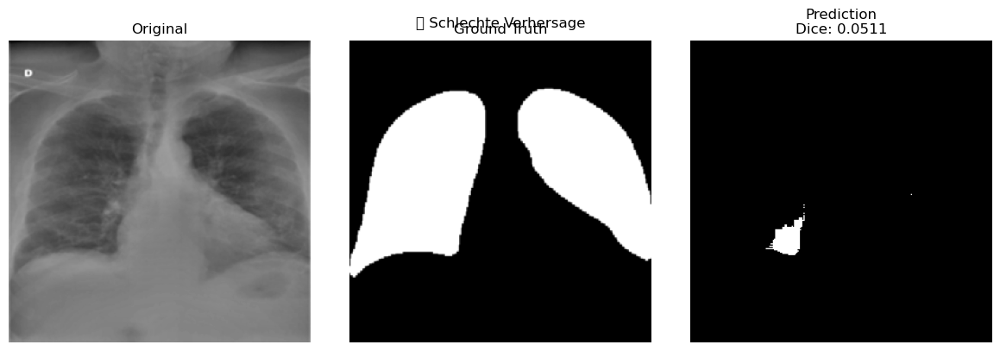

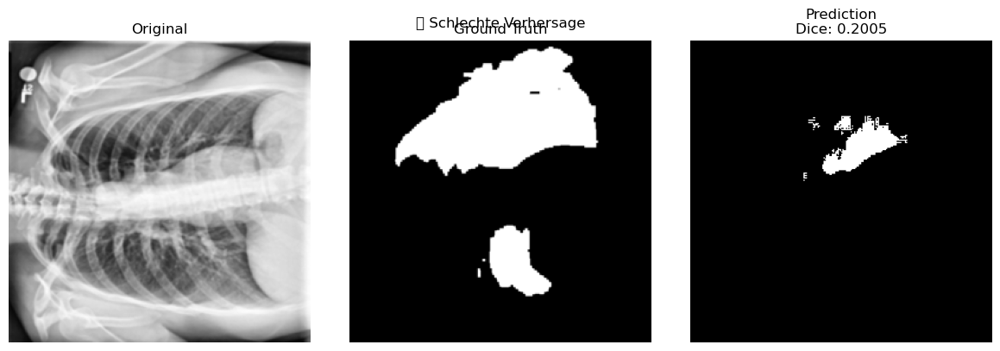

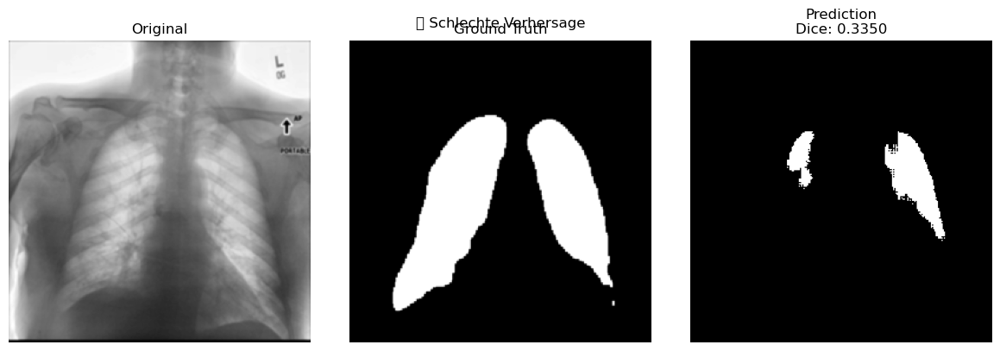

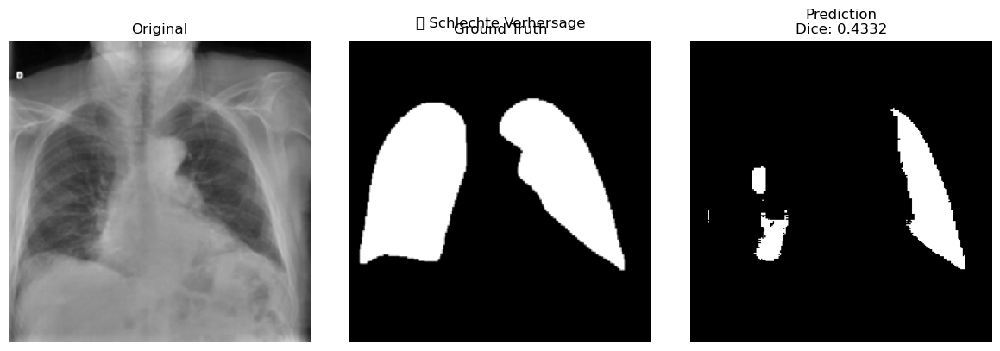

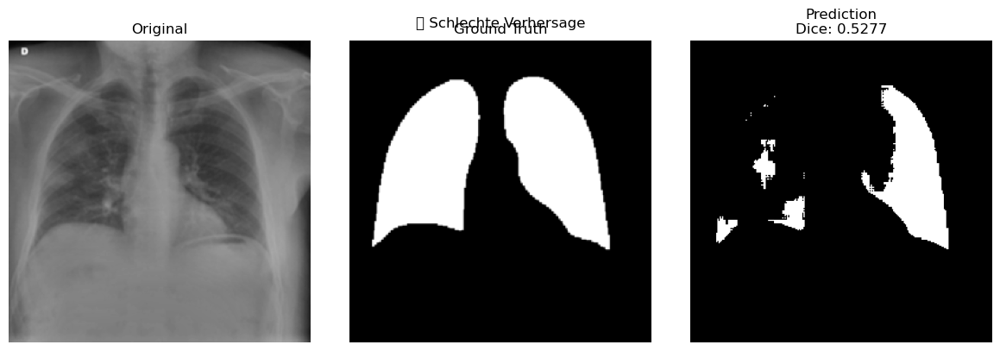


🏆 Beste 5 Masken:


c:\Users\majas\anaconda3\envs\ml_env\lib\site-packages\matplotlib\backends\backend_agg.py:214: RuntimeWarning: Glyph 9989 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\majas\anaconda3\envs\ml_env\lib\site-packages\matplotlib\backends\backend_agg.py:183: RuntimeWarning: Glyph 9989 missing from current font.
  font.set_text(s, 0, flags=flags)


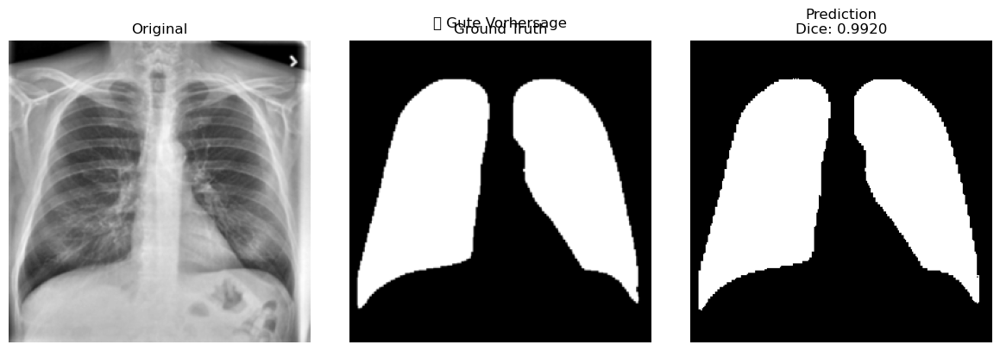

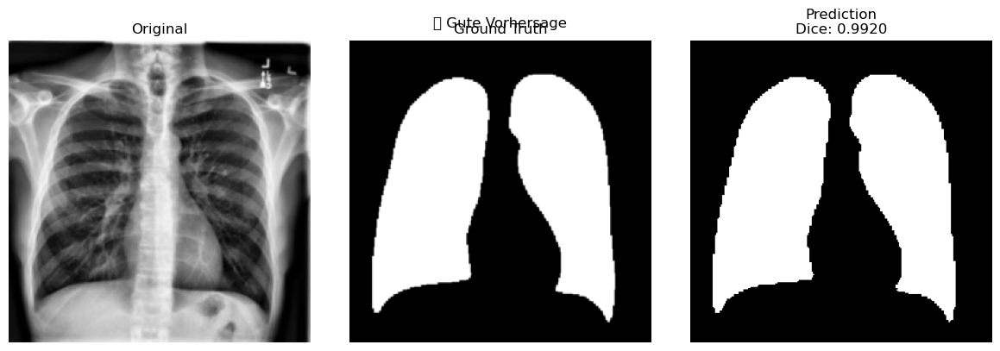

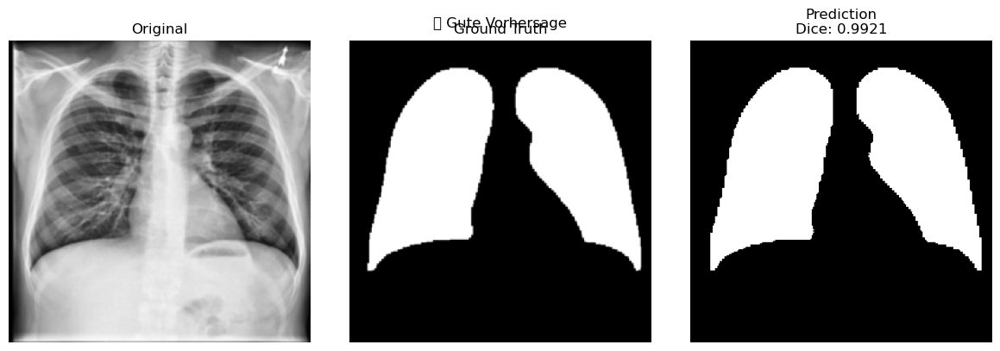

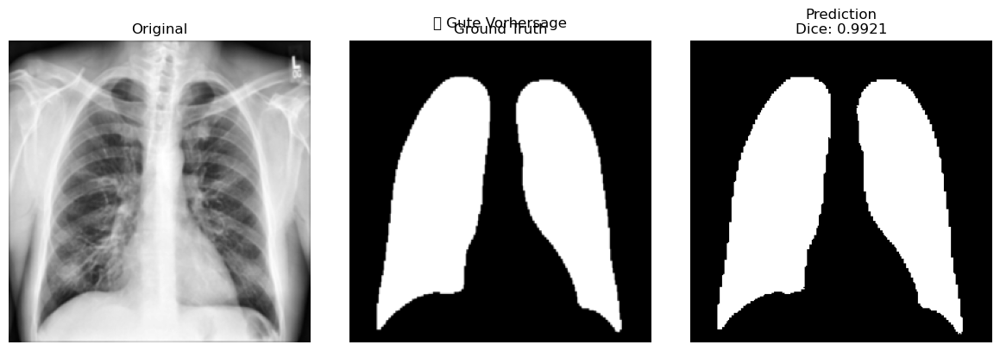

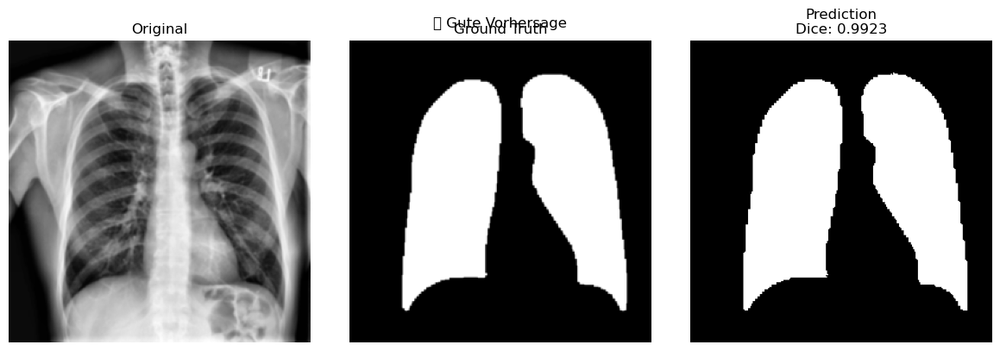

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

#  Load the best generator
generator = tf.keras.models.load_model(
    r"C:\Users\majas\Desktop\masken 2\verbessertes_model27.3\fintuned_generator_12.h5",
    compile=False
)

#  Dice function
def dice_coefficient(y_true, y_pred, smooth=1e-6):
    y_true = y_true.astype(np.float32)
    y_pred = y_pred.astype(np.float32)
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection + smooth) / (np.sum(y_true) + np.sum(y_pred) + smooth)

#  Collect results
dice_scores = []
images = []
masks = []
predictions = []

print("\n Evaluating on test data...")
for batch in tqdm(test_dataset, desc=" Processing test data"):
    x_batch, y_true_batch = batch
    x_batch = tf.cast(x_batch, tf.float32)

    if tf.reduce_max(x_batch) > 1.0:
        x_batch = x_batch / 255.0

    y_pred_batch = generator(x_batch, training=False).numpy()

    for i in range(len(x_batch)):
        x = x_batch[i].numpy()
        y_true = y_true_batch[i].numpy()
        y_pred = y_pred_batch[i]

        dice = dice_coefficient(y_true, y_pred > 0.5)

        images.append(x)
        masks.append(y_true)
        predictions.append(y_pred)
        dice_scores.append(dice)

#  Convert to numpy
dice_scores = np.array(dice_scores)
best_indices = np.argsort(dice_scores)[-5:]
worst_indices = np.argsort(dice_scores)[:5]

#  Summary
print(f"\n📈 Average Dice: {dice_scores.mean():.4f}")
print(f"🔝 Best Dice: {dice_scores[best_indices[-1]]:.4f}")
print(f"🔻 Worst Dice: {dice_scores[worst_indices[0]]:.4f}")

#  Function to display results
def show_comparison(index, title):
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(images[index].squeeze(), cmap='gray')
    axes[0].set_title("Original")
    axes[1].imshow(masks[index].squeeze(), cmap='gray')
    axes[1].set_title("Ground Truth")
    axes[2].imshow((predictions[index].squeeze() > 0.5).astype(np.float32), cmap='gray')
    axes[2].set_title(f"Prediction\nDice: {dice_scores[index]:.4f}")
    for ax in axes:
        ax.axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

#  Show worst predictions
print("\n📉 Worst 5 Masks:")
for idx in worst_indices:
    show_comparison(idx, " Poor Prediction")

#  Show best predictions
print("\n🏆 Best 5 Masks:")
for idx in best_indices:
    show_comparison(idx, "✅ Good Prediction")


# Continue training and improving the model; absolute fine-tuning with the worst masks hard examples

create a dataset from the bad images and masks

In [ ]:
import tensorflow as tf
import os
from pathlib import Path
from PIL import Image
from sklearn.model_selection import train_test_split

#  Directories
image_dir = Path(r"C:\Users\majas\Desktop\besonders schlechte masken\finetuning datensatz\images")
mask_dir = Path(r"C:\Users\majas\Desktop\besonders schlechte masken\finetuning datensatz\maken")

#  List and sort file names
image_paths = sorted([str(p) for p in image_dir.glob("*.png")])
mask_paths = sorted([str(p) for p in mask_dir.glob("*.png")])

print("📸 Images:", len(image_paths))
print(" Masks:", len(mask_paths))

#  Function to load and preprocess image and mask
def load_image_mask(image_path, mask_path):
    try:
        image = tf.io.read_file(image_path)
        image = tf.image.decode_png(image, channels=1)
        image = tf.image.convert_image_dtype(image, tf.float32)

        #  Resize image
        image = tf.image.resize(image, [256, 256])

        mask = tf.io.read_file(mask_path)
        mask = tf.image.decode_png(mask, channels=1)
        mask = tf.cast(mask > 127, tf.float32)

        #  Resize mask as well
        mask = tf.image.resize(mask, [256, 256])

        return image, mask
    except Exception as e:
        print(" Error loading file:", image_path, mask_path)
        raise e

#  Validation: Show invalid files
for path in image_paths + mask_paths:
    try:
        with Image.open(path) as img:
            img.verify()
    except Exception as e:
        print(" Invalid image:", path, "| Error:", e)

#  Split into training and validation sets (80% / 20%)
train_imgs, val_imgs, train_masks, val_masks = train_test_split(
    image_paths, mask_paths, test_size=0.2, random_state=42
)

# Dataset creation function
def create_dataset(imgs, masks, batch_size=2, shuffle=True):
    ds = tf.data.Dataset.from_tensor_slices((imgs, masks))
    ds = ds.map(lambda x, y: load_image_mask(x, y), num_parallel_calls=tf.data.AUTOTUNE)
    if shuffle:
        ds = ds.shuffle(100)
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

#  Create separate datasets
train_ds = create_dataset(train_imgs, train_masks, batch_size=1, shuffle=True)
val_ds   = create_dataset(val_imgs, val_masks, batch_size=1, shuffle=False)


📸 Bilder: 299
🎭 Masken: 299


continue training the generator

In [ ]:

loss_fn = tf.keras.losses.BinaryCrossentropy(from_logits=False)
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5)

def dice_metric(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + 1e-6) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + 1e-6)


generator.compile(optimizer=optimizer, loss=loss_fn, metrics=[dice_metric])



learning rate compikpieren

In [24]:
loss_fn = tf.keras.losses.BinaryCrossentropy()
dice_metric = tf.keras.metrics.MeanIoU(num_classes=2)  # optional

generator.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss=loss_fn,
    metrics=[dice_metric]
)


start training 

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import os
from pathlib import Path
import tensorflow.keras.backend as K

# Custom Functions
def dice_coefficient(y_true, y_pred):
    numerator = 2 * K.sum(y_true * y_pred) + 1e-6
    denominator = K.sum(y_true + y_pred) + 1e-6
    return numerator / denominator

def iou_metric(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    return (intersection + 1e-6) / (union + 1e-6)

def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

def combined_loss(y_true, y_pred):
    return 0.5 * dice_loss(y_true, y_pred) + 0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred)

#  custom_objects dictionary
custom_objects = {
    "dice_coefficient": dice_coefficient,
    "iou_metric": iou_metric,
    "dice_loss": dice_loss,
    "combined_loss": combined_loss
}

#  Model path (load previous model)
model_path = Path(r"C:\Users\majas\Desktop\masken 2\verbessertes_model27.3\fintuned_generator_12.h5")
assert model_path.exists(), f" Model not found at: {model_path}"

# Load model
generator = load_model(model_path, custom_objects=custom_objects)

#  Compile model
generator.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss=combined_loss,
    metrics=[dice_coefficient, iou_metric]
)

#  Save path for the best model
SAVE_DIR = r"C:\Users\majas\Desktop\masken 2\hard examples models"
os.makedirs(SAVE_DIR, exist_ok=True)
checkpoint_path = os.path.join(SAVE_DIR, "finetuned_model_best.keras")

#  Callbacks
checkpoint_cb = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='loss',
    save_best_only=True,
    save_weights_only=False,
    verbose=1
)

earlystop_cb = EarlyStopping(
    monitor='loss',
    patience=3,
    restore_best_weights=True,
    verbose=1
)

reduce_lr_cb = ReduceLROnPlateau(
    monitor='loss',
    factor=0.5,
    patience=2,
    min_lr=1e-6,
    verbose=1
)

#  Start fine-tuning on "hard" examples
history = generator.fit(
    train_ds,
    validation_data=val_ds,
    epochs=30,
    callbacks=[checkpoint_cb, earlystop_cb, reduce_lr_cb],
    verbose=1
)

# Additionally save final version
generator.save(os.path.join(SAVE_DIR, "finetuned_model_final.keras"))


📂 Existiert Ordner? True
📄 Existiert Datei? False
Epoch 1/30
239/239 [==============================] - ETA: 0s - loss: 0.0490 - dice_coefficient: 0.9614 - iou_metric: 0.9263
Epoch 1: loss improved from inf to 0.04899, saving model to C:\Users\majas\Desktop\masken 2\hard examples models\finetuned_model_best.keras
239/239 [==============================] - 84s 322ms/step - loss: 0.0490 - dice_coefficient: 0.9614 - iou_metric: 0.9263 - val_loss: 0.0620 - val_dice_coefficient: 0.9555 - val_iou_metric: 0.9160 - lr: 1.0000e-05
Epoch 2/30
239/239 [==============================] - ETA: 0s - loss: 0.0425 - dice_coefficient: 0.9630 - iou_metric: 0.9292
Epoch 2: loss improved from 0.04899 to 0.04247, saving model to C:\Users\majas\Desktop\masken 2\hard examples models\finetuned_model_best.keras
239/239 [==============================] - 76s 315ms/step - loss: 0.0425 - dice_coefficient: 0.9630 - iou_metric: 0.9292 - val_loss: 0.0587 - val_dice_coefficient: 0.9554 - val_iou_metric: 0.9158 - lr: 1

testing

🔍 Evaluating: 100%|██████████| 299/299 [00:34<00:00,  8.70it/s]


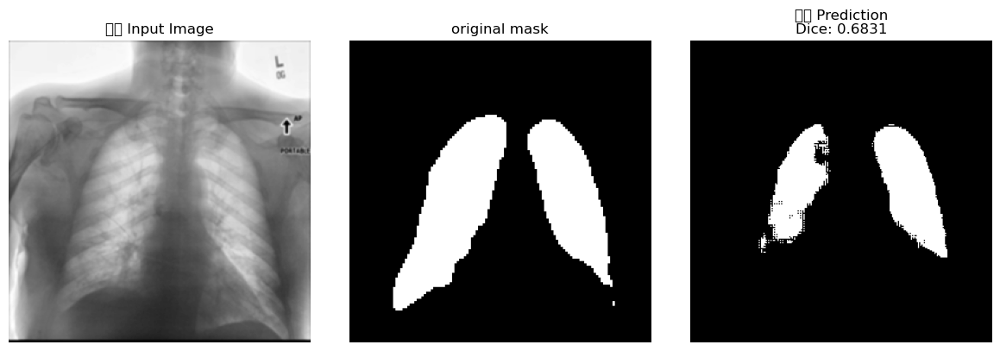

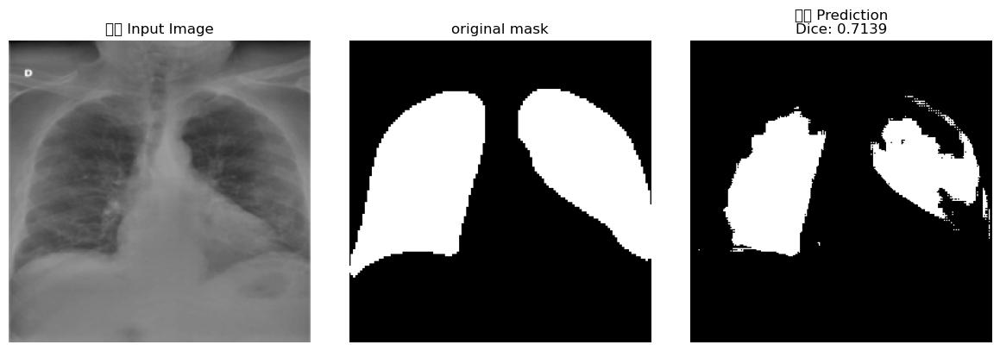

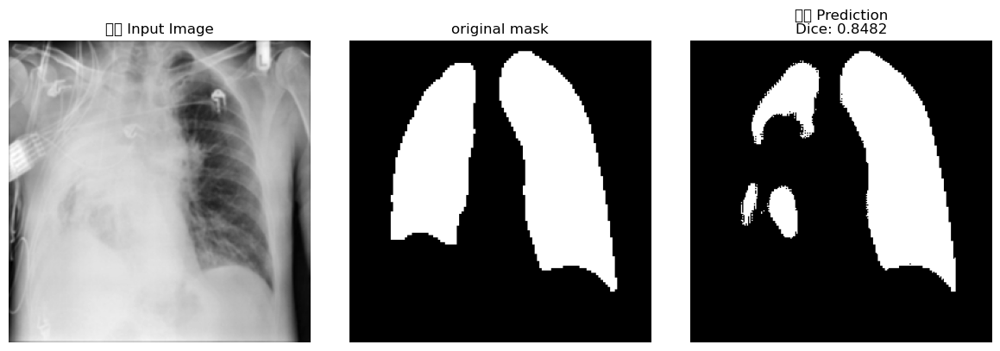

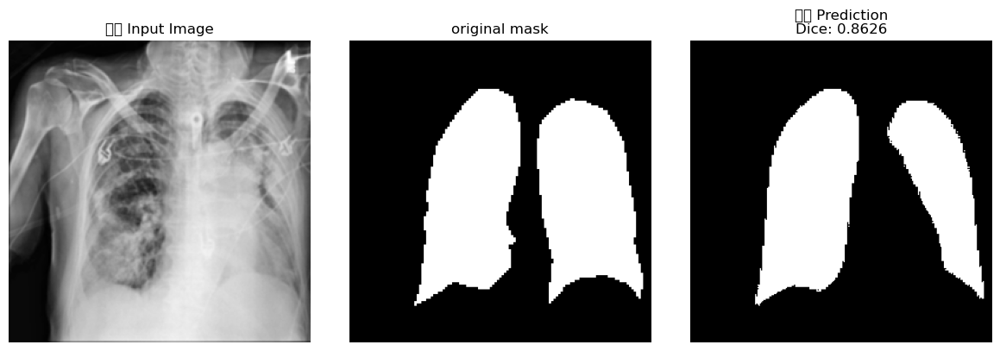

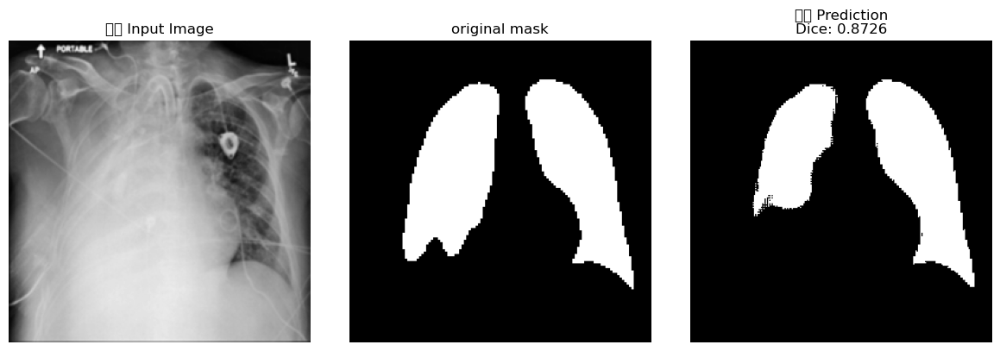

...

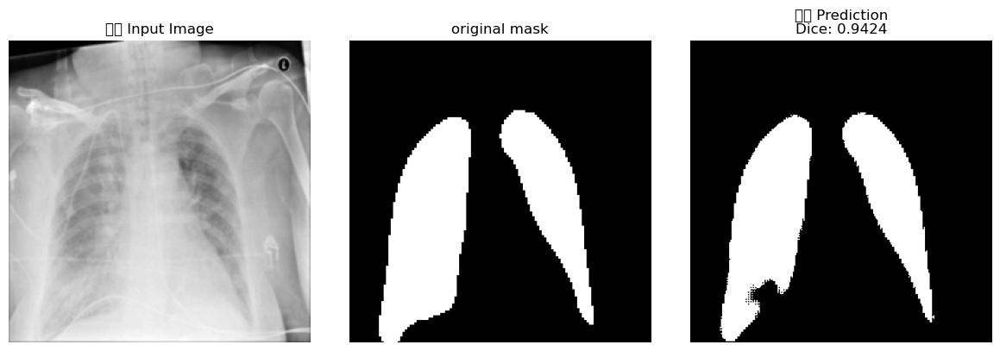

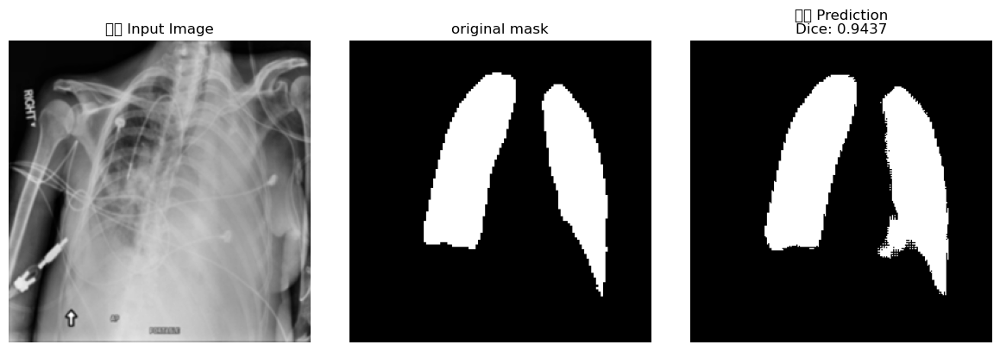

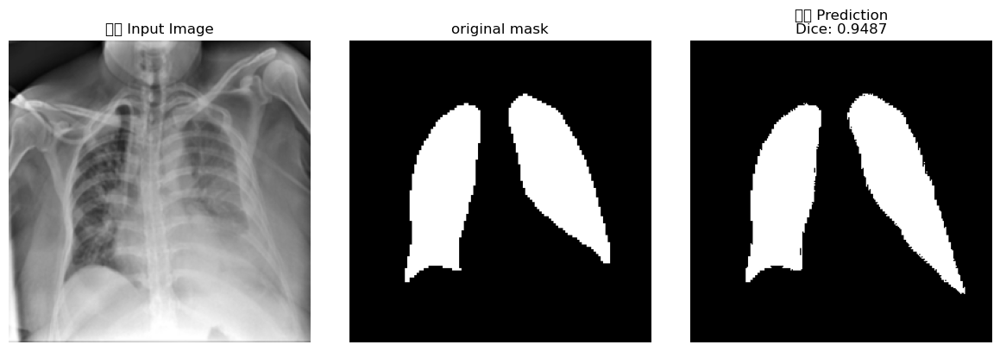

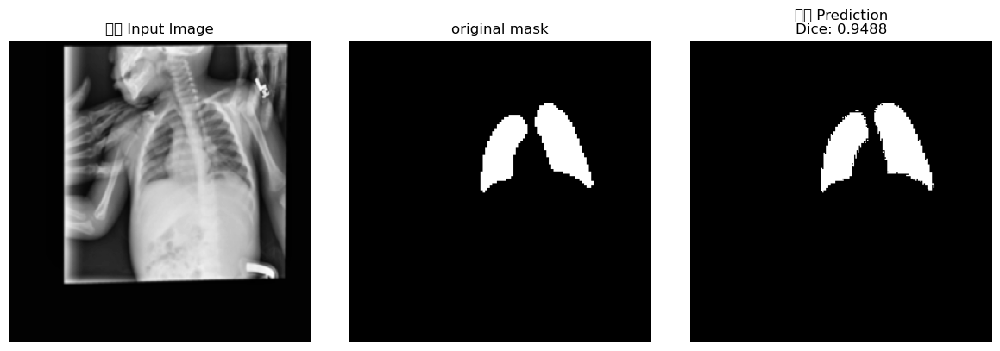

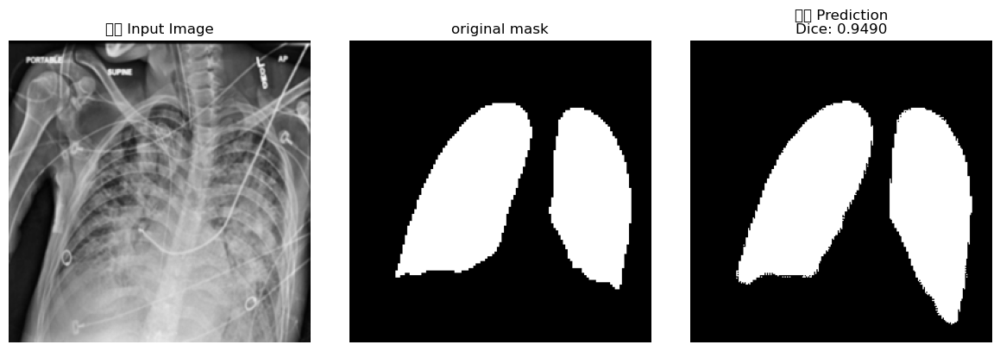

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm import tqdm

#  Dice-Berechnung in NumPy
def dice_coefficient_np(y_true, y_pred, smooth=1e-6):
    y_true = y_true.astype(np.float32)
    y_pred = y_pred.astype(np.float32)
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection + smooth) / (np.sum(y_true) + np.sum(y_pred) + smooth)

#  Lade Bild- und Maskenpfade
image_dir = Path(r"C:\Users\majas\Desktop\besonders schlechte masken\finetuning datensatz\images")
mask_dir = Path(r"C:\Users\majas\Desktop\besonders schlechte masken\finetuning datensatz\maken")

image_paths = sorted([str(p) for p in image_dir.glob("*.png")])
mask_paths = sorted([str(p) for p in mask_dir.glob("*.png")])

#  Lade dein Modell
model_path = r"C:\Users\majas\Desktop\masken 2\hard examples models\finetuned_model_final.keras"
model = tf.keras.models.load_model(model_path, compile=False)

#  Bild-/Masken-Vorverarbeitung
def preprocess(image_path, mask_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=1)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, [256, 256])

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.cast(mask > 127, tf.float32)
    mask = tf.image.resize(mask, [256, 256])

    return image, mask

# Erstelle Dataset
ds = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
ds = ds.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE).batch(1)

#  Berechne Dice-Score für alle Beispiele
dice_scores = []
imgs, masks, preds = [], [], []

for batch in tqdm(ds, desc="🔍 Evaluierung"):
    img, mask = batch
    pred = model(img, training=False).numpy()
    pred_bin = (pred > 0.5).astype(np.float32)

    dice = dice_coefficient_np(mask.numpy(), pred_bin)
    dice_scores.append(dice)
    imgs.append(img.numpy().squeeze())
    masks.append(mask.numpy().squeeze())
    preds.append(pred_bin.squeeze())

#  Top 20 schlechteste Vorhersagen anzeigen
worst_ids = np.argsort(dice_scores)[:20]

for i, idx in enumerate(worst_ids):
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(imgs[idx], cmap='gray')
    axs[0].set_title("📸 Eingabebild")
    axs[1].imshow(masks[idx], cmap='gray')
    axs[1].set_title("Originalmaske")
    axs[2].imshow(preds[idx], cmap='gray')
    axs[2].set_title(f"🧠 Vorhersage\nDice: {dice_scores[idx]:.4f}")
    for ax in axs: ax.axis("off")
    plt.tight_layout()
    plt.show()


further fine tuning

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import os
from pathlib import Path
import tensorflow.keras.backend as K

# Model path
model_path = r"C:\Users\majas\Desktop\masken 2\hard examples models\finetuned_model_final.keras"

# Load model
generator = load_model(model_path, custom_objects=custom_objects)
print(" Model loaded successfully.")

import os

print(" Directory exists?", os.path.isdir(os.path.dirname(model_path)))
print(" File exists?", os.path.isfile(model_path))

#  Reload model from different path
from pathlib import Path

model_path = Path(r"C:\Users\majas\Desktop\masken 2\hard examples models\2 finetuning\finetuned_model_best.keras")
assert model_path.exists(), f"❌ Model not found at: {model_path}"

generator = load_model(model_path, custom_objects=custom_objects)

#  Compile the model
generator.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss=combined_loss,
    metrics=[dice_coefficient, iou_metric]
)

#  Directory to save best model
SAVE_DIR = r"C:\Users\majas\Desktop\masken 2\hard examples models"
os.makedirs(SAVE_DIR, exist_ok=True)
checkpoint_path = os.path.join(SAVE_DIR, "finetuned_model_best.keras")

#  Callbacks
checkpoint_cb = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='loss',
    save_best_only=True,
    save_weights_only=False,
    verbose=1
)

earlystop_cb = EarlyStopping(
    monitor='loss',
    patience=3,
    restore_best_weights=True,
    verbose=1
)

reduce_lr_cb = ReduceLROnPlateau(
    monitor='loss',
    factor=0.5,
    patience=2,
    min_lr=1e-6,
    verbose=1
)

# Start fine-tuning on "hard" examples
history = generator.fit(
    train_ds,
    validation_data=val_ds,
    epochs=20,
    callbacks=[checkpoint_cb, earlystop_cb, reduce_lr_cb],
    verbose=1
)

#  Also save final version
generator.save(os.path.join(SAVE_DIR, "finetuned_model_final.keras"))


📂 Existiert Ordner? False
📄 Existiert Datei? False
Epoch 1/20
239/239 [==============================] - ETA: 0s - loss: 0.0173 - dice_coefficient: 0.9815 - iou_metric: 0.9637
Epoch 1: loss improved from inf to 0.01731, saving model to C:\Users\majas\Desktop\masken 2\hard examples models\finetuned_model_best.keras
239/239 [==============================] - 78s 301ms/step - loss: 0.0173 - dice_coefficient: 0.9815 - iou_metric: 0.9637 - val_loss: 0.0617 - val_dice_coefficient: 0.9596 - val_iou_metric: 0.9233 - lr: 1.0000e-05
Epoch 2/20
239/239 [==============================] - ETA: 0s - loss: 0.0172 - dice_coefficient: 0.9816 - iou_metric: 0.9639
Epoch 2: loss improved from 0.01731 to 0.01722, saving model to C:\Users\majas\Desktop\masken 2\hard examples models\finetuned_model_best.keras
239/239 [==============================] - 71s 297ms/step - loss: 0.0172 - dice_coefficient: 0.9816 - iou_metric: 0.9639 - val_loss: 0.0621 - val_dice_coefficient: 0.9596 - val_iou_metric: 0.9232 - lr: 

test

🔍 Evaluating: 100%|██████████| 299/299 [00:34<00:00,  8.63it/s]


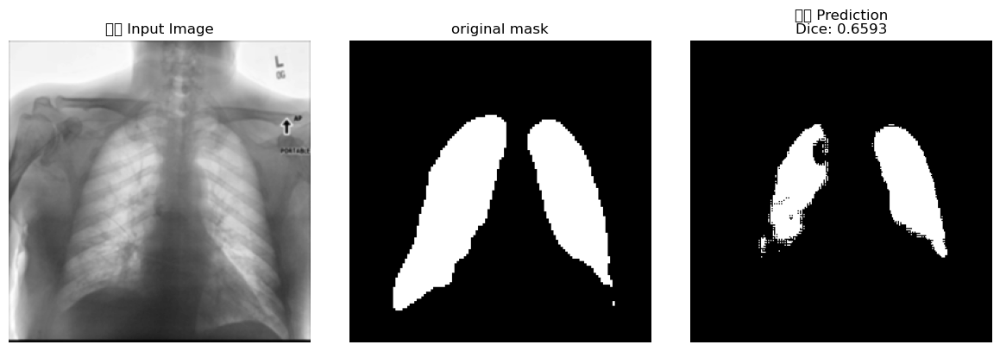

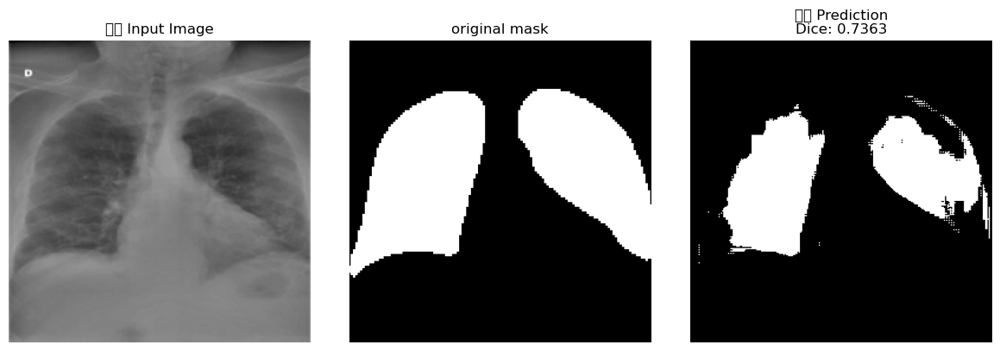

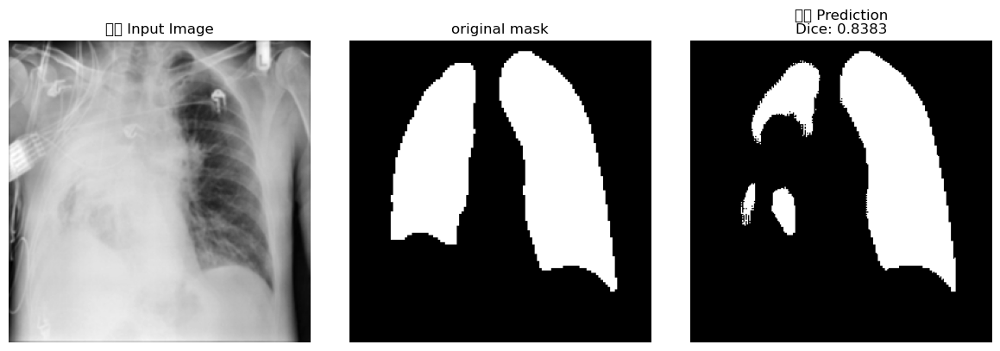

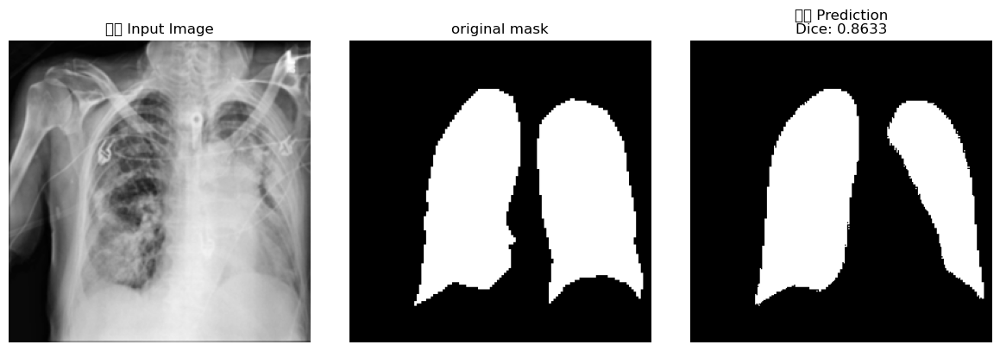

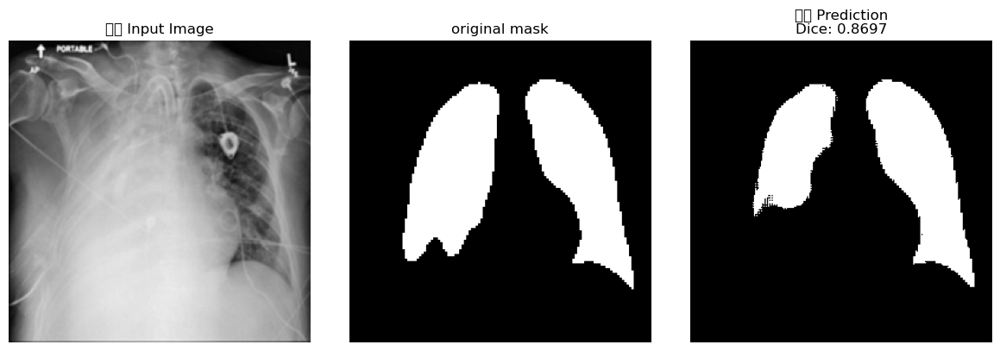

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm import tqdm
from tensorflow.keras.models import load_model
import tensorflow.keras.backend as K

# 🔁 Custom metrics & loss (same as used during training!)
# Dice score calculated with NumPy
def dice_coefficient_np(y_true, y_pred):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred)
    return (2. * intersection + 1e-6) / (union + 1e-6)

def iou_metric(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    return (intersection + 1e-6) / (union + 1e-6)

def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

def combined_loss(y_true, y_pred):
    return 0.5 * dice_loss(y_true, y_pred) + 0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred)

# Custom objects and model path
custom_objects = {
    "dice_coefficient": dice_coefficient,
    "iou_metric": iou_metric,
    "dice_loss": dice_loss,
    "combined_loss": combined_loss
}

# 📁 Load image and mask paths
image_dir = Path(r"C:\Users\majas\Desktop\besonders schlechte masken\finetuning datensatz\images")
mask_dir = Path(r"C:\Users\majas\Desktop\besonders schlechte masken\finetuning datensatz\maken")

image_paths = sorted([str(p) for p in image_dir.glob("*.png")])
mask_paths = sorted([str(p) for p in mask_dir.glob("*.png")])

# 📦 Load your model
model_path = r"C:\Users\majas\Desktop\masken 2\hard examples models\2 finetuning\finetuned_model_best.keras"
model = tf.keras.models.load_model(model_path, compile=False)

# 🧼 Preprocess image and mask
def preprocess(image_path, mask_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=1)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, [256, 256])

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.cast(mask > 127, tf.float32)
    mask = tf.image.resize(mask, [256, 256])

    return image, mask

# 📦 Prepare dataset
ds = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
ds = ds.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE).batch(1)

# 📉 Calculate Dice scores for all samples
dice_scores = []
imgs, masks, preds = [], [], []

for batch in tqdm(ds, desc="🔍 Evaluating"):
    img, mask = batch
    pred = model(img, training=False).numpy()
    pred_bin = (pred > 0.5).astype(np.float32)

    dice = dice_coefficient_np(mask.numpy(), pred_bin)
    dice_scores.append(dice)
    imgs.append(img.numpy().squeeze())
    masks.append(mask.numpy().squeeze())
    preds.append(pred_bin.squeeze())

# 🔎 Top 5 worst predictions
worst_ids = np.argsort(dice_scores)[:5]

for i, idx in enumerate(worst_ids):
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(imgs[idx], cmap='gray')
    axs[0].set_title("📸 Input Image")
    axs[1].imshow(masks[idx], cmap='gray')
    axs[1].set_title("Original Mask")
    axs[2].imshow(preds[idx], cmap='gray')
    axs[2].set_title(f"🧠 Prediction\nDice: {dice_scores[idx]:.4f}")
    for ax in axs:
        ax.axis("off")
    plt.tight_layout()
    plt.show()


testing the model

read all data

In [ ]:
import os
import tensorflow as tf
from sklearn.model_selection import train_test_split

#  Directories
BASE_PROCESSED_DIR = r"C:\Users\majas\Desktop\besonders schlechte masken\bearbeitete_xrays"

#  Function: Collect images & masks
def collect_processed_images_and_masks(base_dir):
    image_paths, mask_paths = [], []

    for cls in ["COVID", "Normal", "Lung_Opacity", "Viral Pneumonia"]:
        images_dir = os.path.join(base_dir, cls, "images")
        masks_dir = os.path.join(base_dir, cls, "masks")

        if not os.path.exists(images_dir) or not os.path.exists(masks_dir):
            print(f"⚠ WARNING: Missing folders for class '{cls}', skipping...")
            continue

        img_files = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith((".png", ".jpg", ".jpeg"))])
        mask_files = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith((".png", ".jpg", ".jpeg"))])

        if len(img_files) != len(mask_files):
            print(f"⚠ WARNING: Class '{cls}' has {len(img_files)} images but {len(mask_files)} masks!")

        image_paths.extend(img_files)
        mask_paths.extend(mask_files)

    return image_paths, mask_paths

#  Collect images & masks
image_paths, mask_paths = collect_processed_images_and_masks(BASE_PROCESSED_DIR)

if len(image_paths) == 0 or len(mask_paths) == 0:
    raise ValueError(" ERROR: No processed images or masks found! Check the dataset folder.")

print(f" Total test data: {len(image_paths)} images / masks")

#  Load function: read & normalize images and masks
def load_image_and_mask(image_path, mask_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=1)         # -> [H, W, 1]
    image = tf.image.resize(image, [384, 384])
    image = image / 255.0

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)           # -> [H, W, 1]
    mask = tf.image.resize(mask, [384, 384])
    mask = tf.cast(mask, tf.float32) / 255.0
    mask = tf.where(mask > 0.5, 1.0, 0.0)                   # Make binary

    return image, mask

#  Optional: Additional resize transformation to 256x256
def resize_to_256(image, mask):
    image = tf.image.resize(image, [256, 256])
    mask = tf.image.resize(mask, [256, 256])
    return image, mask

#  Create dataset from all data
def create_full_test_dataset(image_paths, mask_paths, batch_size=1):
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    dataset = dataset.map(load_image_and_mask, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.map(resize_to_256, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

#  Now: use full dataset as test dataset
full_test_dataset = create_full_test_dataset(image_paths, mask_paths, batch_size=1)
print(" Full test dataset with all images/masks created!")

#  Debug: shape check
for img, mask in full_test_dataset.take(1):
    print(" Image shape:", img.shape)     # Should be [1, 256, 256, 1]
    print(" Mask shape:", mask.shape)     # Should be [1, 256, 256, 1]


📊 Gesamtdaten für Test: 21165 Bilder / Masken
✅ Vollständiger Testdatensatz mit allen Bildern/Masks erstellt!
📐 Bildform: (1, 256, 256, 1)
📐 Maskenform: (1, 256, 256, 1)


test once for dice loss IOU etc. on entire data set

📦 Lade Modell...
✅ Modell erfolgreich geladen!

🚀 Starte Auswertung über den vollständigen Testdatensatz...



Berechnung läuft:   0%|          | 0/21165 [00:00<?, ?it/s]


📸 Beispiel 1
• Dice: 0.9864 | IoU: 0.9731 | Loss: 0.0327
• Ground Truth Sum: 15359 | Prediction Sum: 15475


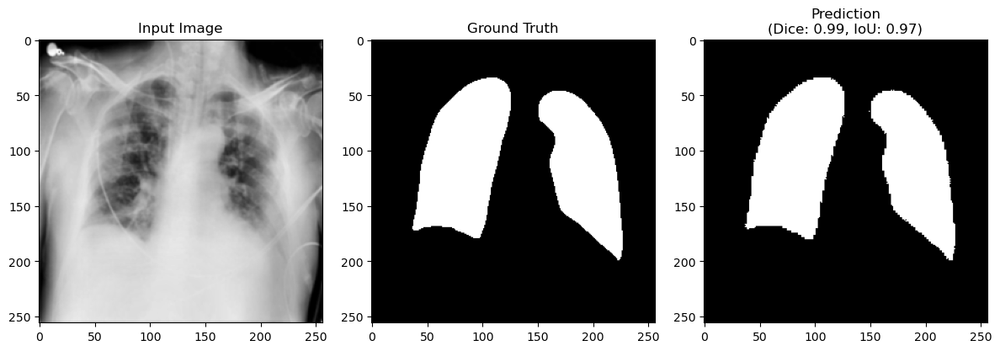

Berechnung läuft:   0%|          | 1/21165 [00:03<18:30:18,  3.15s/it]


📸 Beispiel 1
• Dice: 0.9806 | IoU: 0.9619 | Loss: 0.0529
• Ground Truth Sum: 17225 | Prediction Sum: 17719


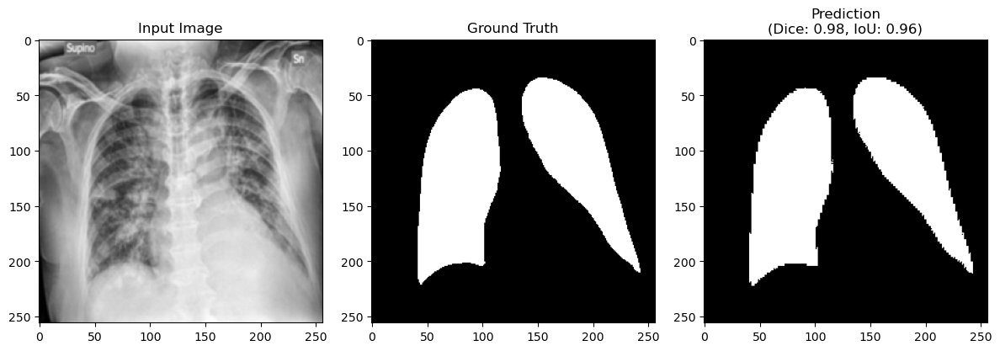

Berechnung läuft:   0%|          | 2/21165 [00:04<11:04:53,  1.89s/it]


📸 Beispiel 1
• Dice: 0.9785 | IoU: 0.9579 | Loss: 0.0568
• Ground Truth Sum: 15102 | Prediction Sum: 15720


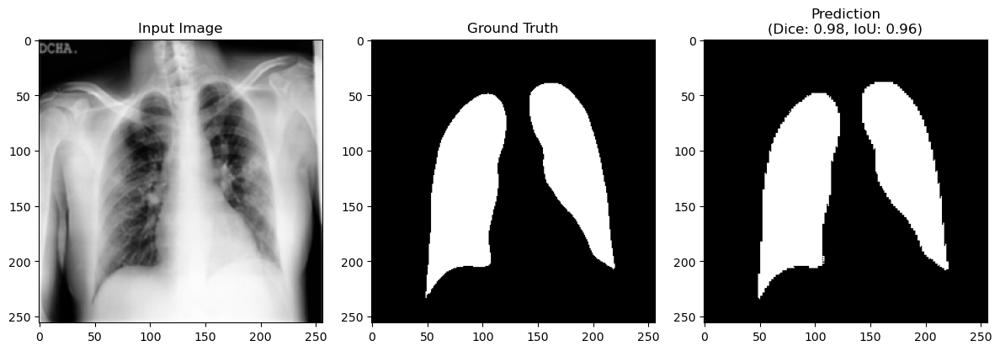

Berechnung läuft:   0%|          | 3/21165 [00:05<8:47:30,  1.50s/it] 


📸 Beispiel 1
• Dice: 0.9776 | IoU: 0.9563 | Loss: 0.0612
• Ground Truth Sum: 16121 | Prediction Sum: 16488


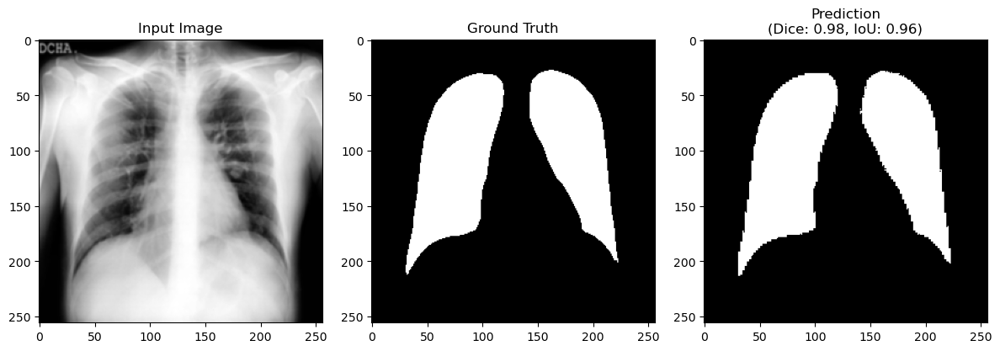

Berechnung läuft:   0%|          | 4/21165 [00:06<7:37:48,  1.30s/it]


📸 Beispiel 1
• Dice: 0.9737 | IoU: 0.9488 | Loss: 0.0559
• Ground Truth Sum: 9726 | Prediction Sum: 10200


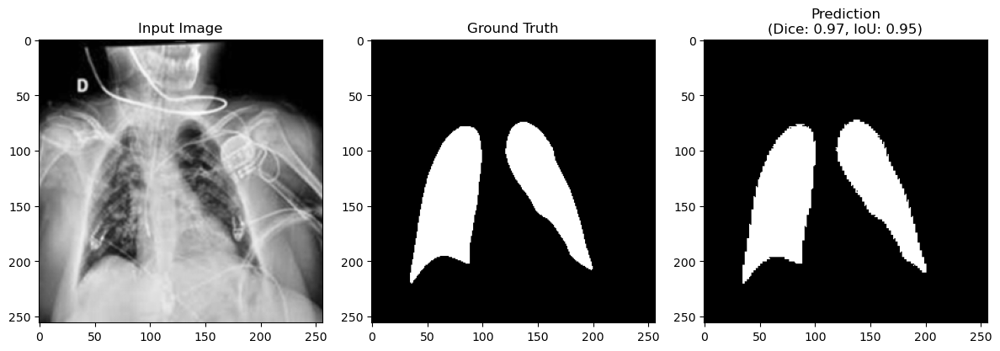

Berechnung läuft: 100%|██████████| 21165/21165 [1:43:55<00:00,  3.39it/s]  


📊 Ergebnisse auf dem vollständigen Testdatensatz:
• Durchschnittlicher Dice Score:     0.9768
• Durchschnittlicher IoU Score:      0.9551
• Durchschnittlicher Combined Loss:  0.0649


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from tensorflow.keras.models import load_model

#  Prepare test dataset
image_paths, mask_paths = collect_processed_images_and_masks(BASE_PROCESSED_DIR)
full_test_dataset = create_full_test_dataset(image_paths, mask_paths, batch_size=1)

#  Load model
model_path = r"C:\Users\majas\Desktop\masken 2\hard examples models\finetuned_model_best.keras"
print("📦 Loading model...")
model = load_model(model_path, compile=False)
print("✅ Model successfully loaded!")

#  Dice and IoU metrics
def dice_coefficient(y_true, y_pred, smooth=1e-6):
    intersection = tf.reduce_sum(y_true * y_pred, axis=[1,2,3])
    denominator = tf.reduce_sum(y_true, axis=[1,2,3]) + tf.reduce_sum(y_pred, axis=[1,2,3])
    dice = (2. * intersection + smooth) / (denominator + smooth)
    return tf.reduce_mean(dice)

def iou_metric(y_true, y_pred, smooth=1e-6):
    intersection = tf.reduce_sum(y_true * y_pred, axis=[1,2,3])
    union = tf.reduce_sum(y_true, axis=[1,2,3]) + tf.reduce_sum(y_pred, axis=[1,2,3]) - intersection
    iou = (intersection + smooth) / (union + smooth)
    return tf.reduce_mean(iou)

#  Example loss function (placeholder - make sure combined_loss is defined)
def combined_loss(y_true, y_pred):
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    dice = dice_coefficient(y_true, y_pred)
    return bce + (1 - dice)

#  Evaluation preparation
bad_example_count = 0
max_debug_examples = 5
dice_scores = []
iou_scores = []
losses = []

print("\n Starting evaluation over the full test dataset...\n")

example_counter = 0

for img, true_mask in tqdm(full_test_dataset, desc="Processing"):
    img = tf.cast(img, tf.float32)
    true_mask = tf.cast(true_mask, tf.float32)
    true_mask = tf.where(true_mask > 0.5, 1.0, 0.0)

    pred_mask = model.predict(img, verbose=0)
    pred_binary = tf.cast((pred_mask > 0.5), tf.float32)

    dice = dice_coefficient(true_mask, pred_binary).numpy().item()
    iou = iou_metric(true_mask, pred_binary).numpy().item()
    loss = tf.reduce_mean(combined_loss(true_mask, pred_mask)).numpy().item()

    dice_scores.append(dice)
    iou_scores.append(iou)
    losses.append(loss)

    true_sum = tf.reduce_sum(true_mask).numpy()
    pred_sum = tf.reduce_sum(pred_binary).numpy()

    # Show image if it's among the first 3 or has low Dice score
    if example_counter < 3 or dice < 0.5:
        if bad_example_count < max_debug_examples:
            print(f"\n📸 Example {example_counter + 1}")
            print(f"• Dice: {dice:.4f} | IoU: {iou:.4f} | Loss: {loss:.4f}")
            print(f"• Ground Truth Sum: {true_sum:.0f} | Prediction Sum: {pred_sum:.0f}")

            fig, axs = plt.subplots(1, 3, figsize=(12, 4))
            axs[0].imshow(tf.squeeze(img[0]), cmap='gray')
            axs[0].set_title("Input Image")
            axs[1].imshow(tf.squeeze(true_mask[0]), cmap='gray')
            axs[1].set_title("Ground Truth")
            axs[2].imshow(tf.squeeze(pred_binary[0]), cmap='gray')
            axs[2].set_title(f"Prediction\n(Dice: {dice:.2f}, IoU: {iou:.2f})")
            plt.tight_layout()
            plt.show()

            bad_example_count += 1

    example_counter += 1

#  Show results
mean_dice = np.mean(dice_scores)
mean_iou = np.mean(iou_scores)
mean_loss = np.mean(losses)

print("\n Results on the full test dataset:")
print(f"• Average Dice Score:     {mean_dice:.4f}")
print(f"• Average IoU Score:      {mean_iou:.4f}")
print(f"• Average Combined Loss:  {mean_loss:.4f}")


more tests

✅ Modell erfolgreich geladen.

Zeige 5 zufällige Vorhersagen


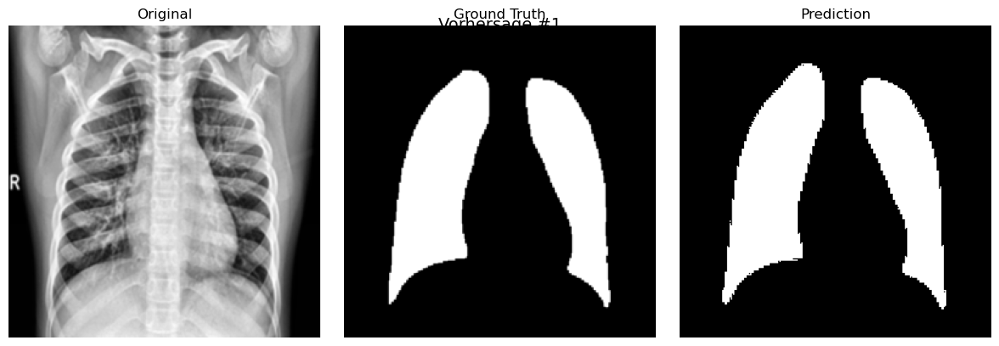

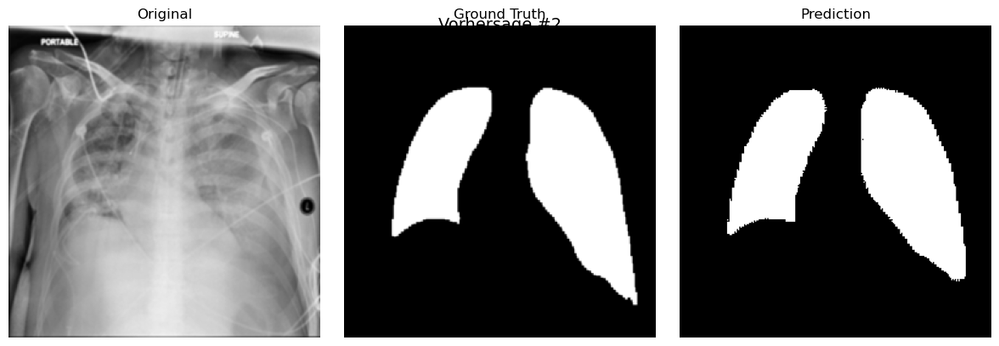

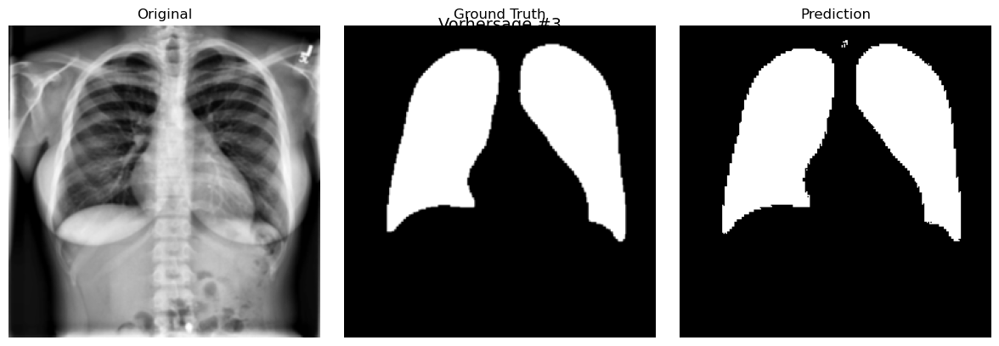

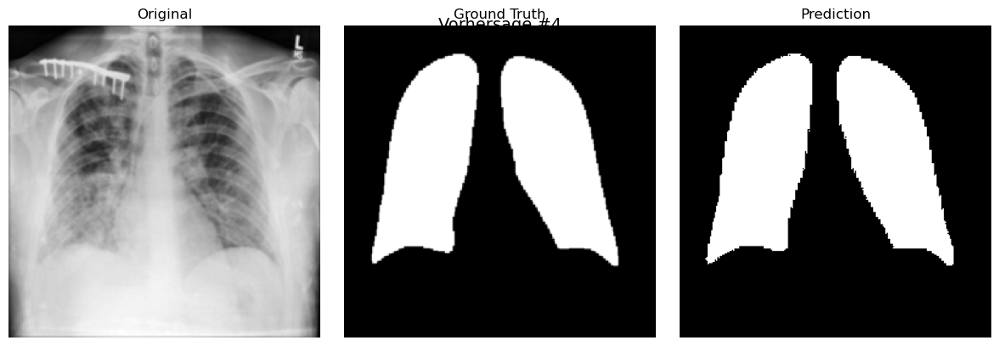

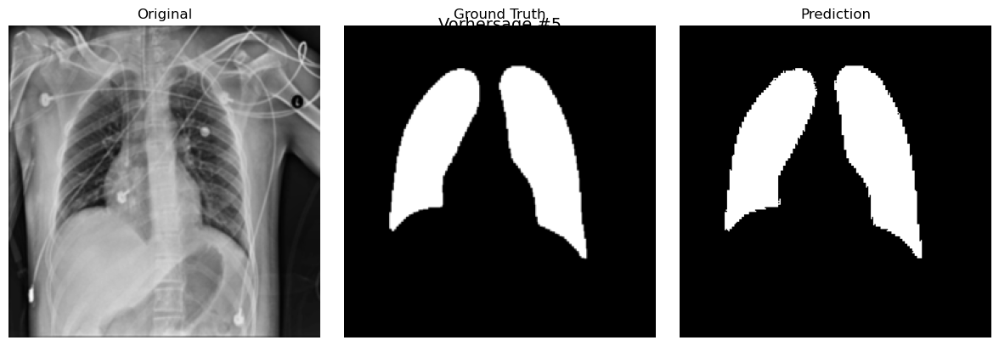


Berechne Dice Scores für alle Samples...


Auswertung läuft: 100%|██████████| 21165/21165 [59:04<00:00,  5.97it/s]  


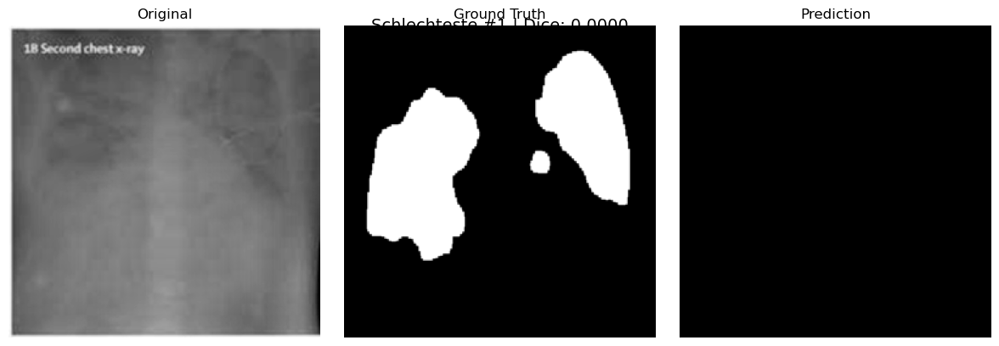

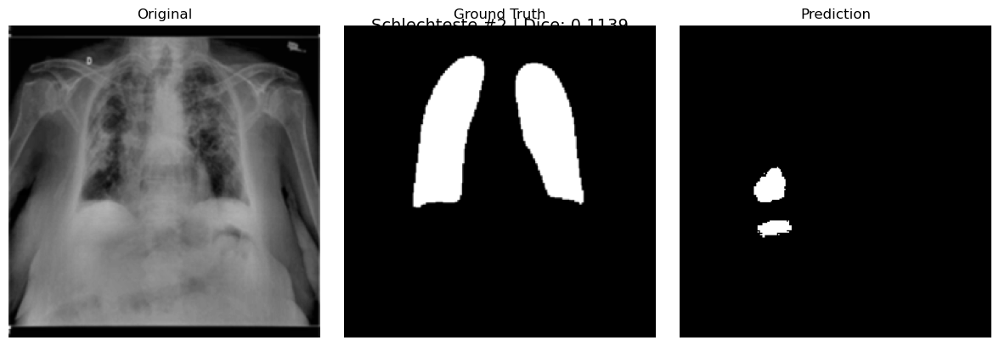

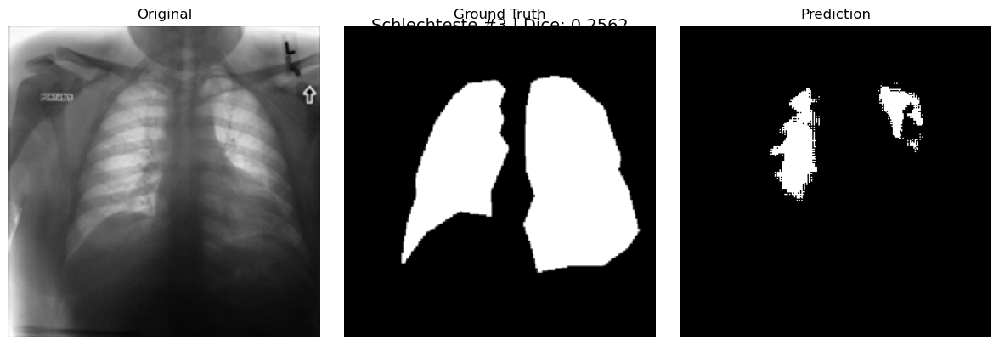

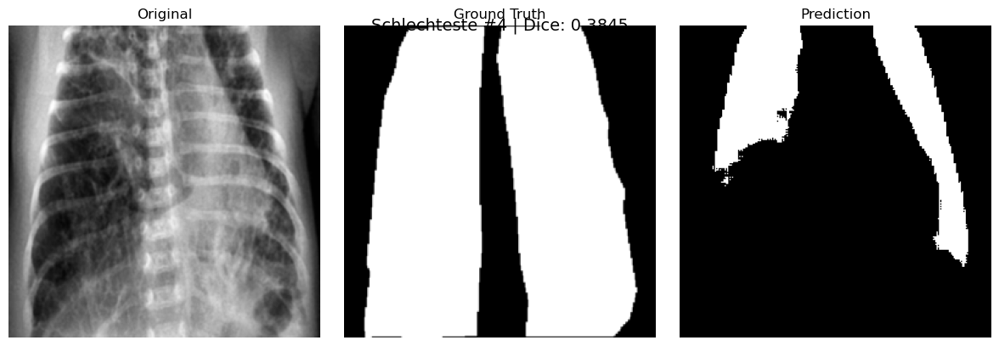

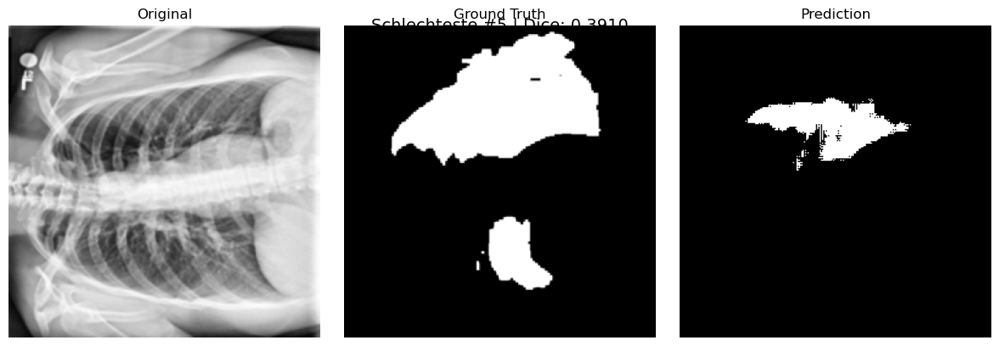


Anzahl der Masken mit Dice < 0.4: 5 von 21165


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import tensorflow as tf
from tensorflow.keras.models import load_model
import tensorflow.keras.backend as K
from tqdm import tqdm

# Metrics & Losses
def dice_coefficient(y_true, y_pred):
    numerator = 2 * K.sum(y_true * y_pred) + 1e-6
    denominator = K.sum(y_true + y_pred) + 1e-6
    return numerator / denominator

def iou_metric(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    return (intersection + 1e-6) / (union + 1e-6)

def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

def combined_loss(y_true, y_pred):
    return 0.5 * dice_loss(y_true, y_pred) + 0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred)

custom_objects = {
    "dice_coefficient": dice_coefficient,
    "iou_metric": iou_metric,
    "dice_loss": dice_loss,
    "combined_loss": combined_loss
}

# Load model
model_path = r"C:\Users\majas\Desktop\masken 2\hard examples models\finetuned_model_best.keras"
generator = load_model(model_path, custom_objects=custom_objects)
print("✅ Model successfully loaded.")

# Plot function
def plot_prediction(image, true_mask, pred_mask, title=""):
    plt.figure(figsize=(12, 4))
    plt.suptitle(title, fontsize=14)
    plt.subplot(1, 3, 1)
    plt.imshow(image[..., 0], cmap='gray')
    plt.title("Original")
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(true_mask[..., 0], cmap='gray')
    plt.title("Ground Truth")
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask[..., 0], cmap='gray')
    plt.title("Prediction")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Unpack all test samples
all_samples = list(full_test_dataset.unbatch().as_numpy_iterator())

# Show 5 random predictions
print("\nShowing 5 random predictions")
random_samples = random.sample(all_samples, 5)

for i, (img, true_mask) in enumerate(random_samples):
    pred = generator.predict(np.expand_dims(img, axis=0), verbose=0)[0]
    pred_binary = (pred > 0.5).astype(np.float32)
    plot_prediction(img, true_mask, pred_binary, title=f"Prediction #{i+1}")

# Collect Dice scores
dice_scores = []
print("\nCalculating Dice scores for all samples...")

for img, true_mask in tqdm(all_samples, desc="Evaluating"):
    pred = generator.predict(np.expand_dims(img, axis=0), verbose=0)[0]
    pred_binary = (pred > 0.5).astype(np.float32)

    intersection = np.sum(pred_binary * true_mask)
    union = np.sum(pred_binary) + np.sum(true_mask)
    dice = (2 * intersection + 1e-6) / (union + 1e-6)

    dice_scores.append((dice, img, true_mask, pred_binary))

# Show 5 worst predictions
worst_samples = sorted(dice_scores, key=lambda x: x[0])[:5]

for i, (dice, img, true_mask, pred_binary) in enumerate(worst_samples):
    plot_prediction(img, true_mask, pred_binary, title=f"Worst #{i+1} | Dice: {dice:.4f}")

# Count masks with Dice < 0.4
all_dice_values = [score[0] for score in dice_scores]
num_bad = sum(d < 0.4 for d in all_dice_values)

print(f"\nNumber of masks with Dice < 0.4: {num_bad} out of {len(all_dice_values)}")


10 worst masks


Zeige die 10 schlechtesten Vorhersagen basierend auf Dice Score...


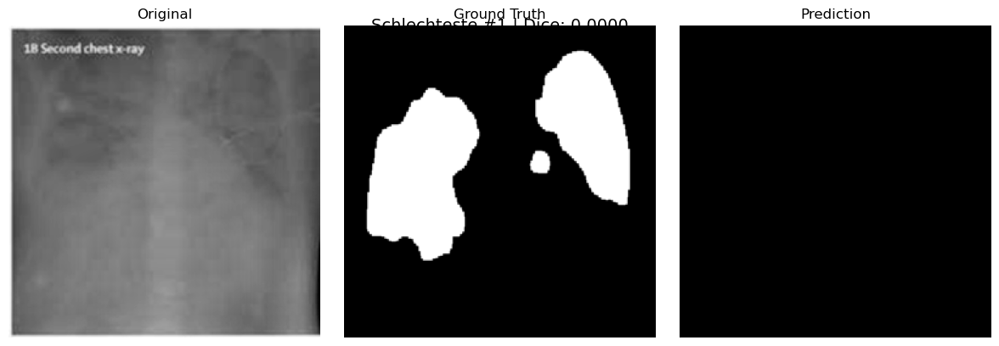

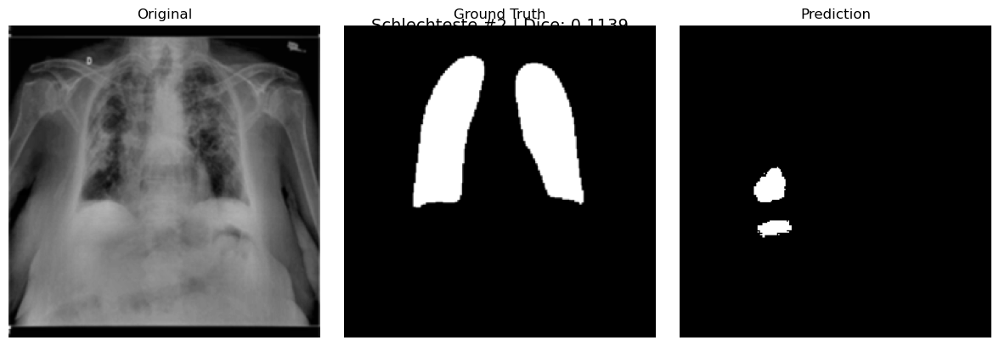

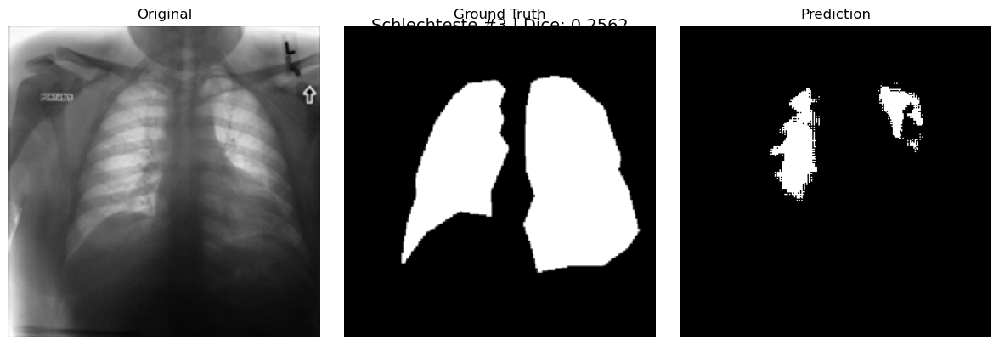

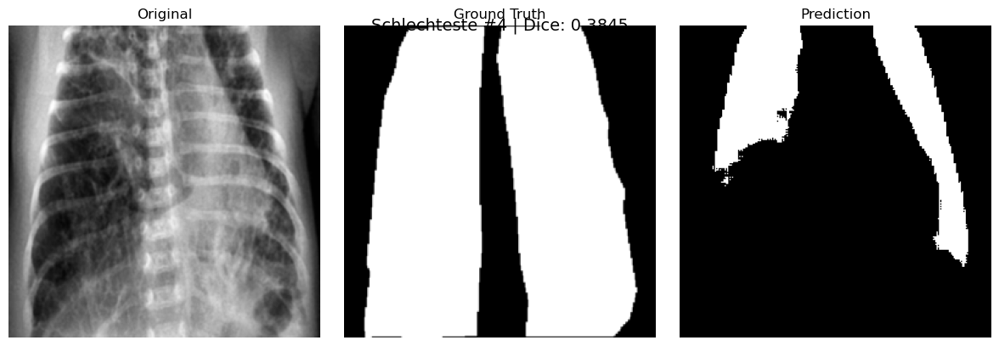

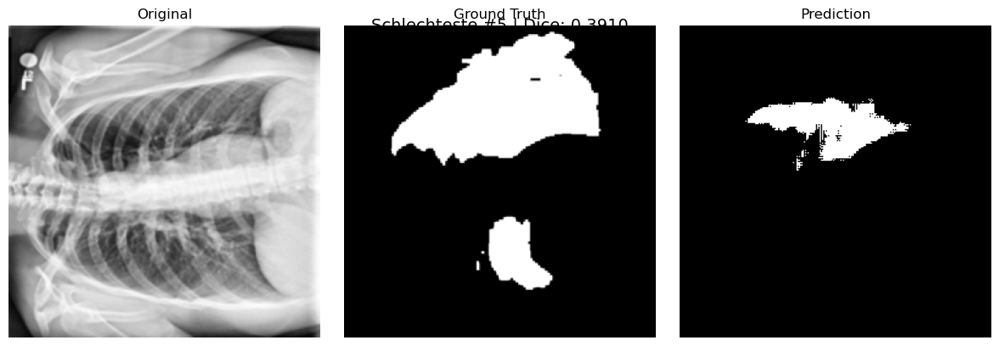

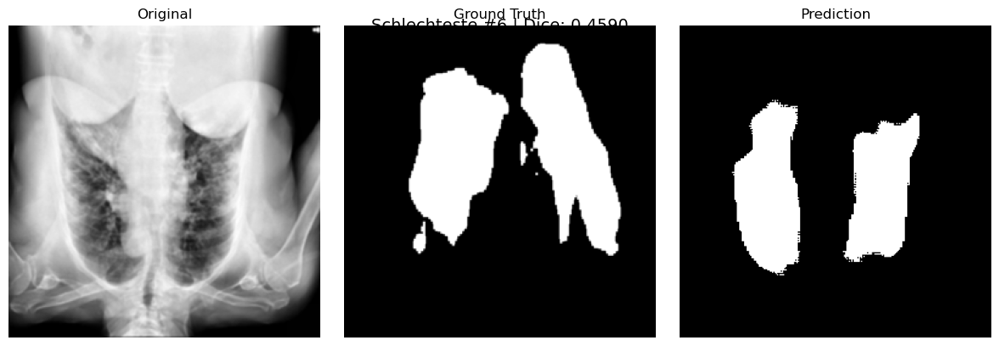

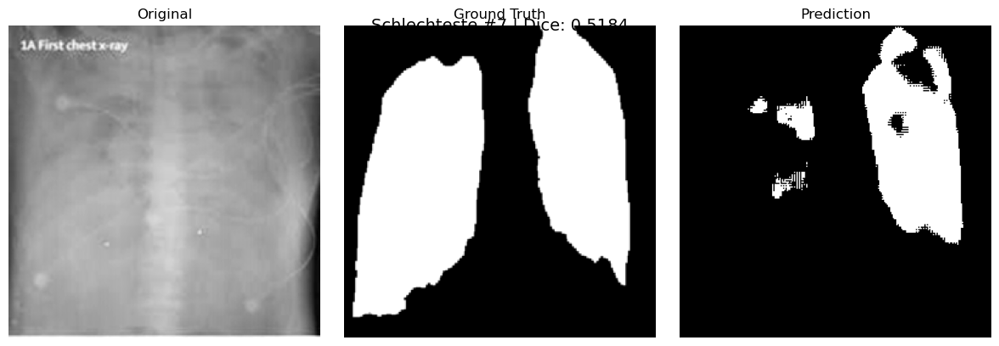

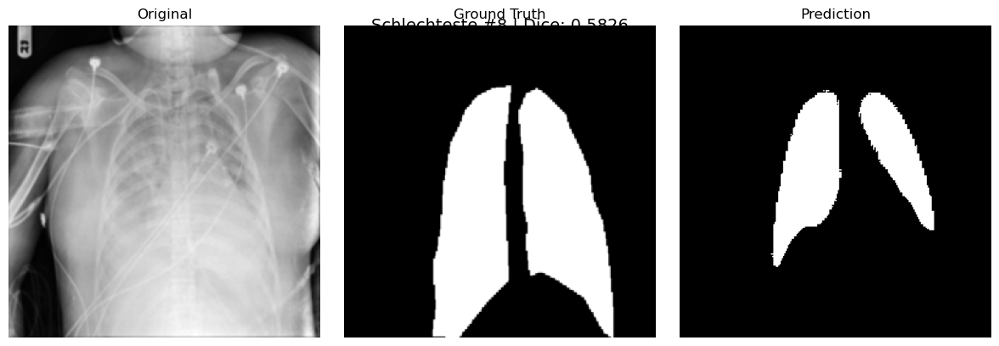

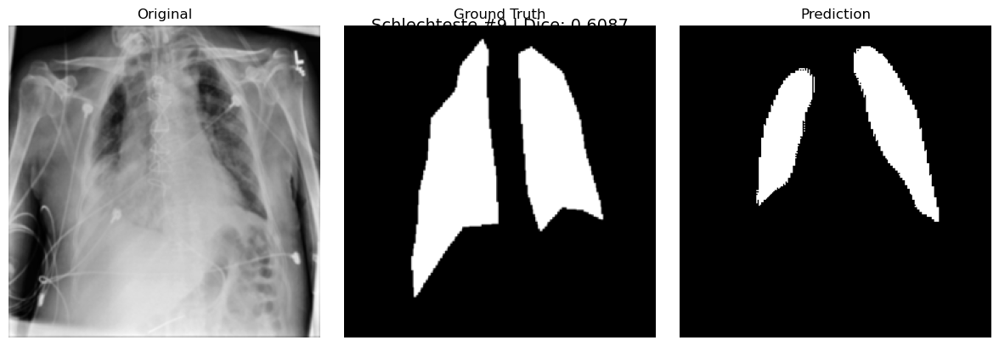

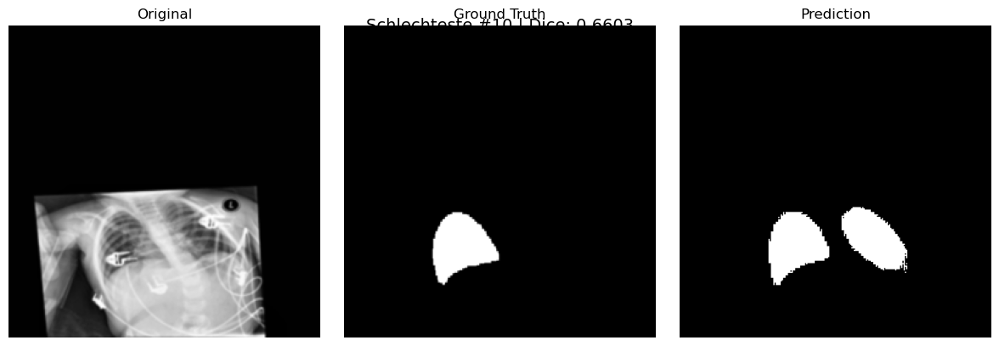

In [ ]:
# 📌 Display the 10 worst predictions (based on previously calculated dice_scores)
print("\nDisplay the 10 worst predictions based on Dice Score...")

worst_10 = sorted(dice_scores, key=lambda x: x[0])[:10]

for i, (dice, img, true_mask, pred_binary) in enumerate(worst_10):
plot_prediction(img, true_mask, pred_binary, title=f"Worst #{i+1} | Dice: {dice: .4f}")

final fine-tuning for smoother edges

make a second clear sentence

In [ ]:
import os
import cv2
from pathlib import Path
from shutil import copy2
from tqdm import tqdm

#  Source directory
source_dir = Path(r"C:\Users\majas\A COVID PROJEKT\COVID-19_Radiography_Dataset")

#  Target directory
target_dir = Path(r"C:\Users\majas\Desktop\masken 2\bearebeietete röngenbilder 2")

#  CLAHE configuration
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

#  Iterate through all class folders
for class_folder in source_dir.iterdir():
    if not class_folder.is_dir():
        continue

    class_name = class_folder.name
    image_dir = class_folder / "images"
    mask_dir = class_folder / "masks"

    #  Create target folder for class
    target_image_dir = target_dir / class_name / "processed images"
    target_mask_dir = target_dir / class_name / "masks"
    target_image_dir.mkdir(parents=True, exist_ok=True)
    target_mask_dir.mkdir(parents=True, exist_ok=True)

    print(f" Processing class: {class_name}")

    #  Copy images (without processing)
    for image_file in tqdm(list(image_dir.glob("*.png")), desc=f"📷 Copying images ({class_name})"):
        copy2(image_file, target_image_dir / image_file.name)

    #  Apply CLAHE to masks
    for mask_file in tqdm(list(mask_dir.glob("*.png")), desc=f"🎭 Processing masks ({class_name})"):
        mask = cv2.imread(str(mask_file), cv2.IMREAD_GRAYSCALE)
        if mask is None:
            print(f" Failed to load: {mask_file}")
            continue

        enhanced_mask = clahe.apply(mask)
        save_path = target_mask_dir / mask_file.name
        cv2.imwrite(str(save_path), enhanced_mask)

print(" All classes processed successfully!")


🔍 Bearbeite Klasse: COVID


🎭 Verarbeite Masken (COVID): 100%|██████████| 3616/3616 [00:05<00:00, 705.92it/s]


🔍 Bearbeite Klasse: Lung_Opacity


🎭 Verarbeite Masken (Lung_Opacity): 100%|██████████| 6012/6012 [00:08<00:00, 688.17it/s]


🔍 Bearbeite Klasse: Normal


🎭 Verarbeite Masken (Normal): 100%|██████████| 10192/10192 [00:15<00:00, 638.90it/s]


🔍 Bearbeite Klasse: Viral Pneumonia


🎭 Verarbeite Masken (Viral Pneumonia): 100%|██████████| 1345/1345 [00:01<00:00, 676.75it/s]

✅ Alle Klassen erfolgreich verarbeitet!


import images

In [ ]:
import os
import tensorflow as tf
from sklearn.model_selection import train_test_split
from collections import defaultdict
import pandas as pd

#  Main directory with processed X-ray images
base_dir = r"C:\Users\majas\Desktop\masken 2\bearebeietete röngenbilder 2"

#  Function: Collect images & masks
def collect_processed_images_and_masks(base_dir):
    image_paths, mask_paths = [], []
    class_counts = defaultdict(lambda: {"images": 0, "masks": 0})

    for cls in ["COVID", "Normal", "Lung_Opacity", "Viral Pneumonia"]:
        images_dir = os.path.join(base_dir, cls, "images")
        masks_dir = os.path.join(base_dir, cls, "masken")

        if not os.path.exists(images_dir) or not os.path.exists(masks_dir):
            print(f"⚠ WARNING: Missing folders for class '{cls}', skipping...")
            continue

        img_files = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith((".png", ".jpg", ".jpeg"))])
        mask_files = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith((".png", ".jpg", ".jpeg"))])

        class_counts[cls]["images"] = len(img_files)
        class_counts[cls]["masks"] = len(mask_files)

        if len(img_files) != len(mask_files):
            print(f"⚠ WARNING: Class '{cls}' has {len(img_files)} images but {len(mask_files)} masks!")

        image_paths.extend(img_files)
        mask_paths.extend(mask_files)

    return image_paths, mask_paths, class_counts

#  Read images & masks
image_paths, mask_paths, class_counts = collect_processed_images_and_masks(base_dir)

#  Show class overview
print("\n📊 Overview per class:")
for cls, counts in class_counts.items():
    print(f"{cls}: {counts['images']} images, {counts['masks']} masks")

#  Split into Train (70%), Validation (20%), Test (10%)
train_images, temp_images, train_masks, temp_masks = train_test_split(image_paths, mask_paths, test_size=0.3, random_state=42)
valid_images, test_images, valid_masks, test_masks = train_test_split(temp_images, temp_masks, test_size=0.33, random_state=42)

#  Load function with path
def load_image_and_mask_with_path(image_path, mask_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=1)
    image = tf.image.resize(image, [256, 256]) / 255.0

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.image.resize(mask, [256, 256]) / 255.0

    return image, mask, image_path

#  Dataset creation
def create_tf_dataset(image_paths, mask_paths, batch_size=4, shuffle=True):
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    dataset = dataset.map(load_image_and_mask_with_path, num_parallel_calls=tf.data.AUTOTUNE)

    if shuffle:
        dataset = dataset.shuffle(buffer_size=1000)

    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

#  Create TF Datasets
train_dataset = create_tf_dataset(train_images, train_masks)
valid_dataset = create_tf_dataset(valid_images, valid_masks, shuffle=False)
test_dataset = create_tf_dataset(test_images, test_masks, shuffle=False)

print("\n✅ Datasets with paths successfully created!")



📊 Übersicht pro Klasse:
COVID: 3616 Bilder, 3616 Masken
Normal: 10192 Bilder, 10192 Masken
Lung_Opacity: 6012 Bilder, 6012 Masken
Viral Pneumonia: 1345 Bilder, 1345 Masken

✅ Datensätze mit Pfaden erfolgreich erstellt!


Selecting an image, predicting a mask and smoothing it did not work

📸 Verwendetes Bild: C:\Users\majas\Desktop\masken 2\bearebeietete röngenbilder 2\COVID\images\COVID-2914.png


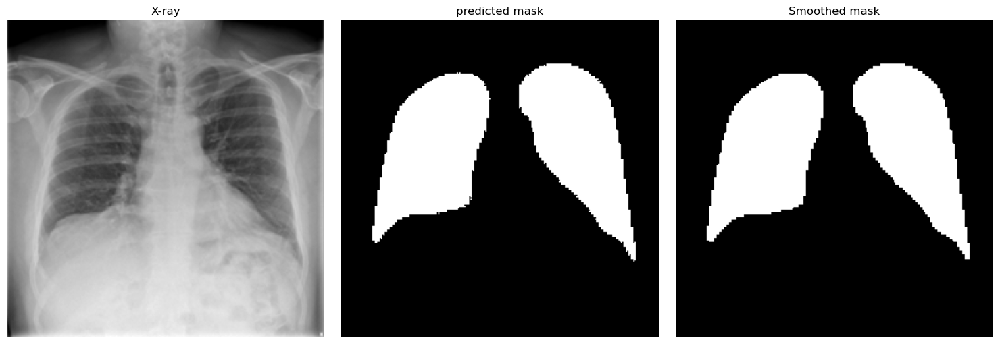

In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

#  Smoothing function for binary masks
def smooth_mask(mask):
    kernel = np.ones((3, 3), np.uint8)
    opened = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    closed = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, kernel)
    return closed

#  Paths
BASE_DIR = r"C:\Users\majas\Desktop\masken 2\bearebeietete röngenbilder 2"
MODEL_PATH = r"C:\Users\majas\Desktop\masken 2\hard examples models\2 finetuning\finetuned_model_best.keras"

#  Load model
model = tf.keras.models.load_model(MODEL_PATH, compile=False)

#  Get a random image from the dataset
def get_random_image(base_path):
    all_image_paths = []
    for cls in os.listdir(base_path):
        image_dir = os.path.join(base_path, cls, "images")
        if os.path.isdir(image_dir):
            all_image_paths.extend([
                os.path.join(image_dir, f) for f in os.listdir(image_dir)
                if f.endswith((".png", ".jpg", ".jpeg"))
            ])
    return random.choice(all_image_paths)

# Load and preprocess image
img_path = get_random_image(BASE_DIR)
print(f"📸 Selected image: {img_path}")

image = tf.io.read_file(img_path)
image = tf.image.decode_png(image, channels=1)
image = tf.image.resize(image, [256, 256]) / 255.0
input_tensor = tf.expand_dims(image, axis=0)

#  Predict mask
pred = model(input_tensor, training=False).numpy()[0]
binary_mask = (pred > 0.5).astype(np.uint8) * 255
smoothed = smooth_mask(binary_mask)

#  Display
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(image.numpy().squeeze(), cmap='gray')
axs[0].set_title("X-ray")
axs[1].imshow(binary_mask.squeeze(), cmap='gray')
axs[1].set_title("Predicted Mask")
axs[2].imshow(smoothed.squeeze(), cmap='gray')
axs[2].set_title("Smoothed Mask")
for ax in axs: ax.axis('off')
plt.tight_layout()
plt.show()


 Visualization and Postprocessing of Predicted Masks using Spline and Polygon Smoothing

📸 Verwendetes Bild: C:\Users\majas\Desktop\masken 2\bearebeietete röngenbilder 2\Lung_Opacity\images\Lung_Opacity-3547.png
⚠️ OpenCV konnte das Bild nicht laden. Verwende TensorFlow-Backup.


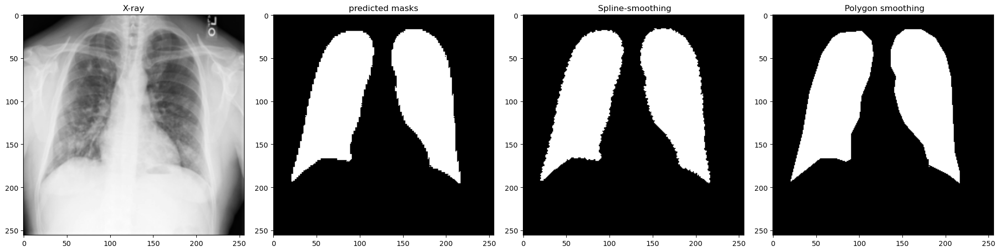

In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from scipy.interpolate import splprep, splev

#  Spline smoothing
def smooth_mask_spline(mask, smoothing=0.01):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    smoothed_mask = np.zeros_like(mask)

    for cnt in contours:
        if len(cnt) < 10:
            continue
        cnt = cnt.squeeze()
        x, y = cnt[:, 0], cnt[:, 1]

        try:
            tck, _ = splprep([x, y], s=smoothing)
            u_fine = np.linspace(0, 1, 1000)
            x_smooth, y_smooth = splev(u_fine, tck)
            pts = np.stack([x_smooth, y_smooth], axis=1).astype(np.int32)
            cv2.drawContours(smoothed_mask, [pts], -1, color=255, thickness=-1)
        except:
            continue

    return smoothed_mask

#  Polygon contour smoothing
def smooth_contour_poly(mask, epsilon=2.0):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    smoothed = np.zeros_like(mask)
    
    for cnt in contours:
        approx = cv2.approxPolyDP(cnt, epsilon, closed=True)
        cv2.drawContours(smoothed, [approx], -1, color=255, thickness=-1)

    return smoothed

#  Directories
BASE_DIR = r"C:\Users\majas\Desktop\masken 2\bearebeietete röngenbilder 2"
MODEL_PATH = r"C:\Users\majas\Desktop\masken 2\hard examples models\2 finetuning\finetuned_model_best.keras"

#  Load the model
model = tf.keras.models.load_model(MODEL_PATH, compile=False)

#  Select a random image
def get_random_image_path(base_path):
    all_image_paths = []
    for cls in os.listdir(base_path):
        image_dir = os.path.join(base_path, cls, "images")
        if os.path.isdir(image_dir):
            all_image_paths.extend([
                os.path.join(image_dir, f) for f in os.listdir(image_dir)
                if f.endswith((".png", ".jpg", ".jpeg"))
            ])
    return random.choice(all_image_paths)

#  Start pipeline
img_path = get_random_image_path(BASE_DIR)
print(f" Selected image: {img_path}")

#  Prepare image for model
image_tf = tf.io.read_file(img_path)
image_tf = tf.image.decode_png(image_tf, channels=1)
image_tf = tf.image.resize(image_tf, [256, 256]) / 255.0
input_tensor = tf.expand_dims(image_tf, axis=0)

#  Predict mask
pred = model(input_tensor, training=False).numpy()[0]
binary_mask = (pred > 0.5).astype(np.uint8) * 255

# ➰ Apply both smoothing methods
smoothed_spline = smooth_mask_spline(binary_mask, smoothing=5)
smoothed_poly = smooth_contour_poly(binary_mask, epsilon=2.0)

#  Load original image for display
image_cv2 = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
if image_cv2 is None:
    print(f" OpenCV could not load the image. Using TensorFlow backup.")
    image_cv2 = image_tf.numpy().squeeze() * 255
    image_cv2 = image_cv2.astype(np.uint8)

#  Display
plt.figure(figsize=(20, 5))
plt.subplot(1, 4, 1)
plt.imshow(image_cv2, cmap='gray')
plt.title("X-ray")

plt.subplot(1, 4, 2)
plt.imshow(binary_mask.squeeze(), cmap='gray')
plt.title("Predicted Mask")

plt.subplot(1, 4, 3)
plt.imshow(smoothed_spline.squeeze(), cmap='gray')
plt.title("Spline Smoothing")

plt.subplot(1, 4, 4)
plt.imshow(smoothed_poly.squeeze(), cmap='gray')
plt.title("Polygon Smoothing")

plt.tight_layout()
plt.show()


5 examples with polygons

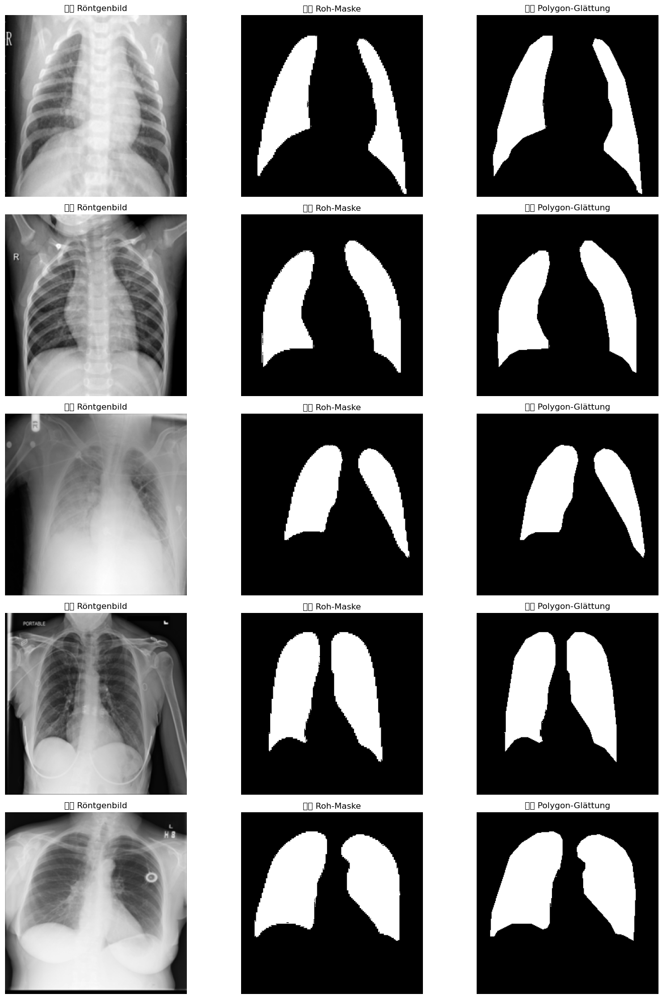

In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

#  Polygon smoothing
def smooth_contour_poly(mask, epsilon=2.0):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    smoothed = np.zeros_like(mask)
    for cnt in contours:
        approx = cv2.approxPolyDP(cnt, epsilon, closed=True)
        cv2.drawContours(smoothed, [approx], -1, color=255, thickness=-1)
    return smoothed

#  Directories
BASE_DIR = r"C:\Users\majas\Desktop\masken 2\bearebeietete röngenbilder 2"
MODEL_PATH = r"C:\Users\majas\Desktop\masken 2\hard examples models\2 finetuning\finetuned_model_best.keras"

#  Load model
model = tf.keras.models.load_model(MODEL_PATH, compile=False)

#  Collect 5 random image paths
def collect_image_paths(base_path, limit=5):
    all_image_paths = []
    for cls in os.listdir(base_path):
        image_dir = os.path.join(base_path, cls, "images")
        if os.path.isdir(image_dir):
            all_image_paths.extend([
                os.path.join(image_dir, f) for f in os.listdir(image_dir)
                if f.endswith((".png", ".jpg", ".jpeg"))
            ])
    return random.sample(all_image_paths, min(limit, len(all_image_paths)))

image_paths = collect_image_paths(BASE_DIR, limit=5)

#  Display
fig, axs = plt.subplots(5, 3, figsize=(15, 20))

for i, img_path in enumerate(image_paths):
    image_tf = tf.io.read_file(img_path)
    image_tf = tf.image.decode_png(image_tf, channels=1)
    image_tf = tf.image.resize(image_tf, [256, 256]) / 255.0
    input_tensor = tf.expand_dims(image_tf, axis=0)

    pred = model(input_tensor, training=False).numpy()[0]
    binary_mask = (pred > 0.5).astype(np.uint8) * 255
    poly_mask = smooth_contour_poly(binary_mask, epsilon=2.0)

    axs[i, 0].imshow(image_tf.numpy().squeeze(), cmap="gray")
    axs[i, 0].set_title(" X-ray Image")
    axs[i, 1].imshow(binary_mask.squeeze(), cmap="gray")
    axs[i, 1].set_title(" Raw Prediction")
    axs[i, 2].imshow(poly_mask.squeeze(), cmap="gray")
    axs[i, 2].set_title(" Polygon Smoothing")

    for ax in axs[i]:
        ax.axis("off")

plt.tight_layout()
plt.show()


hand out the worst masks

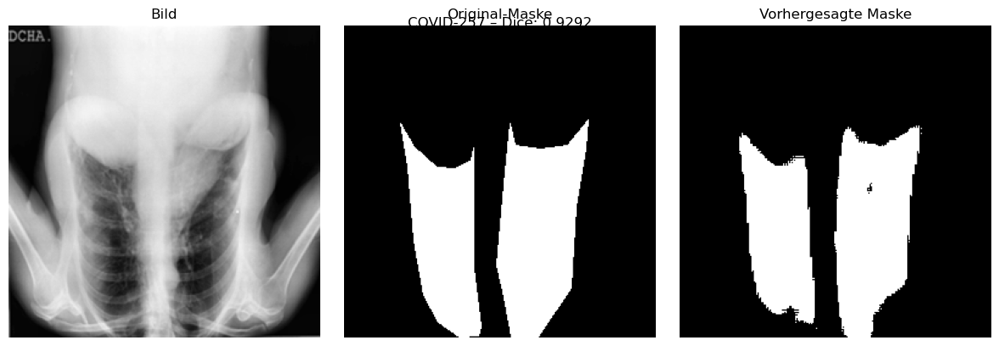

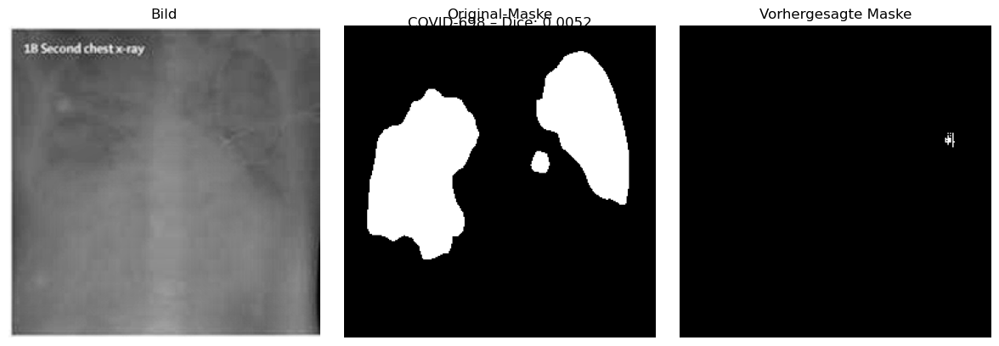

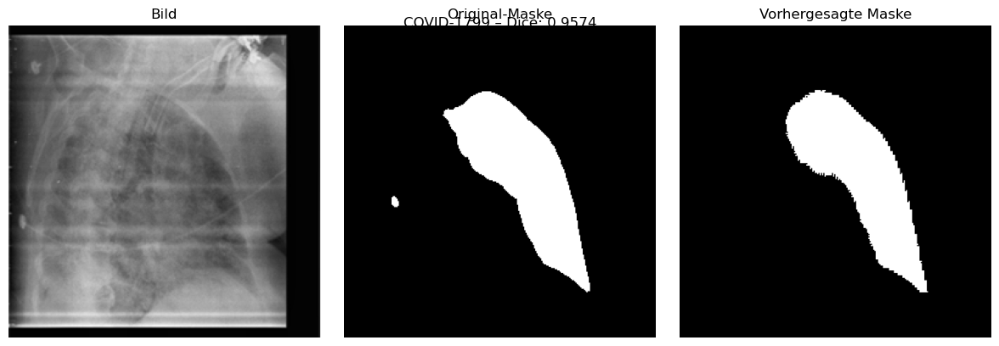

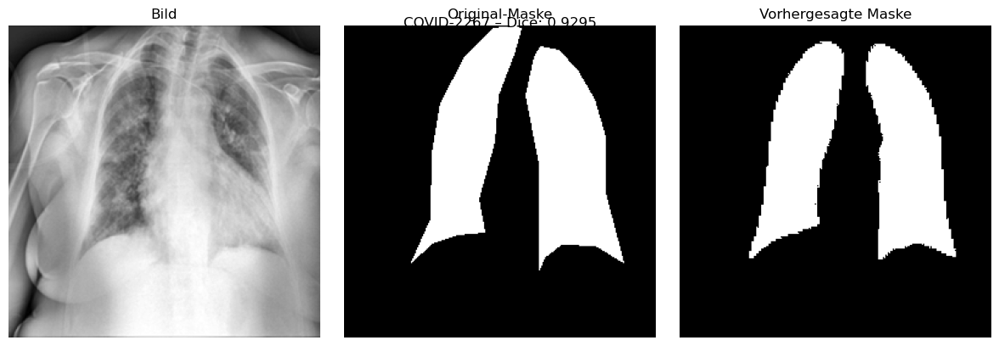

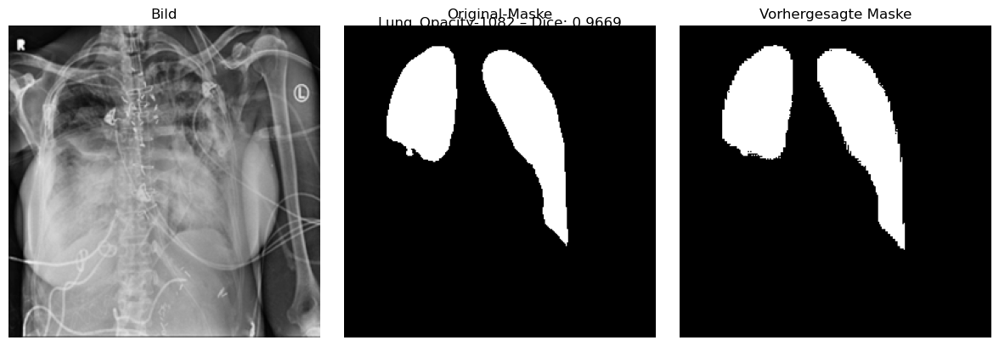

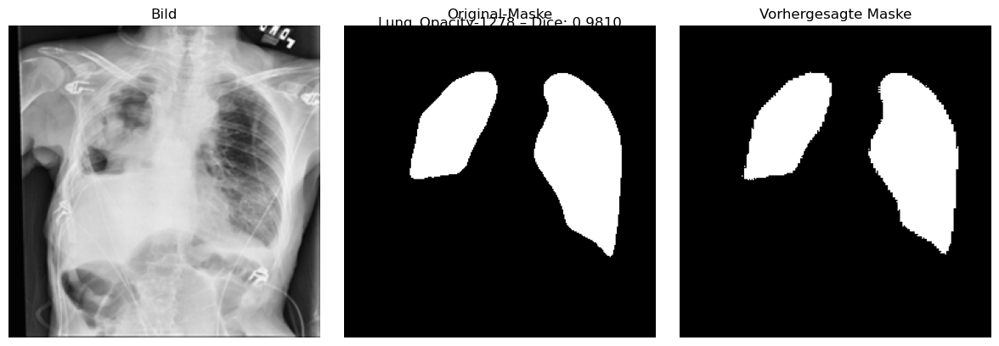

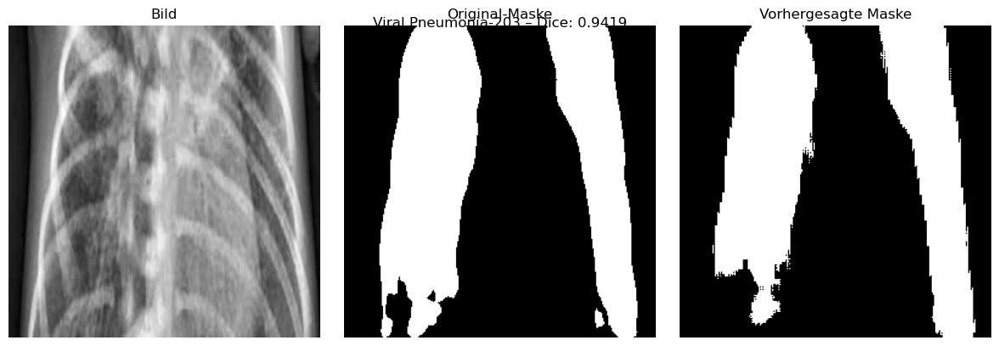

In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow.keras.backend as K

#  If the model was saved with custom_loss, you need these definitions:
def dice_coefficient(y_true, y_pred):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred)
    return (2. * intersection + 1e-6) / (union + 1e-6)

def iou_metric(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    return (intersection + 1e-6) / (union + 1e-6)

def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

def combined_loss(y_true, y_pred):
    return 0.5 * dice_loss(y_true, y_pred) + 0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred)

bce_logits = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction="none")

def gan_loss(logits, is_real=True):
    targets = 0.9 * tf.ones_like(logits) if is_real else 0.1 * tf.zeros_like(logits)
    return tf.reduce_mean(bce_logits(targets, logits))

def combined_loss(y_true, y_pred, disc_pred=None, adv_weight=0.05):
    seg_loss = 0.5 * dice_loss(y_true, y_pred) + 0.5 * focal_loss(y_true, y_pred)
    if disc_pred is not None:
        adv_loss = gan_loss(disc_pred, is_real=True)
        return seg_loss + adv_weight * tf.cast(adv_loss, tf.float32)
    return seg_loss

#  Settings
MODEL_PATH = r"C:\Users\majas\Desktop\masken 2\hard examples models\2 finetuning\finetuned_model_best.keras"
BASE_DIR = r"C:\Users\majas\Desktop\besonders schlechte masken\bearbeitete_xrays"
SELECTED_IDS = [
    "COVID-257", "COVID-698", "COVID-1799", "COVID-2267",
    "Lung_Opacity-1082", "Lung_Opacity-1278", "Viral Pneumonia-203"
]

#  Load model with custom_objects
model = tf.keras.models.load_model(
    MODEL_PATH,
    custom_objects={
        "combined_loss": combined_loss,
        "dice_coefficient": dice_coefficient,
        "iou_metric": iou_metric
    }
)

#  Image/mask loading function
def load_image_and_mask(image_path, mask_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_png(img, channels=1)
    img = tf.image.resize(img, [256, 256]) / 255.0

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.image.resize(mask, [256, 256])
    mask = tf.where(mask > 0.5, 1.0, 0.0)

    return img, mask

#  Plot function
def plot_prediction(image, true_mask, pred_mask, title):
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(tf.squeeze(image), cmap='gray')
    axes[0].set_title("Image")
    axes[1].imshow(tf.squeeze(true_mask), cmap='gray')
    axes[1].set_title("Ground Truth Mask")
    axes[2].imshow(tf.squeeze(pred_mask), cmap='gray')
    axes[2].set_title("Predicted Mask")
    for ax in axes:
        ax.axis("off")
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

#  Loop over selected image IDs
for file_id in SELECTED_IDS:
    cls = file_id.split("-")[0] if "-" in file_id else file_id.split("_")[0]
    image_path = os.path.join(BASE_DIR, cls, "images", f"{file_id}.png")
    mask_path = os.path.join(BASE_DIR, cls, "masks", f"{file_id}.png")

    if not os.path.exists(image_path) or not os.path.exists(mask_path):
        print(f" File not found: {file_id}")
        continue

    img, true_mask = load_image_and_mask(image_path, mask_path)
    pred_mask = model(tf.expand_dims(img, 0), training=False)
    pred_mask = tf.where(pred_mask > 0.5, 1.0, 0.0)

    # ➕ Calculate Dice score
    dice = dice_coefficient(true_mask.numpy(), pred_mask.numpy())

    #  Plot with Dice score
    plot_prediction(img, true_mask, pred_mask[0], title=f"{file_id} – Dice: {dice:.4f}")


# another training attempt

read data record

In [ ]:
import os
import tensorflow as tf
from sklearn.model_selection import train_test_split

#  Directories
BASE_PROCESSED_DIR = r"C:\Users\majas\Desktop\besonders schlechte masken\bearbeitete_xrays"

#  Function: Collect images & masks
def collect_processed_images_and_masks(base_dir):
    image_paths, mask_paths = []

    for cls in ["COVID", "Normal", "Lung_Opacity", "Viral Pneumonia"]:
        images_dir = os.path.join(base_dir, cls, "images")
        masks_dir = os.path.join(base_dir, cls, "masks")

        if not os.path.exists(images_dir) or not os.path.exists(masks_dir):
            print(f"⚠ WARNING: Missing folder for class '{cls}', skipping...")
            continue

        img_files = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith((".png", ".jpg", ".jpeg"))])
        mask_files = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith((".png", ".jpg", ".jpeg"))])

        if len(img_files) != len(mask_files):
            print(f"⚠ WARNING: Class '{cls}' has {len(img_files)} images but {len(mask_files)} masks!")

        image_paths.extend(img_files)
        mask_paths.extend(mask_files)

    return image_paths, mask_paths

#  Collect image & mask paths
image_paths, mask_paths = collect_processed_images_and_masks(BASE_PROCESSED_DIR)

if len(image_paths) == 0 or len(mask_paths) == 0:
    raise ValueError(" ERROR: No processed images or masks found! Check the dataset folder.")

print(f"📊 Total images: {len(image_paths)}, Total masks: {len(mask_paths)}")

#  Split into Train (70%), Validation (20%), Test (10%)
train_images, temp_images, train_masks, temp_masks = train_test_split(image_paths, mask_paths, test_size=0.3, random_state=42)
valid_images, test_images, valid_masks, test_masks = train_test_split(temp_images, temp_masks, test_size=0.33, random_state=42)

print(f"✅ Training: {len(train_images)} images")
print(f"✅ Validation: {len(valid_images)} images")
print(f"✅ Test: {len(test_images)} images")

#  NEW: Loader function with path
def load_image_and_mask_with_path(image_path, mask_path):
    # Load image
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=1)
    image = tf.image.resize(image, [256, 256]) / 255.0

    # Load mask
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.image.resize(mask, [256, 256]) / 255.0

    return image, mask, image_path  #  Return image path as well

#  Dataset creation with paths
def create_tf_dataset(image_paths, mask_paths, batch_size=8, shuffle=True):
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    dataset = dataset.map(load_image_and_mask_with_path, num_parallel_calls=tf.data.AUTOTUNE)

    if shuffle:
        dataset = dataset.shuffle(buffer_size=1000)

    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

#  Create Train, Validation & Test Datasets
train_dataset = create_tf_dataset(train_images, train_masks, batch_size=4, shuffle=True)
valid_dataset = create_tf_dataset(valid_images, valid_masks, batch_size=4, shuffle=False)
test_dataset  = create_tf_dataset(test_images,  test_masks,  batch_size=4, shuffle=False)

print("✅ Datasets with paths successfully created!")


load model

In [3]:
from tensorflow.keras.models import load_model

model_path = r"C:\Users\majas\Desktop\masken 2\entwickeltes masken model\entwickeltes_masken_model.h5"  # oder .keras
generator = load_model(model_path, compile=False)


Filter the worst masks from train, test and validation sets

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tqdm import tqdm
from pathlib import Path

# Dice Coefficient
def dice_coefficient(y_true, y_pred, smooth=1e-6):
    y_true = y_true.astype(np.float32)
    y_pred = y_pred.astype(np.float32)
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection + smooth) / (np.sum(y_true) + np.sum(y_pred) + smooth)

#  Main Evaluation Function
def evaluate_and_save_worst_samples(dataset, name, generator, num_worst=50):
    base_path = Path(r"C:\Users\majas\Desktop\besonders schlechte masken\finetuning datensatz")
    output_dir = base_path / name
    output_dir.mkdir(parents=True, exist_ok=True)

    dice_scores = []
    images, masks, predictions = [], [], []

    for batch in tqdm(dataset, desc=f" Evaluating {name}"):
        x_batch, y_true_batch, _ = batch

        x_batch = tf.cast(x_batch, tf.float32)
        if tf.reduce_max(x_batch) > 1.0:
            x_batch = x_batch / 255.0

        y_pred_batch = generator(x_batch, training=False).numpy()

        for i in range(len(x_batch)):
            x = x_batch[i].numpy()
            y_true = y_true_batch[i].numpy()
            y_pred = y_pred_batch[i]
            score = dice_coefficient(y_true, y_pred > 0.5)

            images.append(x)
            masks.append(y_true)
            predictions.append(y_pred)
            dice_scores.append(score)

    dice_scores = np.array(dice_scores)
    worst_indices = np.argsort(dice_scores)[:num_worst]

    for count, idx in enumerate(worst_indices):
        fig, axes = plt.subplots(1, 3, figsize=(12, 4))
        axes[0].imshow(images[idx].squeeze(), cmap='gray')
        axes[0].set_title("Original Image")
        axes[1].imshow(masks[idx].squeeze(), cmap='gray')
        axes[1].set_title("Ground Truth")
        axes[2].imshow((predictions[idx].squeeze() > 0.5).astype(np.float32), cmap='gray')
        axes[2].set_title(f"Prediction\nDice: {dice_scores[idx]:.4f}")
        for ax in axes:
            ax.axis('off')
        plt.tight_layout()
        filename = output_dir / f"{name}_worst_{count+1:02d}_dice_{dice_scores[idx]:.4f}.png"
        plt.savefig(filename)
        plt.close()

    print(f" Saved {num_worst} worst examples from {name} to: {output_dir}")

    #  Return results for further use
    return {
        "dice_scores": dice_scores,
        "images": images,
        "masks": masks,
        "predictions": predictions
    }

#  Evaluate datasets
results_train = evaluate_and_save_worst_samples(train_dataset, "train", generator)
results_valid = evaluate_and_save_worst_samples(valid_dataset, "valid", generator)
results_test  = evaluate_and_save_worst_samples(test_dataset, "test", generator)

#  Combine results
dice_scores_all = np.concatenate([
    results_train["dice_scores"],
    results_valid["dice_scores"],
    results_test["dice_scores"]
])

images_all = results_train["images"] + results_valid["images"] + results_test["images"]
masks_all = results_train["masks"] + results_valid["masks"] + results_test["masks"]
predictions_all = results_train["predictions"] + results_valid["predictions"] + results_test["predictions"]

#  Optional: Store globally for later use
globals().update({
    "dice_scores_all": dice_scores_all,
    "images_all": images_all,
    "masks_all": masks_all,
    "predictions_all": predictions_all
})


🔍 Evaluating train: 100%|██████████| 3704/3704 [25:22<00:00,  2.43it/s]


✅ 50 schlechteste Beispiele aus train gespeichert unter: C:\Users\majas\Desktop\besonders schlechte masken\finetuning datensatz\train


🔍 Evaluating valid: 100%|██████████| 1064/1064 [07:09<00:00,  2.48it/s]


✅ 50 schlechteste Beispiele aus valid gespeichert unter: C:\Users\majas\Desktop\besonders schlechte masken\finetuning datensatz\valid


🔍 Evaluating test: 100%|██████████| 524/524 [03:44<00:00,  2.33it/s]


✅ 50 schlechteste Beispiele aus test gespeichert unter: C:\Users\majas\Desktop\besonders schlechte masken\finetuning datensatz\test


In [ ]:
import imageio.v2 as imageio
from pathlib import Path
import numpy as np

# Target directory
output_dir = Path(r"C:\Users\majas\Desktop\besonders schlechte masken\finetuning_input")
output_dir.mkdir(parents=True, exist_ok=True)

# Sort Dice scores
dice_scores = np.array(dice_scores_all)
worst_indices = np.argsort(dice_scores)[:300]

# Save images, masks, and predictions
for count, idx in enumerate(worst_indices):
    img = (images_all[idx].squeeze() * 255).astype(np.uint8)
    msk = (masks_all[idx].squeeze() * 255).astype(np.uint8)
    pred = ((predictions_all[idx].squeeze() > 0.5) * 255).astype(np.uint8)

    imageio.imwrite(output_dir / f"image_{count+1:03d}.png", img)
    imageio.imwrite(output_dir / f"mask_{count+1:03d}.png", msk)
    imageio.imwrite(output_dir / f"prediction_{count+1:03d}.png", pred)

print("✅ Saved 300 worst images, masks, and predictions.")


✅ 300 schlechteste Bilder, Masken und Vorhersagen gespeichert.


create a dataset from the bad images and masks

In [ ]:
import tensorflow as tf
import os
from pathlib import Path
from PIL import Image
from sklearn.model_selection import train_test_split

#  Directories
image_dir = Path(r"C:\Users\majas\Desktop\besonders schlechte masken\finetuning datensatz\images")
mask_dir = Path(r"C:\Users\majas\Desktop\besonders schlechte masken\finetuning datensatz\maken")

# 📄 List and sort filenames
image_paths = sorted([str(p) for p in image_dir.glob("*.png")])
mask_paths = sorted([str(p) for p in mask_dir.glob("*.png")])

print(" Images:", len(image_paths))
print(" Masks:", len(mask_paths))

#  Function to load & preprocess images and masks
def load_image_mask(image_path, mask_path):
    try:
        image = tf.io.read_file(image_path)
        image = tf.image.decode_png(image, channels=1)
        image = tf.image.convert_image_dtype(image, tf.float32)

        #  Resize image
        image = tf.image.resize(image, [256, 256])

        mask = tf.io.read_file(mask_path)
        mask = tf.image.decode_png(mask, channels=1)
        mask = tf.cast(mask > 127, tf.float32)

        #  Resize mask
        mask = tf.image.resize(mask, [256, 256])

        return image, mask
    except Exception as e:
        print(" Error with file:", image_path, mask_path)
        raise e

#  Validation: Display invalid files
for path in image_paths + mask_paths:
    try:
        with Image.open(path) as img:
            img.verify()
    except Exception as e:
        print(" Invalid image:", path, "| Error:", e)

#  Split into training and validation sets (80% / 20%)
train_imgs, val_imgs, train_masks, val_masks = train_test_split(
    image_paths, mask_paths, test_size=0.2, random_state=42
)

# 📦 Dataset function
def create_dataset(imgs, masks, batch_size=2, shuffle=True):
    ds = tf.data.Dataset.from_tensor_slices((imgs, masks))
    ds = ds.map(lambda x, y: load_image_mask(x, y), num_parallel_calls=tf.data.AUTOTUNE)
    if shuffle:
        ds = ds.shuffle(100)
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

#  Create separate datasets
train_ds = create_dataset(train_imgs, train_masks, batch_size=1, shuffle=True)
val_ds   = create_dataset(val_imgs, val_masks, batch_size=1, shuffle=False)


📸 Bilder: 299
🎭 Masken: 299


continue training the generator

In [ ]:
# Define loss function & optimizer (if not already done)
loss_fn = tf.keras.losses.BinaryCrossentropy(from_logits=False)
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5)

def dice_metric(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + 1e-6) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + 1e-6)

# Compile the model with Dice as a metric
generator.compile(optimizer=optimizer, loss=loss_fn, metrics=[dice_metric])


compile learning rate

In [16]:
loss_fn = tf.keras.losses.BinaryCrossentropy()
dice_metric = tf.keras.metrics.MeanIoU(num_classes=2)  # optional

generator.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss=loss_fn,
    metrics=[dice_metric]
)


start training

In [ ]:
from pathlib import Path
import os
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import tensorflow.keras.backend as K

#  Model path as Path object
model_path = Path(r"C:\Users\majas\Desktop\masken 2\entwickeltes masken model\entwickeltes_masken_model.h5")

#  Custom functions
def dice_coefficient(y_true, y_pred):
    numerator = 2 * K.sum(y_true * y_pred) + 1e-6
    denominator = K.sum(y_true + y_pred) + 1e-6
    return numerator / denominator

def iou_metric(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    return (intersection + 1e-6) / (union + 1e-6)

def dice_loss(y_true, y_pred):
    return 1 - dice_coefficient(y_true, y_pred)

def combined_loss(y_true, y_pred):
    return 0.5 * dice_loss(y_true, y_pred) + 0.5 * tf.keras.losses.binary_crossentropy(y_true, y_pred)

#  custom_objects dictionary
custom_objects = {
    "dice_coefficient": dice_coefficient,
    "iou_metric": iou_metric,
    "dice_loss": dice_loss,
    "combined_loss": combined_loss
}

#  Check existence
print("Does folder exist?", model_path.parent.exists())
print("Does file exist?", model_path.exists())

# File must exist
assert model_path.exists(), f" Model not found at: {model_path}"

#  Load model
generator = load_model(str(model_path), custom_objects=custom_objects)

#  Compile model
generator.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss=combined_loss,
    metrics=[dice_coefficient, iou_metric]
)

#  Save directory
SAVE_DIR = Path(r"C:\Users\majas\Desktop\masken 2\last model")
SAVE_DIR.mkdir(parents=True, exist_ok=True)
checkpoint_path = SAVE_DIR / "last_model_best.keras"

#  Callbacks
checkpoint_cb = ModelCheckpoint(
    filepath=str(checkpoint_path),
    monitor='loss',
    save_best_only=True,
    save_weights_only=False,
    verbose=1
)

earlystop_cb = EarlyStopping(
    monitor='loss',
    patience=3,
    restore_best_weights=True,
    verbose=1
)

reduce_lr_cb = ReduceLROnPlateau(
    monitor='loss',
    factor=0.5,
    patience=2,
    min_lr=1e-6,
    verbose=1
)

#  Start fine-tuning
history = generator.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    callbacks=[checkpoint_cb, earlystop_cb, reduce_lr_cb],
    verbose=1
)

#  Save final version
generator.save(SAVE_DIR / "last_model_final.keras")


📂 Existiert Ordner? True
📄 Existiert Datei? True
Epoch 1/50
239/239 [==============================] - ETA: 0s - loss: 0.0585 - dice_coefficient: 0.9566 - iou_metric: 0.9181
Epoch 1: loss improved from inf to 0.05854, saving model to C:\Users\majas\Desktop\masken 2\last model\last_model_best.keras
239/239 [==============================] - 176s 710ms/step - loss: 0.0585 - dice_coefficient: 0.9566 - iou_metric: 0.9181 - val_loss: 0.0553 - val_dice_coefficient: 0.9593 - val_iou_metric: 0.9224 - lr: 1.0000e-05
Epoch 2/50
239/239 [==============================] - ETA: 0s - loss: 0.0473 - dice_coefficient: 0.9608 - iou_metric: 0.9252
Epoch 2: loss improved from 0.05854 to 0.04729, saving model to C:\Users\majas\Desktop\masken 2\last model\last_model_best.keras
239/239 [==============================] - 168s 704ms/step - loss: 0.0473 - dice_coefficient: 0.9608 - iou_metric: 0.9252 - val_loss: 0.0521 - val_dice_coefficient: 0.9589 - val_iou_metric: 0.9216 - lr: 1.0000e-05
Epoch 3/50
239/239 

test on entire data set

read data record

In [ ]:
import os
import tensorflow as tf
from sklearn.model_selection import train_test_split

#  Directories
BASE_PROCESSED_DIR = r"C:\Users\majas\Desktop\besonders schlechte masken\bearbeitete_xrays"

#  Function: Collect images & masks
def collect_processed_images_and_masks(base_dir):
    image_paths, mask_paths = []

    for cls in ["COVID", "Normal", "Lung_Opacity", "Viral Pneumonia"]:
        images_dir = os.path.join(base_dir, cls, "images")
        masks_dir = os.path.join(base_dir, cls, "masks")

        if not os.path.exists(images_dir) or not os.path.exists(masks_dir):
            print(f" WARNING: Missing folders for class '{cls}', skipping...")
            continue

        img_files = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith((".png", ".jpg", ".jpeg"))])
        mask_files = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith((".png", ".jpg", ".jpeg"))])

        if len(img_files) != len(mask_files):
            print(f" WARNING: Class '{cls}' has {len(img_files)} images but {len(mask_files)} masks!")

        image_paths.extend(img_files)
        mask_paths.extend(mask_files)

    return image_paths, mask_paths

#  Collect images & masks
image_paths, mask_paths = collect_processed_images_and_masks(BASE_PROCESSED_DIR)

if len(image_paths) == 0 or len(mask_paths) == 0:
    raise ValueError(" ERROR: No processed images or masks found! Please check the dataset directory.")

print(f" Total data for testing: {len(image_paths)} images / masks")

#  Load function: Read and normalize images & masks
def load_image_and_mask(image_path, mask_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=1)         # -> [H, W, 1]
    image = tf.image.resize(image, [384, 384])
    image = image / 255.0

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)           # -> [H, W, 1]
    mask = tf.image.resize(mask, [384, 384])
    mask = tf.cast(mask, tf.float32) / 255.0
    mask = tf.where(mask > 0.5, 1.0, 0.0)                   # Binarize

    return image, mask

#  Optional: Additional resize transformation to 256x256
def resize_to_256(image, mask):
    image = tf.image.resize(image, [256, 256])
    mask = tf.image.resize(mask, [256, 256])
    return image, mask

#  Create dataset from all data
def create_full_test_dataset(image_paths, mask_paths, batch_size=1):
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    dataset = dataset.map(load_image_and_mask, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.map(resize_to_256, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

#  Now: use full dataset as test dataset
full_test_dataset = create_full_test_dataset(image_paths, mask_paths, batch_size=1)
print(" Full test dataset with all images/masks created!")

# 💡 Debug: Check shape
for img, mask in full_test_dataset.take(1):
    print(" Image shape:", img.shape)     # Should be [1, 256, 256, 1]
    print(" Mask shape:", mask.shape)     # Should be [1, 256, 256, 1]

# 📊 Count number of items in test dataset
num_samples = sum(1 for _ in full_test_dataset)
print(f" Number of image-mask pairs in the final test dataset: {num_samples}")


📊 Gesamtdaten für Test: 21165 Bilder / Masken
✅ Vollständiger Testdatensatz mit allen Bildern/Masks erstellt!
📐 Bildform: (1, 256, 256, 1)
📐 Maskenform: (1, 256, 256, 1)
🧾 Anzahl der Bild-Masken-Paare im finalen Testdatensatz: 21165


load model

In [ ]:
from tensorflow.keras.models import load_model

model_path = r"C:\Users\majas\Desktop\masken 2\last model\last_model_best.keras"

model = load_model(model_path, compile=False)
print("Model loaded successfully!")


📦 Lade Modell...
✅ Modell erfolgreich geladen!


📦 Lade Modell...
✅ Modell erfolgreich geladen!

🚀 Starte Auswertung über den vollständigen Testdatensatz...



Berechnung läuft:   0%|          | 0/21165 [00:00<?, ?it/s]


📸 Beispiel 1
• Dice: 0.9817 | IoU: 0.9641 | Loss: 0.0446
• Ground Truth Sum: 15359 | Prediction Sum: 15680


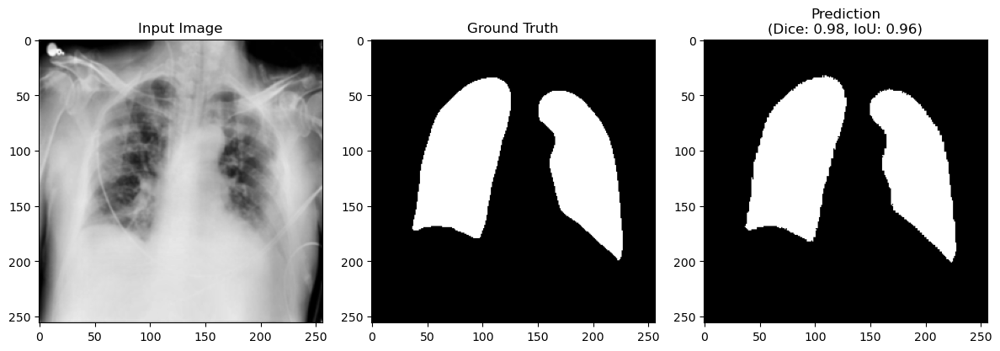

Berechnung läuft:   0%|          | 1/21165 [00:02<12:28:07,  2.12s/it]


📸 Beispiel 1
• Dice: 0.9813 | IoU: 0.9632 | Loss: 0.0541
• Ground Truth Sum: 17225 | Prediction Sum: 17764


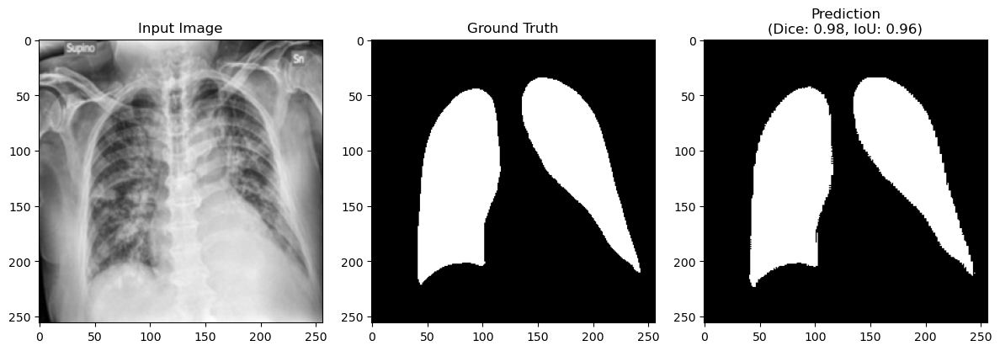

Berechnung läuft:   0%|          | 2/21165 [00:02<7:28:47,  1.27s/it] 


📸 Beispiel 1
• Dice: 0.9856 | IoU: 0.9716 | Loss: 0.0391
• Ground Truth Sum: 15102 | Prediction Sum: 15410


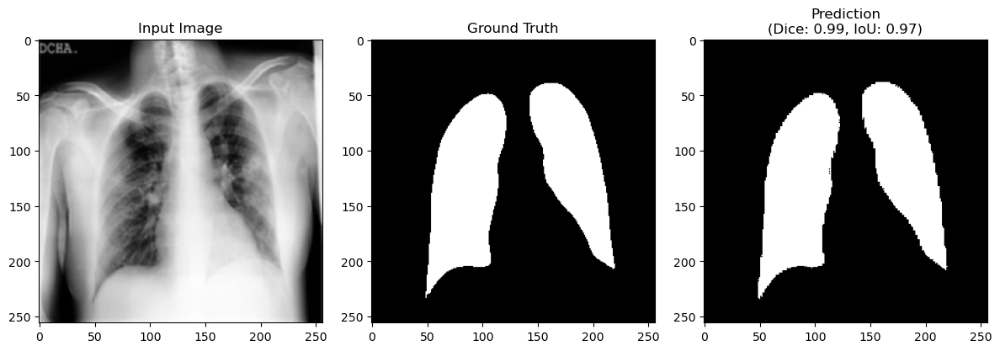

Berechnung läuft:   0%|          | 3/21165 [00:03<5:50:43,  1.01it/s]


📸 Beispiel 1
• Dice: 0.9804 | IoU: 0.9616 | Loss: 0.0542
• Ground Truth Sum: 16121 | Prediction Sum: 16597


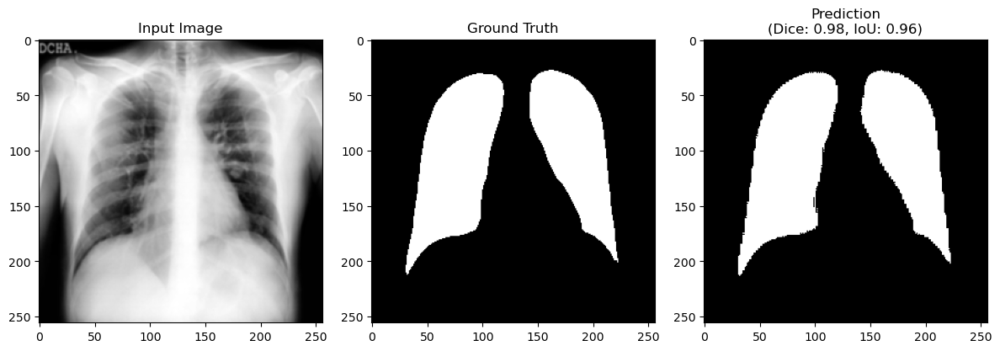

Berechnung läuft:   0%|          | 4/21165 [00:04<5:05:09,  1.16it/s]


📸 Beispiel 1
• Dice: 0.9769 | IoU: 0.9549 | Loss: 0.0487
• Ground Truth Sum: 9726 | Prediction Sum: 10095


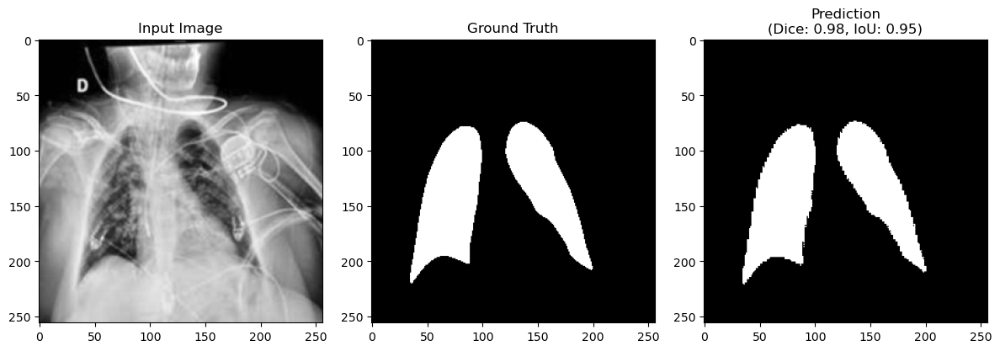

Berechnung läuft: 100%|██████████| 21165/21165 [1:24:51<00:00,  4.16it/s]


📊 Ergebnisse auf dem vollständigen Testdatensatz:
• Durchschnittlicher Dice Score:     0.9780
• Durchschnittlicher IoU Score:      0.9572
• Durchschnittlicher Combined Loss:  0.0634


In [24]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from tensorflow.keras.models import load_model



# 📌 Testdatensatz vorbereiten
image_paths, mask_paths = collect_processed_images_and_masks(BASE_PROCESSED_DIR)
full_test_dataset = create_full_test_dataset(image_paths, mask_paths, batch_size=1)

# 3️⃣ Modell laden
model_path = r"C:\Users\majas\Desktop\masken 2\last model\last_model_best.keras"
print("📦 Lade Modell...")
model = load_model(model_path, compile=False)
print("✅ Modell erfolgreich geladen!")

# 📌 Dice- und IoU-Metriken
def dice_coefficient(y_true, y_pred, smooth=1e-6):
    intersection = tf.reduce_sum(y_true * y_pred, axis=[1,2,3])
    denominator = tf.reduce_sum(y_true, axis=[1,2,3]) + tf.reduce_sum(y_pred, axis=[1,2,3])
    dice = (2. * intersection + smooth) / (denominator + smooth)
    return tf.reduce_mean(dice)

def iou_metric(y_true, y_pred, smooth=1e-6):
    intersection = tf.reduce_sum(y_true * y_pred, axis=[1,2,3])
    union = tf.reduce_sum(y_true, axis=[1,2,3]) + tf.reduce_sum(y_pred, axis=[1,2,3]) - intersection
    iou = (intersection + smooth) / (union + smooth)
    return tf.reduce_mean(iou)

# 📌 Beispiel für Loss-Funktion (platzhalter, du musst combined_loss definieren)
def combined_loss(y_true, y_pred):
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    dice = dice_coefficient(y_true, y_pred)
    return bce + (1 - dice)

# 📌 Vorbereitung
# 📌 Vorbereitung
bad_example_count = 0
max_debug_examples = 5
dice_scores = []
iou_scores = []
losses = []

print("\n🚀 Starte Auswertung über den vollständigen Testdatensatz...\n")

# NEU: Counter für alle Beispiele
example_counter = 0

for img, true_mask in tqdm(full_test_dataset, desc="Berechnung läuft"):
    img = tf.cast(img, tf.float32)
    true_mask = tf.cast(true_mask, tf.float32)
    true_mask = tf.where(true_mask > 0.5, 1.0, 0.0)

    pred_mask = model.predict(img, verbose=0)
    pred_binary = tf.cast((pred_mask > 0.5), tf.float32)

    dice = dice_coefficient(true_mask, pred_binary).numpy().item()
    iou = iou_metric(true_mask, pred_binary).numpy().item()
    loss = tf.reduce_mean(combined_loss(true_mask, pred_mask)).numpy().item()

    dice_scores.append(dice)
    iou_scores.append(iou)
    losses.append(loss)

    true_sum = tf.reduce_sum(true_mask).numpy()
    pred_sum = tf.reduce_sum(pred_binary).numpy()

    # 👉 Bild anzeigen, wenn es zu den ersten 3 gehört oder wenn Dice schlecht ist
    
        # 👉 Bild anzeigen, wenn es zu den ersten 3 gehört oder wenn Dice schlecht ist
    if example_counter < 3 or dice < 0.5:
        if bad_example_count < max_debug_examples:
            print(f"\n📸 Beispiel {example_counter + 1}")
            print(f"• Dice: {dice:.4f} | IoU: {iou:.4f} | Loss: {loss:.4f}")
            print(f"• Ground Truth Sum: {true_sum:.0f} | Prediction Sum: {pred_sum:.0f}")

            fig, axs = plt.subplots(1, 3, figsize=(12, 4))
            axs[0].imshow(tf.squeeze(img[0]), cmap='gray')
            axs[0].set_title("Input Image")
            axs[1].imshow(tf.squeeze(true_mask[0]), cmap='gray')
            axs[1].set_title("Ground Truth")
            axs[2].imshow(tf.squeeze(pred_binary[0]), cmap='gray')
            axs[2].set_title(f"Prediction\n(Dice: {dice:.2f}, IoU: {iou:.2f})")
            plt.tight_layout()
            plt.show()

            bad_example_count += 1




# 📊 Ergebnisse anzeigen
mean_dice = np.mean(dice_scores)
mean_iou = np.mean(iou_scores)
mean_loss = np.mean(losses)

print("\n📊 Ergebnisse auf dem vollständigen Testdatensatz:")
print(f"• Durchschnittlicher Dice Score:     {mean_dice:.4f}")
print(f"• Durchschnittlicher IoU Score:      {mean_iou:.4f}")
print(f"• Durchschnittlicher Combined Loss:  {mean_loss:.4f}")


In [1]:
import tensorflow as tf
tf.__version__


'2.10.0'